# 4 Google Trends and Crypto Prices

In [1]:
#Imports
# General Import
import pandas as pd
import numpy as np 

# Local Import
import sys
package_path = '/home/Lakehouse/DreamBrookPy/src'
if package_path not in sys.path:
    sys.path.append(package_path)
import DreamBrookPy.MachineLearning as ML
import DreamBrookPy.DataChef as DC

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
2024-04-28 00:30:50.940364: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-04-28 00:30:51.127142: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-04-28 00:30:51.821759: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-28 00:30:54.303790: W tensorflow/compiler/tf2te

In [136]:
import importlib
importlib.reload(ML)
importlib.reload(DC)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


<module 'DreamBrookPy.DataChef' from '/home/Lakehouse/DreamBrookPy/src/DreamBrookPy/DataChef.py'>

In [21]:
import sys
print(sys.executable)

/root/anaconda3/envs/DreamBrookPy/bin/python3


In [20]:
import mplfinance as mpf

In [19]:
import matplotlib
import matplotlib.pyplot as plt
import warnings

# Ignore UserWarnings
warnings.filterwarnings(action='ignore', category=UserWarning)

## Goals:

1.Data Analysis :: EDA (10 points)
Conduct exploratory data analysis (EDA) on the dataset. What valuable insights can be derived from this analysis?

2.Data Analysis :: Past vs Current Trends Cycles (10 points)
Contrast present Google Trends data with those from preceding cycles. What does this comparative analysis unveil regarding the ongoing cycle?

3.Correlations :: Token Price vs Trends  (5 points)
Determine the correlation between token prices and their associated Google Trends. What are the implications of this correlation?

4.Correlations :: Time Lag  (10 point)
Explore the ideal time lags that enhance the correlations, as mentioned earlier. What insights can be garnered from this investigation? [1W, 1D 4h 1h 15m 5m] Analyze these different time interval 

5.Correlations :: Token Patterns  (5 points)
Examine the correlation between trends of various tokens. Do they demonstrate comparable patterns?


6.Additional Data Sources (10 points)
Discover and incorporate an additional dataset to enrich your analysis. Rationalize your selection and extract fresh insights from it. [Latest Binance Data which is close to before and after halving events]


7.Machine Learning Model  (30 points)
Develop a machine learning model to forecast the Google Trends data of a selected token. Choose your preferred token from the provided list of twenty. [Build 3-5 Models?]


Report  (20 points)
Elaborate a comprehensive report incorporating analyses based on the previously outlined questions.
The report should address each question, providing insights and findings derived from the data. Please ensure your report adheres to the format and guidelines specified in the 'Report Guidelines' section.
It should include clear and well-structured sections corresponding to each analysis category, with relevant data visualizations and interpretations.
The report should effectively communicate your analytical approach, key findings, and any conclusions or recommendations you draw from the data.

## Dev Zone

In [22]:
# settings for plotting
# Figure properties\
tick_width = 2
tick_length = 8
matplotlib.rcParams['axes.linewidth'] = 2.5
matplotlib.rcParams['savefig.transparent'] = False
matplotlib.rcParams['figure.autolayout'] = False
matplotlib.rcParams['figure.constrained_layout.use'] = False
matplotlib.rcParams['axes.unicode_minus'] = False # using small minus sign (i.e. hypen-minus) and not the default unicode minus
matplotlib.rcParams["font.weight"] = "bold"
matplotlib.rcParams["axes.labelweight"] = "bold"
matplotlib.rcParams["axes.linewidth"] = 2.0
matplotlib.rcParams["axes.labelsize"] = 20
matplotlib.rcParams['savefig.dpi'] = 300

In [129]:
color_list = ['red','orange','black','navy','tomato','hotpink','lightseagreen','slategray','darkorange','goldenrod','black','orangered','blue',
 'dodgerblue','brown','burlywood','cadetblue','forestgreen','chocolate','midnightblue','cornflowerblue','indigo','crimson']

## Data Load

In [242]:
# load data 
datadir = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/dataset'

## Load list of prices dataset
f = 'prices'
file_format = '*.csv'
prices_items = DC.load_data_folder(f,datadir, file_format)

## Load list of trends dataset
f = 'trends'
file_format = '*.csv'
trends_items = DC.load_data_folder(f,datadir, file_format)

In [7]:
prices_items[:5]

['DOT-USD.csv', 'XMR-USD.csv', 'XRP-USD.csv', 'ETH-USD.csv', 'OCEAN-USD.csv']

In [8]:
trends_items[:5]

['ocean protocol.csv', 'bnb.csv', 'uniswap.csv', 'fetch.ai.csv', 'cardano.csv']

In [228]:
prices_raw_data_dict = {}
datadir = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/dataset/prices'
for f in prices_items:
    df = pd.read_csv(f'{datadir}/{f}',index_col=0,parse_dates=True)
    df.index.name='Date'
    new_entry = {f[:-4] : df}
    prices_raw_data_dict.update(new_entry)

In [243]:
trends_raw_data_dict = {}
datadir = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/dataset/trends'
for f in trends_items:
    df = pd.read_csv(f'{datadir}/{f}',skiprows = 2,index_col=0,parse_dates=True)
    new_entry = {f[:-4] : df}
    trends_raw_data_dict.update(new_entry)

In [12]:
prices_raw_data_dict.keys()

dict_keys(['DOT-USD', 'XMR-USD', 'XRP-USD', 'ETH-USD', 'OCEAN-USD', 'ROSE-USD', 'KCS-USD', 'DOGE-USD', 'BTC-USD', 'FET-USD', 'AGIX-USD', 'LTC-USD', 'UNI-USD', 'FIL-USD', 'CAKE-USD', 'BNB-USD', 'XTZ-USD', 'LINK-USD', 'ADA-USD', 'SOL-USD'])

In [13]:
trends_raw_data_dict.keys()

dict_keys(['ocean protocol', 'bnb', 'uniswap', 'fetch.ai', 'cardano', 'tezos', 'dogecoin', 'singularitynet', 'pancakeswap', 'oasis network', 'XRP', 'solana', 'bitcoin', 'chainlink', 'polkadot', 'litecoin', 'monero', 'filecoin', 'kucoin', 'ethereum'])

In [27]:
prices_raw_data_dict['DOT-USD']

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-08-20,2.787857,3.077784,2.692896,2.900080,2.900080,48819867
2020-08-21,2.896923,3.090093,2.730919,2.875028,2.875028,49313137
2020-08-22,2.878570,4.510613,2.816762,4.484690,4.484690,485801096
2020-08-23,4.487058,4.487058,3.716271,3.967066,3.967066,320749483
2020-08-24,3.987413,4.783158,3.812670,4.602614,4.602614,407690171
...,...,...,...,...,...,...
2024-04-05,8.490840,8.508145,8.094187,8.389035,8.389035,227938545
2024-04-06,8.389035,8.547805,8.344803,8.494186,8.494186,156072071
2024-04-07,8.493989,8.737575,8.467881,8.706726,8.706726,184130993


In [244]:
trends_raw_data_dict['ocean protocol']

,ocean protocol: (Worldwide)
Week,
2019-04-07,9
2019-04-14,13
2019-04-21,14
2019-04-28,32
2019-05-05,22
...,...
2024-03-10,55
2024-03-17,46
2024-03-24,100


In [ ]:
my_data_list = 

In [ ]:
trend_to_token_mapping = {
    "bitcoin.csv": "btc",
    "bnb.csv": "bnb",
    "cardano.csv": "ada",
    "chainlink.csv": "link",
    "dogecoin.csv": "doge",
    "ethereum.csv": "eth",
    "fetch.ai.csv": "fet",
    "filecoin.csv": "fil",
    "kucoin.csv": "kcs",
    "litecoin.csv": "ltc",
    "monero.csv": "xmr",
    "oasis network.csv": "rose",
    "ocean protocol.csv": "ocean",
    "pancakeswap.csv": "cake",
    "polkadot.csv": "dot",
    "singularitynet.csv": "agix",
    "solana.csv": "sol",
    "tezos.csv": "xtz",
    "uniswap.csv": "uni",
    "XRP.csv": "xrp"
}

In [ ]:
# Create Illustrative Dashboard for the report ?

In [ ]:
# Data Overview 

## 4.1 Exploratory Data Analysis
In the data exploration we want to put some focus on previous Before/After Halving pattern glitch or changes

Text(0.5, 1.0, 'DOT-USDT')

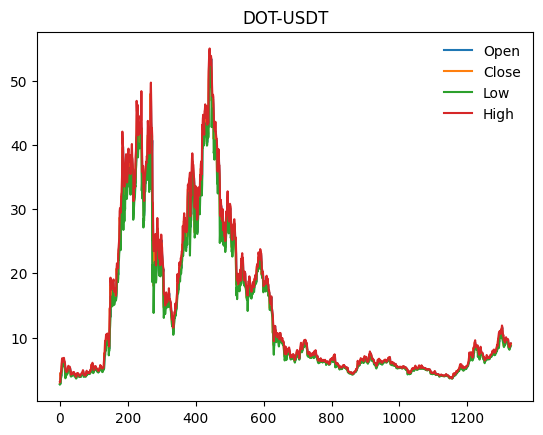

In [20]:
plt.plot(prices_raw_data_dict['DOT-USD']['Open'], label = 'Open')
plt.plot(prices_raw_data_dict['DOT-USD']['Close'], label = 'Close')
plt.plot(prices_raw_data_dict['DOT-USD']['Low'], label = 'Low')
plt.plot(prices_raw_data_dict['DOT-USD']['High'], label = 'High')
plt.legend(frameon=False)
plt.title('DOT-USDT')

In [20]:
data.index = data['Date']

In [21]:
data.index

Index(['2020-08-20', '2020-08-21', '2020-08-22', '2020-08-23', '2020-08-24',
       '2020-08-25', '2020-08-26', '2020-08-27', '2020-08-28', '2020-08-29',
       ...
       '2024-03-31', '2024-04-01', '2024-04-02', '2024-04-03', '2024-04-04',
       '2024-04-05', '2024-04-06', '2024-04-07', '2024-04-08', '2024-04-09'],
      dtype='object', name='Date', length=1329)

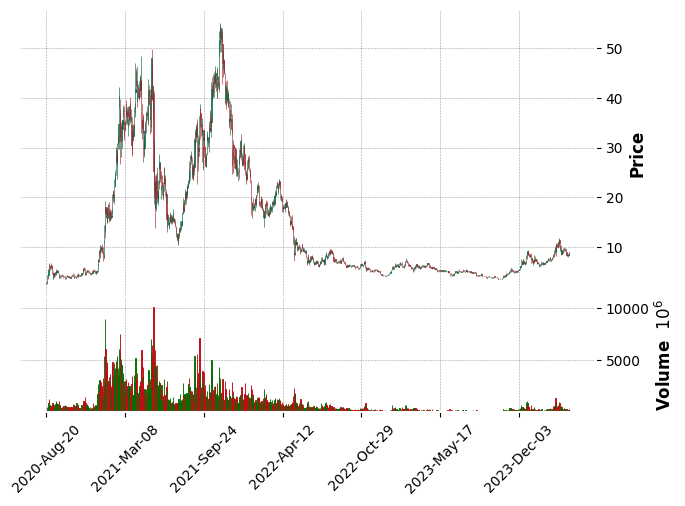

In [29]:


data = prices_raw_data_dict['DOT-USD']
# # Creating a list of dates for the predictions

# Plotting the actual data with mplfinance
mpf.plot(data, type='candle', style='charles', volume=True)



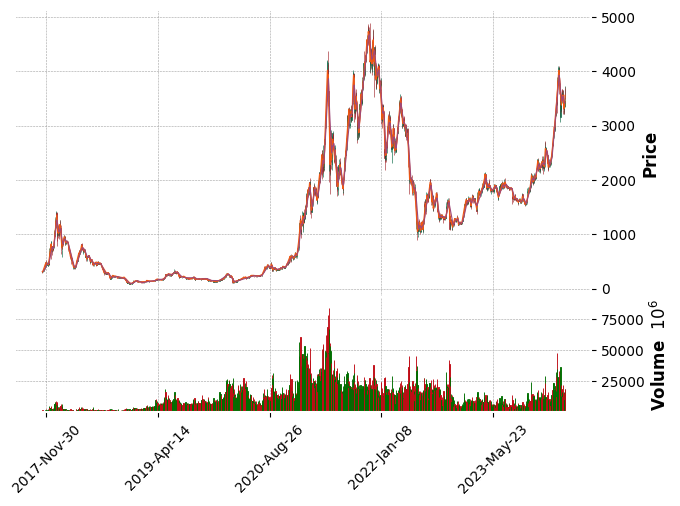

In [30]:

# Make sure it contains Open, High, Low, Close, and Volume columns
data = prices_raw_data_dict['ETH-USD']
# # Creating a list of dates for the predictions

# Plotting the actual data with mplfinance
mpf.plot(data, type='candle', style='charles', mav=(3,6,9),volume=True,show_nontrading=True)



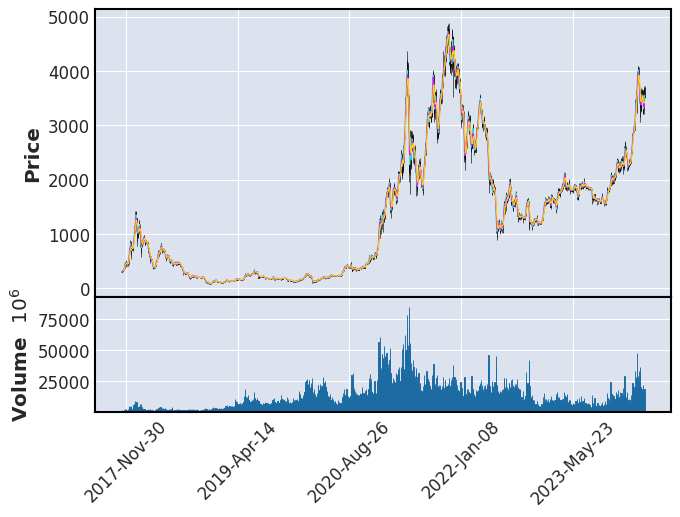

In [31]:

# Make sure it contains Open, High, Low, Close, and Volume columns
data = prices_raw_data_dict['ETH-USD']
# # Creating a list of dates for the predictions

# Plotting the actual data with mplfinance
mpf.plot(data, type='candle',mav=(3,6,9),volume=True,show_nontrading=True)



In [23]:
len(prices_raw_data_dict.keys())

20

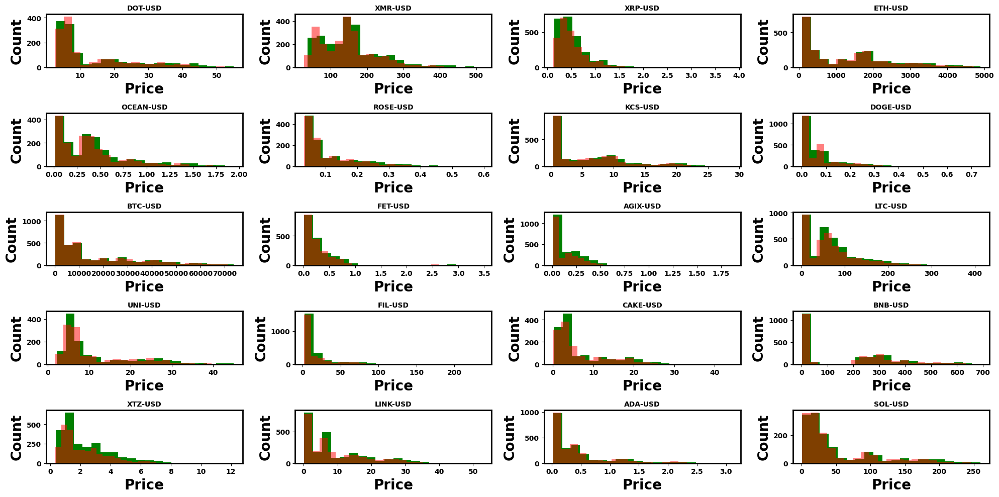

In [26]:
pair_list = list(prices_raw_data_dict.keys())
fig, axes = plt.subplots(5, 4, figsize=(20, 10))  # Creating a 5x4 grid of subplots

for c, co, (i, ax) in zip(pair_list, color_list, enumerate(axes.flatten())):
    df = prices_raw_data_dict[c]
    ax.hist(df['High'], bins=20, color='g')
    ax.hist(df['Low'], bins=20, color='r',alpha=0.5)
    ax.set_title(f'{c}', fontsize=10, fontweight='bold')
    ax.set_xlabel(r'Price')
    ax.set_ylabel(r'Count')

    # Save each subplot individually if needed
    # You might want to remove this if you're saving the whole figure later
    # plt.savefig(f'../Results/Activities_by_channel_{i}.png', dpi=300, bbox_inches='tight', transparent=False, facecolor='white')

# Adjust layout to prevent overlap
plt.tight_layout()

# Save the entire figure
plt.savefig('../results/Data_overview.png', dpi=300, bbox_inches='tight', transparent=False, facecolor='white')
# plt.show()

In [237]:
prices_raw_data_dict['BTC-USD']

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800
2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200
2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700
2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600
2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100
...,...,...,...,...,...,...
2024-04-05,68515.757813,68725.757813,66011.476563,67837.640625,67837.640625,33748230056
2024-04-06,67840.570313,69629.601563,67491.718750,68896.109375,68896.109375,19967785809
2024-04-07,68897.109375,70284.429688,68851.632813,69362.554688,69362.554688,21204930369


In [236]:
prices_raw_data_dict['ROSE-USD']

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-11-19,0.068019,0.068021,0.037390,0.038197,0.038197,38755818
2020-11-20,0.038197,0.042957,0.033579,0.035878,0.035878,17329732
2020-11-21,0.035878,0.039864,0.032672,0.037811,0.037811,16055734
2020-11-22,0.037811,0.042065,0.035263,0.041603,0.041603,10629011
2020-11-23,0.041602,0.053923,0.038529,0.046931,0.046931,24675225
...,...,...,...,...,...,...
2024-04-05,0.130019,0.130436,0.122446,0.128086,0.128086,25152663
2024-04-06,0.128082,0.130343,0.126546,0.129072,0.129072,12257838
2024-04-07,0.129072,0.130904,0.127090,0.128767,0.128767,20263545


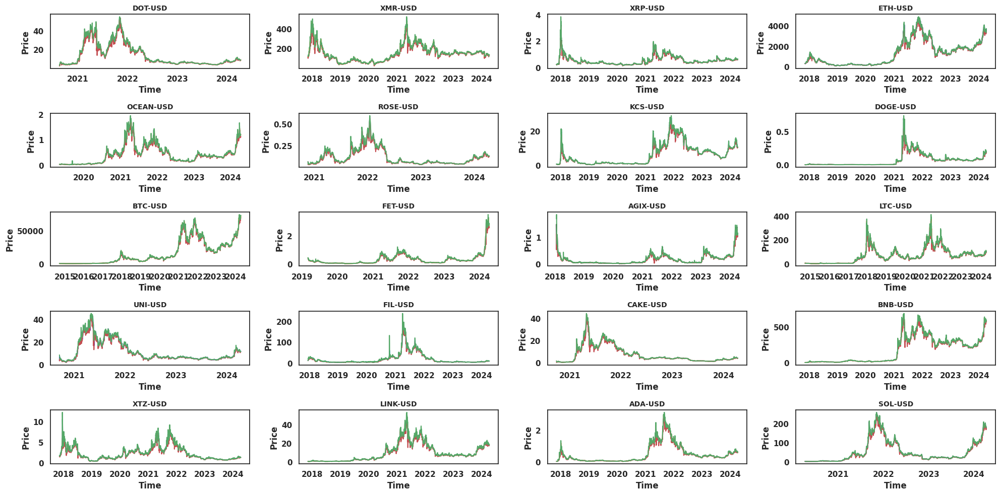

In [234]:
pair_list = list(prices_raw_data_dict.keys())
fig, axes = plt.subplots(5, 4, figsize=(20, 10))  # Creating a 5x4 grid of subplots

for c, co, (i, ax) in zip(pair_list, color_list, enumerate(axes.flatten())):
    df = prices_raw_data_dict[c]
    ax.plot(df.index,df['Open'], color=co)
    ax.plot(df.index,df['Low'],  color='r')
    ax.plot(df.index,df['High'], color='g')
    ax.set_title(f'{c}', fontsize=10, fontweight='bold')
    ax.set_ylabel(r'Price')
    ax.set_xlabel(r'Time')
    
    # Set the x-axis to show only the year
    ax.xaxis.set_major_locator(mdates.YearLocator())  # Only show one tick per year
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Show the year only


    # Save each subplot individually if needed
    # You might want to remove this if you're saving the whole figure later
    # plt.savefig(f'../Results/Activities_by_channel_{i}.png', dpi=300, bbox_inches='tight', transparent=False, facecolor='white')

# Adjust layout to prevent overlap
plt.tight_layout()

# Save the entire figure
plt.savefig('../results/Data_trend.png', dpi=300, bbox_inches='tight', transparent=False, facecolor='white')
# plt.show()

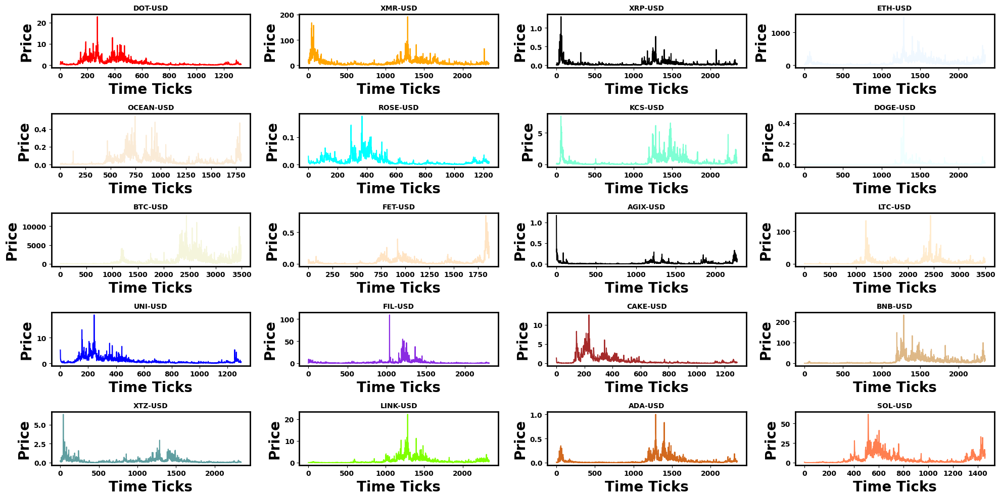

In [29]:
# Low high price difference over time 
pair_list = list(prices_raw_data_dict.keys())
fig, axes = plt.subplots(5, 4, figsize=(20, 10))  # Creating a 5x4 grid of subplots

for c, co, (i, ax) in zip(pair_list, color_list, enumerate(axes.flatten())):
    df = prices_raw_data_dict[c]
    # ax.plot(df['Open'], color=co)
    # ax.plot(df['Low'],  color='r')
    ax.plot(df['High']-df['Low'], color=co)
    ax.set_title(f'{c}', fontsize=10, fontweight='bold')
    ax.set_ylabel(r'Price')
    ax.set_xlabel(r'Time Ticks')

    # Save each subplot individually if needed
    # You might want to remove this if you're saving the whole figure later
    # plt.savefig(f'../Results/Activities_by_channel_{i}.png', dpi=300, bbox_inches='tight', transparent=False, facecolor='white')

# Adjust layout to prevent overlap
plt.tight_layout()

# Save the entire figure
plt.savefig('../results/price_diff.png', dpi=300, bbox_inches='tight', transparent=False, facecolor='white')
# plt.show()

In [229]:
pair_list = list(prices_raw_data_dict.keys())

In [230]:
pair_list

['DOT-USD',
 'XMR-USD',
 'XRP-USD',
 'ETH-USD',
 'OCEAN-USD',
 'ROSE-USD',
 'KCS-USD',
 'DOGE-USD',
 'BTC-USD',
 'FET-USD',
 'AGIX-USD',
 'LTC-USD',
 'UNI-USD',
 'FIL-USD',
 'CAKE-USD',
 'BNB-USD',
 'XTZ-USD',
 'LINK-USD',
 'ADA-USD',
 'SOL-USD']

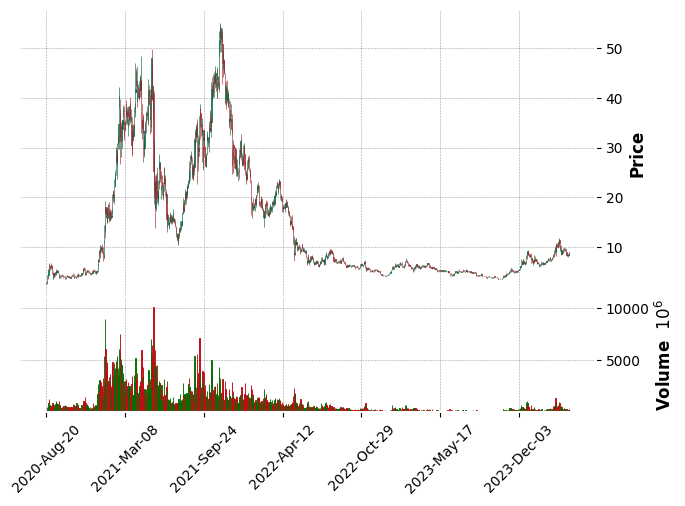

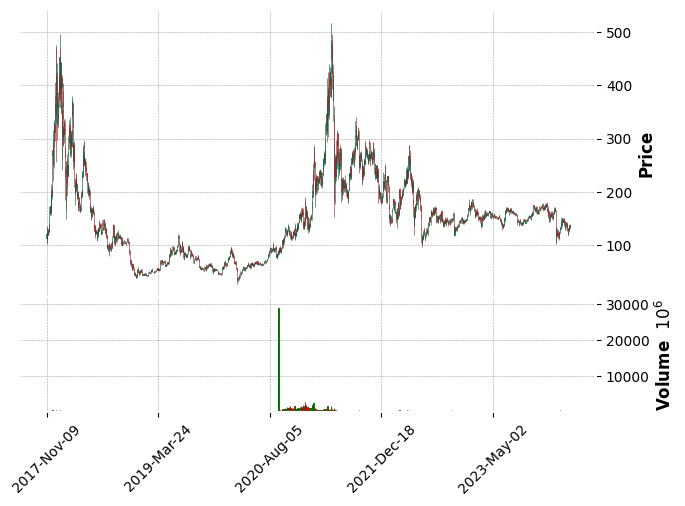

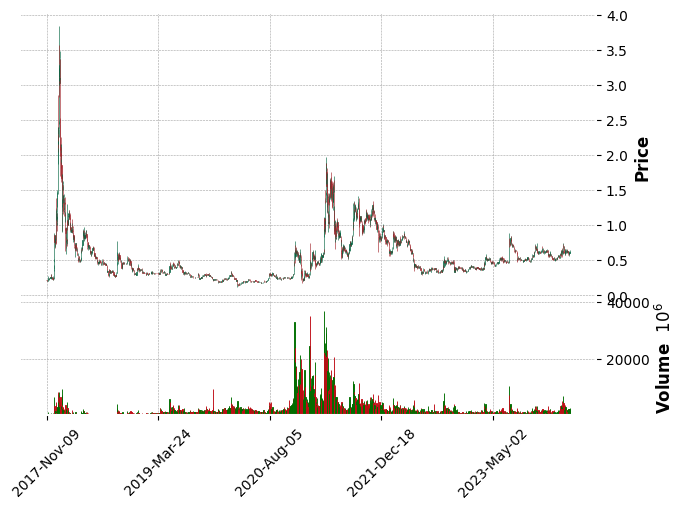

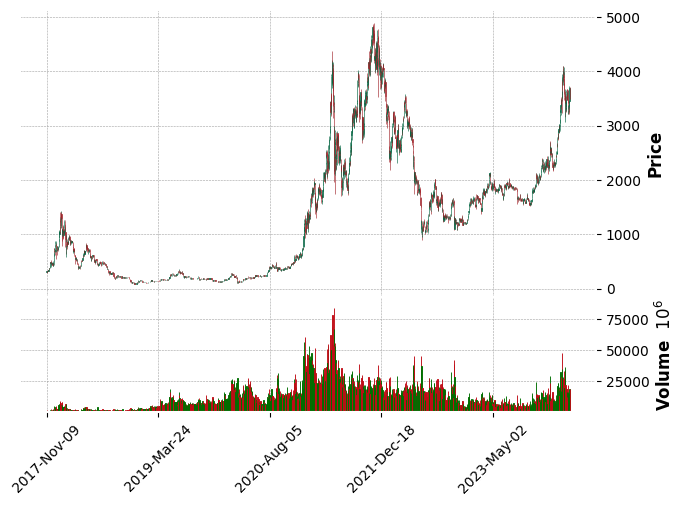

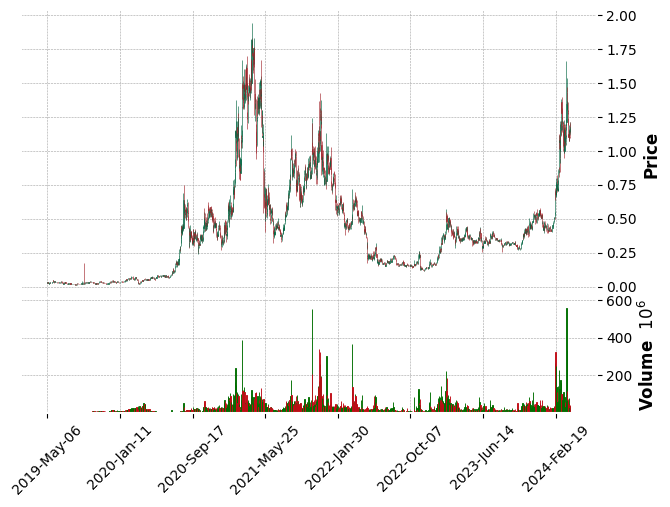

...

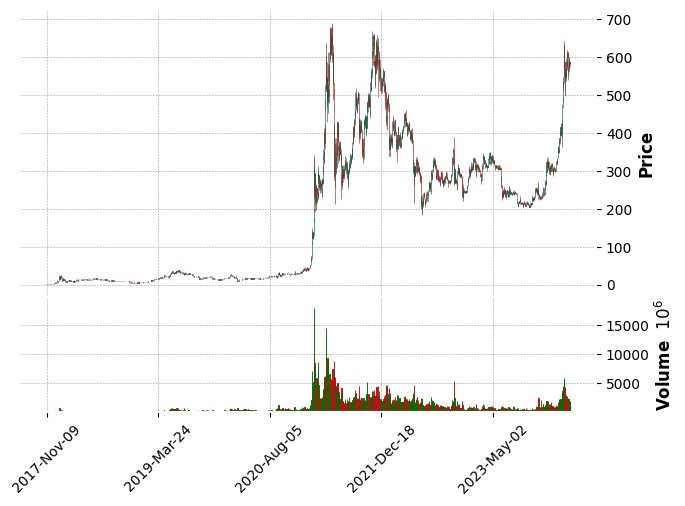

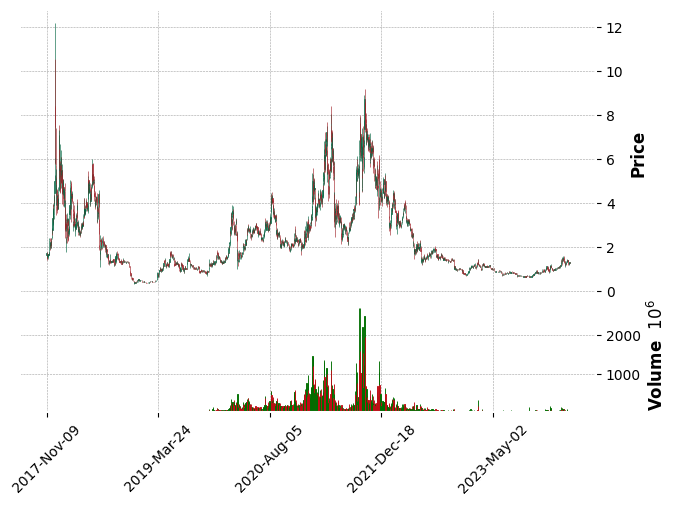

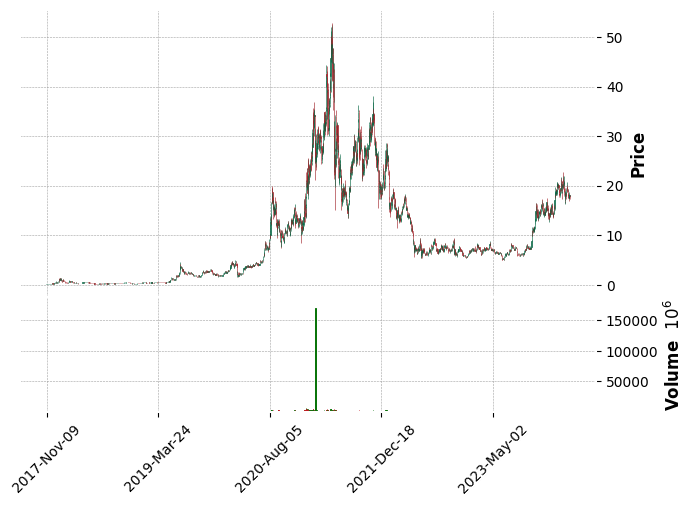

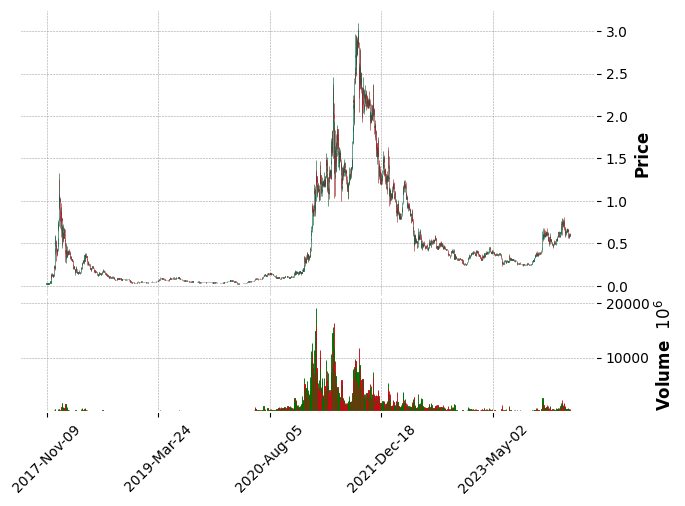

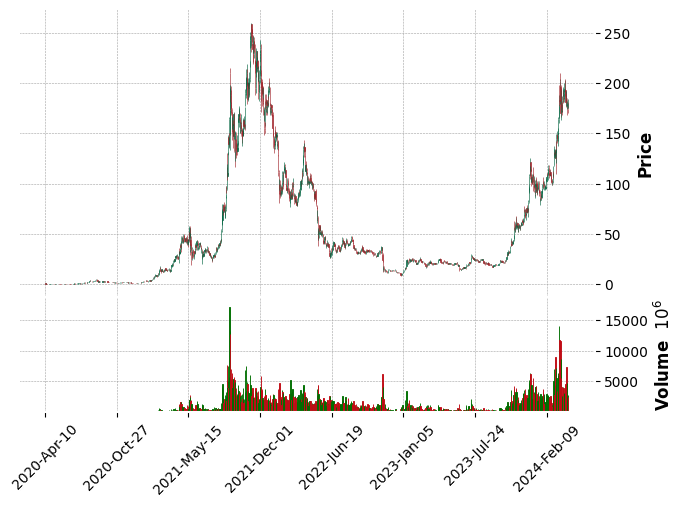

In [33]:
# Low high price difference over time 
pair_list = list(prices_raw_data_dict.keys())
for c in pair_list:
    
    data = prices_raw_data_dict[c]
    # # Creating a list of dates for the predictions

    # Plotting the actual data with mplfinance
    ax = mpf.plot(data, type='candle', style='charles', volume=True)

    # Save each subplot individually if needed
    # You might want to remove this if you're saving the whole figure later
    # plt.savefig(f'../Results/Activities_by_channel_{i}.png', dpi=300, bbox_inches='tight', transparent=False, facecolor='white')



### 4.1.1 Data Alignment and Categorization 

In [69]:
def convert_index2time(df):
    # Convert index to year, month, and day columns
    df['Year'] = df.index.year
    df['Month'] = df.index.month
    df['Day'] = df.index.day

    # Reset the index
    df.reset_index(drop=True, inplace=True)
    return df 

In [35]:
df = prices_raw_data_dict['BTC-USD']

In [36]:
# Create a dataset in which time is aligned
df.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800
2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200
2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700
2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600
2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100


In [38]:
clean_df = convert_index2time(df)

In [39]:
clean_df.head()

,Open,High,Low,Close,Adj Close,Volume,Year,Month,Day
0,465.864014,468.174011,452.421997,457.334015,457.334015,21056800,2014,9,17
1,456.859985,456.859985,413.104004,424.440002,424.440002,34483200,2014,9,18
2,424.102997,427.834991,384.532013,394.795990,394.795990,37919700,2014,9,19
3,394.673004,423.295990,389.882996,408.903992,408.903992,36863600,2014,9,20
4,408.084991,412.425995,393.181000,398.821014,398.821014,26580100,2014,9,21


In [40]:
len(clean_df)

3493

In [41]:
#Funding Round By ID
df = clean_df
df_by_year =  {round: group for round, group in df.groupby('Year')}
year_df = DC.check_dict_contents(df_by_year)

The data dict contain 11 entries
   item  count
0  2014    106
1  2015    365
2  2016    366
3  2017    365
4  2018    365


In [42]:
year_df

,item,count
0,2014,106
1,2015,365
2,2016,366
3,2017,365
4,2018,365
5,2019,365
6,2020,366
7,2021,365
8,2022,365
9,2023,365


In [47]:
# Carefully Load Clean Data
datadir = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/dataset/prices'
for f in prices_items:
    df = pd.read_csv(f'{datadir}/{f}',index_col=0,parse_dates=True)
    df.index.name='Date'
    new_entry = {f[:-4] : df}
    prices_raw_data_dict.update(new_entry)

# Create a Big Dictionary of price data categorized by_year 
clean_df_dict = {}
prices_by_year_dict = {}
summary_dict = {}

pair_list = list(prices_raw_data_dict.keys())
for c in pair_list:
    df = prices_raw_data_dict[c]
    clean_df = convert_index2time(df)
    df_by_year =  {round: group for round, group in clean_df.groupby('Year')}
    year_df = DC.check_dict_contents(df_by_year)
    clean_df_dict.update({c:clean_df})
    prices_by_year_dict.update({c:df_by_year})
    summary_dict.update({c:year_df})
    
    
## Save all the processed dict into result directory
filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/clean_df_dict.pkl'
filedict = clean_df_dict
DC.save_dict(filepath,filedict)

filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/prices_by_year_dict.pkl'
filedict = prices_by_year_dict
DC.save_dict(filepath,filedict)

filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/summary_dict.pkl'
filedict = summary_dict
DC.save_dict(filepath,filedict)

The data dict contain 5 entries
   item  count
0  2020    134
1  2021    365
2  2022    365
3  2023    365
4  2024    100
The data dict contain 8 entries
   item  count
0  2017     53
1  2018    365
2  2019    365
3  2020    366
4  2021    365
The data dict contain 8 entries
   item  count
0  2017     53
1  2018    365
2  2019    365
3  2020    366
4  2021    365
The data dict contain 8 entries
   item  count
0  2017     53
1  2018    365
2  2019    365
3  2020    366
4  2021    365
The data dict contain 6 entries
   item  count
0  2019    240
1  2020    366
2  2021    365
3  2022    365
4  2023    365
The data dict contain 5 entries
   item  count
0  2020     43
1  2021    365
2  2022    365
3  2023    365
4  2024    100
The data dict contain 8 entries
   item  count
0  2017     53
1  2018    365
2  2019    365
3  2020    366
4  2021    365
The data dict contain 8 entries
   item  count
0  2017     53
1  2018    365
2  2019    365
3  2020    366
4  2021    365
The data dict contain 11

In [48]:
summary_dict.keys()

dict_keys(['DOT-USD', 'XMR-USD', 'XRP-USD', 'ETH-USD', 'OCEAN-USD', 'ROSE-USD', 'KCS-USD', 'DOGE-USD', 'BTC-USD', 'FET-USD', 'AGIX-USD', 'LTC-USD', 'UNI-USD', 'FIL-USD', 'CAKE-USD', 'BNB-USD', 'XTZ-USD', 'LINK-USD', 'ADA-USD', 'SOL-USD'])

In [50]:
df_list = []
for c in pair_list:
    df_list.append(summary_dict[c])

In [77]:
row_values_list = []
# Pivot each DataFrame and add it to the list
# Prepare an empty DataFrame to hold the final flattened data

for df in df_list:
    pivoted = df.pivot(columns='item', values='count')
    row_values = pivoted.sum(axis=0).to_frame().transpose()
    row_values.astype(int)
    row_values_list.append(row_values)
    
# Use pd.concat to append the DataFrames
appended_df = pd.concat(row_values_list).reset_index(drop=True)

In [185]:
np.sum(row_values_list[0],axis=1)[0]

1329.0

In [186]:
total_list = []
for i in range(len(row_values_list)):
    total_list.append(int(np.sum(row_values_list[i],axis=1)[0]))

In [189]:
total_df = pd.DataFrame(total_list)
total_df.columns=['total']

In [192]:
Data_overview = pd.concat([sorted_df,total_df], axis=1)
Data_overview.head()

,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,total
0,0,0,0,0,0,0,134,365,365,365,100,1329
1,0,0,0,53,365,365,366,365,365,365,100,2344
2,0,0,0,53,365,365,366,365,365,365,100,2344
3,0,0,0,53,365,365,366,365,365,365,100,2344
4,0,0,0,0,0,240,366,365,365,365,100,1801


In [191]:
# Combined_df = appended_df.fillna(0)
# Combined_df.astype(int)

df = Combined_df
# Sort the DataFrame columns by year (assuming all columns are years)
sorted_columns = sorted(df.columns, key=lambda x: int(x))
sorted_df = df[sorted_columns].astype(int)

# Show the resulting DataFrame with sorted year columns
sorted_df

item,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,0,0,0,0,0,0,134,365,365,365,100
1,0,0,0,53,365,365,366,365,365,365,100
2,0,0,0,53,365,365,366,365,365,365,100
3,0,0,0,53,365,365,366,365,365,365,100
4,0,0,0,0,0,240,366,365,365,365,100
5,0,0,0,0,0,0,43,365,365,365,100
6,0,0,0,53,365,365,366,365,365,365,100
7,0,0,0,53,365,365,366,365,365,365,100
8,106,365,366,365,365,365,366,365,365,365,100
9,0,0,0,0,0,305,366,365,365,365,100


In [195]:
# Set the names as the index
pair_list = list(prices_raw_data_dict.keys())
Data_overview.index = pair_list

In [196]:
Data_overview

,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,total
DOT-USD,0,0,0,0,0,0,134,365,365,365,100,1329
XMR-USD,0,0,0,53,365,365,366,365,365,365,100,2344
XRP-USD,0,0,0,53,365,365,366,365,365,365,100,2344
ETH-USD,0,0,0,53,365,365,366,365,365,365,100,2344
OCEAN-USD,0,0,0,0,0,240,366,365,365,365,100,1801
ROSE-USD,0,0,0,0,0,0,43,365,365,365,100,1238
KCS-USD,0,0,0,53,365,365,366,365,365,365,100,2344
DOGE-USD,0,0,0,53,365,365,366,365,365,365,100,2344
BTC-USD,106,365,366,365,365,365,366,365,365,365,100,3493
FET-USD,0,0,0,0,0,305,366,365,365,365,100,1866


In [89]:
Data_overview.to_csv('../results/Data_overview.csv')

In [ ]:
# Create Dataset with only Aligned Data for plotting
# Each combined

In [91]:
prices_by_year_dict.keys()

dict_keys(['DOT-USD', 'XMR-USD', 'XRP-USD', 'ETH-USD', 'OCEAN-USD', 'ROSE-USD', 'KCS-USD', 'DOGE-USD', 'BTC-USD', 'FET-USD', 'AGIX-USD', 'LTC-USD', 'UNI-USD', 'FIL-USD', 'CAKE-USD', 'BNB-USD', 'XTZ-USD', 'LINK-USD', 'ADA-USD', 'SOL-USD'])

In [104]:
Aligned_price_data_dict = {}
for c in pair_list:
    df1 = prices_by_year_dict[c][2021]
    df2 = prices_by_year_dict[c][2022]
    df3 = prices_by_year_dict[c][2023]
    df4 = prices_by_year_dict[c][2024]
    concat_df = pd.concat([df1,df2,df3,df4], axis = 0,ignore_index=True)

    #make Year-Month-Day as index to conform with plotting data.
    # Reinstate the date
    # Create a 'Date' column with the format 'Year-Month-Day'
    concat_df['Date'] = pd.to_datetime(concat_df[['Year', 'Month', 'Day']])
    # Set the new 'Date' column as the index
    concat_df.set_index('Date', inplace=True)

    Aligned_price_data_dict.update({c:concat_df})

In [105]:
filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/Aligned_price_dict.pkl'
filedict = Aligned_price_data_dict
DC.save_dict(filepath,filedict)

The dict data has been saved to /home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/Aligned_price_dict.pkl.


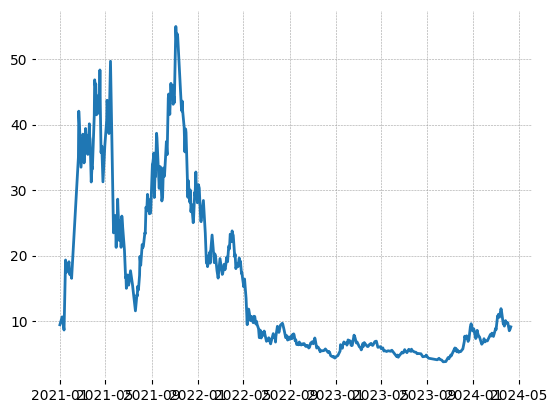

In [101]:
mydf = Aligned_price_data_dict[c]
plt.plot(mydf['High'])

In [102]:
mydf.head()

,Open,High,Low,Close,Adj Close,Volume,Year,Month,Day
Date,,,,,,,,,
2021-01-01,9.288180,9.416587,8.120194,8.306819,8.306819,2791211123,2021,1,1
2021-01-02,8.305492,9.761335,7.943290,9.208837,9.208837,3049232407,2021,1,2
2021-01-03,9.209648,10.457493,8.873362,10.033283,10.033283,3032883074,2021,1,3
2021-01-04,10.062048,10.505565,8.777210,9.469611,9.469611,2893262630,2021,1,4
2021-01-05,9.475802,10.041344,9.084263,9.701656,9.701656,2080742171,2021,1,5


In [108]:
mydf

,Open,High,Low,Close,Adj Close,Volume,Year,Month,Day
Date,,,,,,,,,
2021-01-01,9.288180,9.416587,8.120194,8.306819,8.306819,2791211123,2021,1,1
2021-01-02,8.305492,9.761335,7.943290,9.208837,9.208837,3049232407,2021,1,2
2021-01-03,9.209648,10.457493,8.873362,10.033283,10.033283,3032883074,2021,1,3
2021-01-04,10.062048,10.505565,8.777210,9.469611,9.469611,2893262630,2021,1,4
2021-01-05,9.475802,10.041344,9.084263,9.701656,9.701656,2080742171,2021,1,5
...,...,...,...,...,...,...,...,...,...
2024-04-05,8.490840,8.508145,8.094187,8.389035,8.389035,227938545,2024,4,5
2024-04-06,8.389035,8.547805,8.344803,8.494186,8.494186,156072071,2024,4,6
2024-04-07,8.493989,8.737575,8.467881,8.706726,8.706726,184130993,2024,4,7


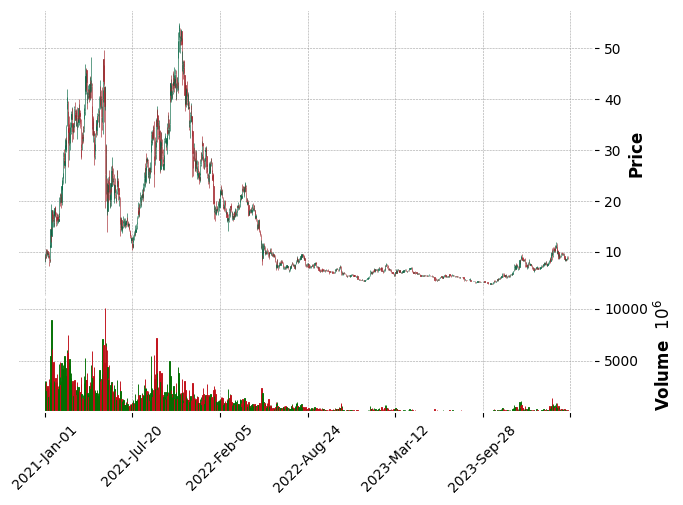

In [103]:
data = Aligned_price_data_dict[c]
# # Creating a list of dates for the predictions

# Plotting the actual data with mplfinance
mpf.plot(data, type='candle', style='charles', volume=True)


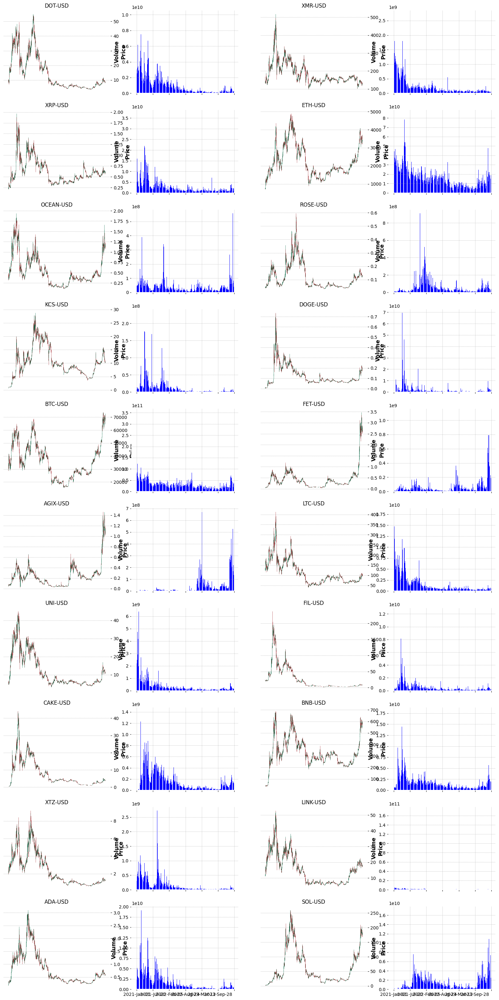

In [107]:
# Set up a 5x4 grid of subplots

pair_list = list(Aligned_price_data_dict.keys())
# Set up a 5x4 grid of subplots with shared x-axes (if desired)
fig, axes = plt.subplots(nrows=10, ncols=4, figsize=(20, 40), sharex=True)
axes = axes.flatten()  # Flatten the array to make iteration easier

# Loop over each pair and its corresponding DataFrame
for i, c in enumerate(pair_list):
    data = Aligned_price_data_dict[c]
    ax1 = axes[2*i]      # Main chart
    ax2 = axes[2*i + 1]  # Volume

    # Make sure the 'Volume' column exists
    if 'Volume' not in data.columns:
        print(f"No 'Volume' for {c}, skipping")
        continue

    # Create an additional plot for volume and set the panel to share the x-axis with the main chart
    addplot = mpf.make_addplot(data['Volume'], type='bar', ax=ax2, panel=1, color='b', ylabel='Volume')

    # Plot the data on the current subplot axes
    mpf.plot(data, type='candle', style='charles', ax=ax1, addplot=addplot, xrotation=0)

    # Set the title for the subplot to the corresponding currency pair
    ax1.set_title(c)

    # Hide x-ticks for ax1 to prevent overlap
    ax1.xaxis.set_visible(False)

fig.savefig('../results/2021-2024_Prices.png',dpi=300,
            bbox_inches='tight',transparent=False,facecolor='white')

In [ ]:
# Convert Date into - Year, Month, Day 

# Create the usual data by time

# See in which month is the market more volatile ?


# Trend of  Volatility for days during the month . 



In [239]:
trends_raw_data_dict

{'halving':      count  Year  Month  Day       Date
 0        1  2020     12   27 2020-12-27
 1        1  2021      1    3 2021-01-03
 2        1  2021      1   10 2021-01-10
 3        1  2021      1   17 2021-01-17
 4        1  2021      1   24 2021-01-24
 ..     ...   ...    ...  ...        ...
 170     24  2024      3   31 2024-03-31
 171     35  2024      4    7 2024-04-07
 172    100  2024      4   14 2024-04-14
 173     15  2024      4   21 2024-04-21
 174      5  2024      4   28 2024-04-28
 
 [175 rows x 5 columns],
 'ETF':      count  Year  Month  Day       Date
 0       30  2020     12   27 2020-12-27
 1       38  2021      1    3 2021-01-03
 2       37  2021      1   10 2021-01-10
 3       36  2021      1   17 2021-01-17
 4       38  2021      1   24 2021-01-24
 ..     ...   ...    ...  ...        ...
 170     37  2024      3   31 2024-03-31
 171     35  2024      4    7 2024-04-07
 172     33  2024      4   14 2024-04-14
 173     31  2024      4   21 2024-04-21
 174     31 

In [141]:
# Trends Item 
trends_raw_data_dict.keys()

dict_keys(['ocean protocol', 'bnb', 'uniswap', 'fetch.ai', 'cardano', 'tezos', 'dogecoin', 'singularitynet', 'pancakeswap', 'oasis network', 'XRP', 'solana', 'bitcoin', 'chainlink', 'polkadot', 'litecoin', 'monero', 'filecoin', 'kucoin', 'ethereum'])

In [147]:
trends_raw_data_dict['pancakeswap'].as_int()

AttributeError: 'DataFrame' object has no attribute 'as_int'

In [148]:
trends_raw_data_dict['dogecoin'].replace('<1', '0', inplace=True)

In [145]:
trends_raw_data_dict['pancakeswap'].columns = ['count']

TypeError: 'value' must be an instance of str or bytes, not a int

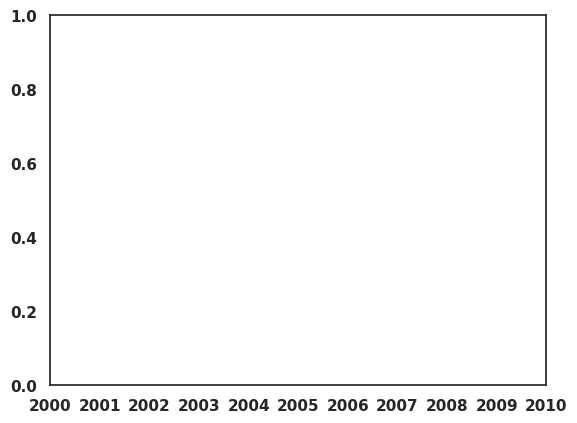

In [146]:
plt.plot(trends_raw_data_dict['pancakeswap']['count'])

In [131]:
df

,ocean protocol: (Worldwide)
Week,
2019-04-07,9
2019-04-14,13
2019-04-21,14
2019-04-28,32
2019-05-05,22
...,...
2024-03-10,55
2024-03-17,46
2024-03-24,100


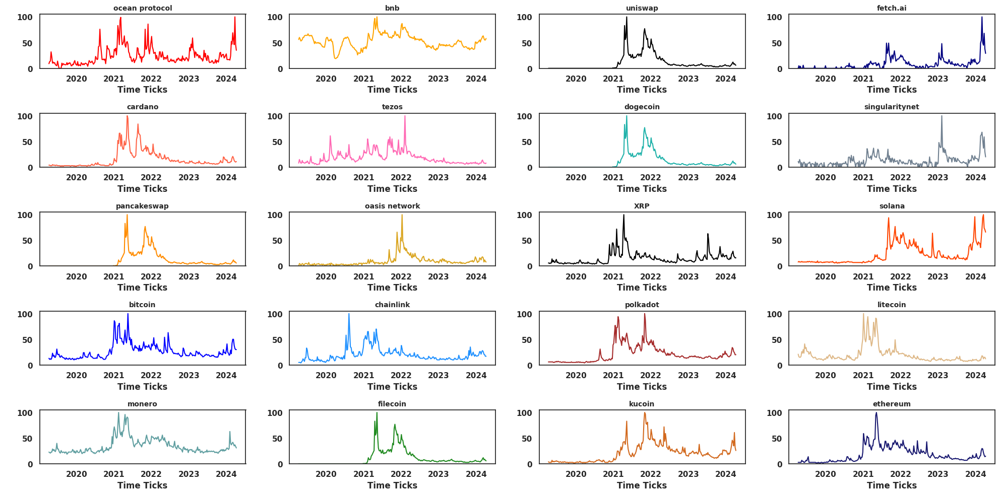

In [201]:
# Low high price difference over time 
pair_list = list(trends_raw_data_dict.keys())
fig, axes = plt.subplots(5, 4, figsize=(20, 10))  # Creating a 5x4 grid of subplots

for c, co, (i, ax) in zip(pair_list, color_list, enumerate(axes.flatten())):
    df = trends_raw_data_dict[c]
    df.columns = ['count']
    if c in ('uniswap', 'dogecoin', 'pancakeswap', 'filecoin'):
        df.replace('<1', '0', inplace=True)
        mystr = trends_raw_data_dict['pancakeswap']['count']
        fix_str =  [int(num) for num in mystr]
        ax.plot(trends_raw_data_dict['pancakeswap'].index,fix_str, color=co)
    else : 
        ax.plot(df['count'], color=co)
    ax.set_title(f'{c}', fontsize=10, fontweight='bold')
    ax.set_ylabel(r' ')
    ax.set_xlabel(r'Time Ticks')
    ax.set_ylim([0,105])

    # Save each subplot individually if needed
    # You might want to remove this if you're saving the whole figure later
    # plt.savefig(f'../Results/Activities_by_channel_{i}.png', dpi=300, bbox_inches='tight', transparent=False, facecolor='white')

# Adjust layout to prevent overlap
plt.tight_layout()

# Save the entire figure
plt.savefig('../results/google_trend_overview.png', dpi=300, bbox_inches='tight', transparent=False, facecolor='white')
# plt.show()

In [153]:
trends_raw_data_dict['uniswap'].replace('<1', 0, inplace=True)

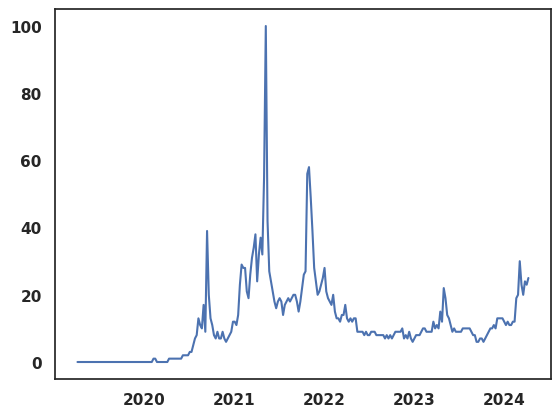

In [155]:
plt.plot(trends_raw_data_dict['uniswap'])

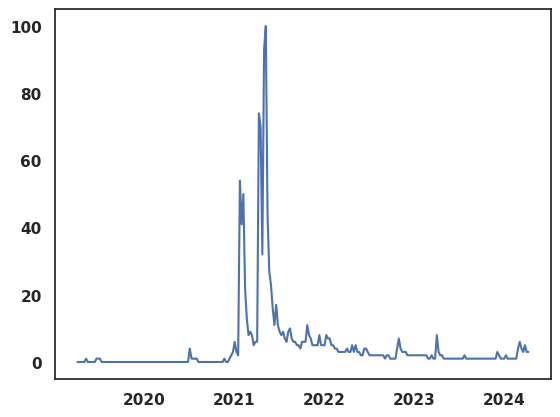

In [157]:
trends_raw_data_dict['dogecoin'].replace('<1', 0, inplace=True)
plt.plot(trends_raw_data_dict['dogecoin'])

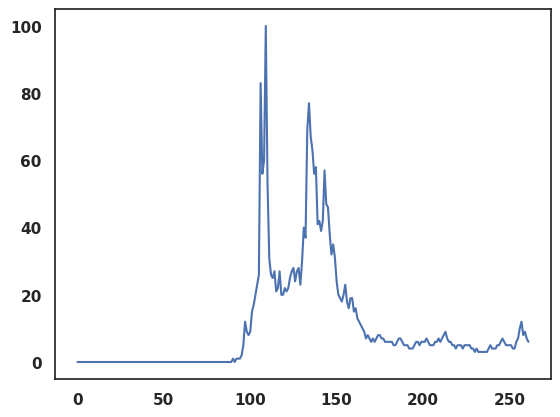

In [196]:
mystr = trends_raw_data_dict['pancakeswap']['count']
fix_str =  [int(num) for num in mystr]
plt.plot(fix_str)

In [181]:
trends_raw_data_dict['filecoin']

,count
Week,
2019-04-07,1
2019-04-14,1
2019-04-21,1
2019-04-28,1
2019-05-05,1
...,...
2024-03-10,14
2024-03-17,12
2024-03-24,12


In [176]:
trends_raw_data_dict['pancakeswap']

,count
Week,
2019-04-07,0
2019-04-14,0
2019-04-21,0
2019-04-28,0
2019-05-05,0
...,...
2024-03-10,12
2024-03-17,8
2024-03-24,9


In [193]:
trends_raw_data_dict['pancakeswap'].replace('<1', '0', inplace=True)

In [187]:
trends_raw_data_dict['pancakeswap']

,count
Week,
2019-04-07,0
2019-04-14,0
2019-04-21,0
2019-04-28,0
2019-05-05,0
...,...
2024-03-10,12
2024-03-17,8
2024-03-24,9


In [190]:
my_data = list(trends_raw_data_dict['pancakeswap']['count'])


In [192]:
my_data

['0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 0,
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 0,
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 '1',
 0,
 '1',
 '1',
 '1',
 '2',
 '5',
 '12',
 '9',
 '8',
 '9',
 '15',
 '17',
 '20',
 '23',
 '26',
 '83',
 '56',
 '60',
 '100',
 '53',
 '31',
 '26',
 '25',
 '27',
 '21',
 '22',
 '27',
 '20',
 '20',
 '22',
 '21',
 '22',
 '25',
 '27',
 '28',
 '24',
 '27',
 '28',
 '23',
 '30',
 '40',
 '37',
 '69',
 '77',
 '67',
 '63',
 '56',
 '58',
 '41',
 '42',
 '39',
 '42',
 '57',
 '47',
 '46',
 '38',
 '32',
 '35',
 '31',
 '24',
 '20',
 '19',
 '18',
 '20',
 '23',
 '18',
 '16',
 '19',
 '19',
 '15',
 '16',

In [ ]:
# Combine the dataset based on alignment 



# Create a unified dataset with aligned data and other metadata obtained from analysis (pricediff, daily volatility, etc. )

In [ ]:
# After combining the dataset remove for missing values 
# clean up missing values
# Checking for missing values
aapl_data.isnull().sum()

# Filling missing values, if any
aapl_data.ffill(inplace=True)

In [40]:
import sys
print(sys.executable)

/usr/bin/python3


### 4.1.2 Spotlight on Recent Trends (Starting from Jan 2024 )

###  4.1.3 Deep Dive into Volume Analysis and their relation to token price movement. 

## 4.2 Data Analysis on Past and Current (Google) Trends Cycles

 Here the number of Google trends is based on Interest over time

In [245]:
# For aligned Data Trends
# Carefully Load Clean Data
trends_raw_data_dict = {}
datadir = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/dataset/trends'
for f in trends_items:
    df = pd.read_csv(f'{datadir}/{f}',skiprows = 2,index_col=0,parse_dates=True)
    new_entry = {f[:-4] : df}
    trends_raw_data_dict.update(new_entry)

# Create a Big Dictionary of price data categorized by_year 
clean_trend_df_dict = {}
trend_by_year_dict = {}
trend_summary_dict = {}

pair_list = list(trends_raw_data_dict.keys())
for c in pair_list:
    df = trends_raw_data_dict[c]
    clean_df = convert_index2time(df)
    df_by_year =  {round: group for round, group in clean_df.groupby('Year')}
    year_df = DC.check_dict_contents(df_by_year)
    clean_trend_df_dict.update({c:clean_df})
    trend_by_year_dict.update({c:df_by_year})
    trend_summary_dict.update({c:year_df})
    
    
## Save all the processed dict into result directory
filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/clean_trend_df_dict.pkl'
filedict = clean_trend_df_dict
DC.save_dict(filepath,filedict)

filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/trend_by_year_dict.pkl'
filedict = trend_by_year_dict
DC.save_dict(filepath,filedict)

filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/trend_summary_dict.pkl'
filedict = trend_summary_dict
DC.save_dict(filepath,filedict)

The data dict contain 6 entries
   item  count
0  2019     39
1  2020     52
2  2021     52
3  2022     52
4  2023     53
The data dict contain 6 entries
   item  count
0  2019     39
1  2020     52
2  2021     52
3  2022     52
4  2023     53
The data dict contain 6 entries
   item  count
0  2019     39
1  2020     52
2  2021     52
3  2022     52
4  2023     53
The data dict contain 6 entries
   item  count
0  2019     39
1  2020     52
2  2021     52
3  2022     52
4  2023     53
The data dict contain 6 entries
   item  count
0  2019     39
1  2020     52
2  2021     52
3  2022     52
4  2023     53
The data dict contain 6 entries
   item  count
0  2019     39
1  2020     52
2  2021     52
3  2022     52
4  2023     53
The data dict contain 6 entries
   item  count
0  2019     39
1  2020     52
2  2021     52
3  2022     52
4  2023     53
The data dict contain 6 entries
   item  count
0  2019     39
1  2020     52
2  2021     52
3  2022     52
4  2023     53
The data dict contain 6 

In [246]:
clean_trend_df_dict.keys()

dict_keys(['ocean protocol', 'bnb', 'uniswap', 'fetch.ai', 'cardano', 'tezos', 'dogecoin', 'singularitynet', 'pancakeswap', 'oasis network', 'XRP', 'solana', 'bitcoin', 'chainlink', 'polkadot', 'litecoin', 'monero', 'filecoin', 'kucoin', 'ethereum'])

In [248]:
clean_trend_df_dict['ocean protocol']

,ocean protocol: (Worldwide),Year,Month,Day
0,9,2019,4,7
1,13,2019,4,14
2,14,2019,4,21
3,32,2019,4,28
4,22,2019,5,5
...,...,...,...,...
257,55,2024,3,10
258,46,2024,3,17
259,100,2024,3,24
260,46,2024,3,31


In [225]:
# Trends_extra data
## Load list of trends dataset
# load data 
datadir = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/dataset'
f = 'trends_addition'
file_format = '*.csv'
trends_items = DC.load_data_folder(f,datadir, file_format)
# For aligned Data Trends
# Carefully Load Clean Data
trends_raw_data_dict = {}
datadir = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/dataset/trends_addition'
for f in trends_items:
    df = pd.read_csv(f'{datadir}/{f}',skiprows = 2,index_col=0,parse_dates=True)
    new_entry = {f[:-4] : df}
    trends_raw_data_dict.update(new_entry)

# Create a Big Dictionary of price data categorized by_year 
clean_trend_df_dict = {}
trend_by_year_dict = {}
trend_summary_dict = {}

pair_list = list(trends_raw_data_dict.keys())
for c in pair_list:
    df = trends_raw_data_dict[c]
    clean_df = convert_index2time(df)
    df_by_year =  {round: group for round, group in clean_df.groupby('Year')}
    year_df = DC.check_dict_contents(df_by_year)
    clean_trend_df_dict.update({c:clean_df})
    trend_by_year_dict.update({c:df_by_year})
    trend_summary_dict.update({c:year_df})
    
    
## Save all the processed dict into result directory
filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/clean_trend_add_df_dict.pkl'
filedict = clean_trend_df_dict
DC.save_dict(filepath,filedict)

filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/trend_add_by_year_dict.pkl'
filedict = trend_by_year_dict
DC.save_dict(filepath,filedict)

filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/trend_adda_summary_dict.pkl'
filedict = trend_summary_dict
DC.save_dict(filepath,filedict)

The data dict contain 5 entries
   item  count
0  2020      1
1  2021     52
2  2022     52
3  2023     53
4  2024     17
The data dict contain 5 entries
   item  count
0  2020      1
1  2021     52
2  2022     52
3  2023     53
4  2024     17
The data dict contain 5 entries
   item  count
0  2020      1
1  2021     52
2  2022     52
3  2023     53
4  2024     17
The data dict contain 5 entries
   item  count
0  2020      1
1  2021     52
2  2022     52
3  2023     53
4  2024     17
The data dict contain 5 entries
   item  count
0  2020      1
1  2021     52
2  2022     52
3  2023     53
4  2024     17
The data dict contain 5 entries
   item  count
0  2020      1
1  2021     52
2  2022     52
3  2023     53
4  2024     17
The data dict contain 5 entries
   item  count
0  2020      1
1  2021     52
2  2022     52
3  2023     53
4  2024     17
The data dict contain 5 entries
   item  count
0  2020      1
1  2021     52
2  2022     52
3  2023     53
4  2024     17
The dict data has been s

In [217]:
 clean_trend_df_dict.keys()

dict_keys(['halving', 'ETF', 'tokenomics', 'ftx', 'binance', 'microstrategy', 'blackrock', 'coinbase'])

In [204]:
 clean_trend_df_dict['halving']

,Halving: (Worldwide),Year,Month,Day
0,1,2020,12,27
1,1,2021,1,3
2,1,2021,1,10
3,1,2021,1,17
4,1,2021,1,24
...,...,...,...,...
170,24,2024,3,31
171,35,2024,4,7
172,100,2024,4,14
173,15,2024,4,21


In [223]:
import matplotlib.dates as mdates

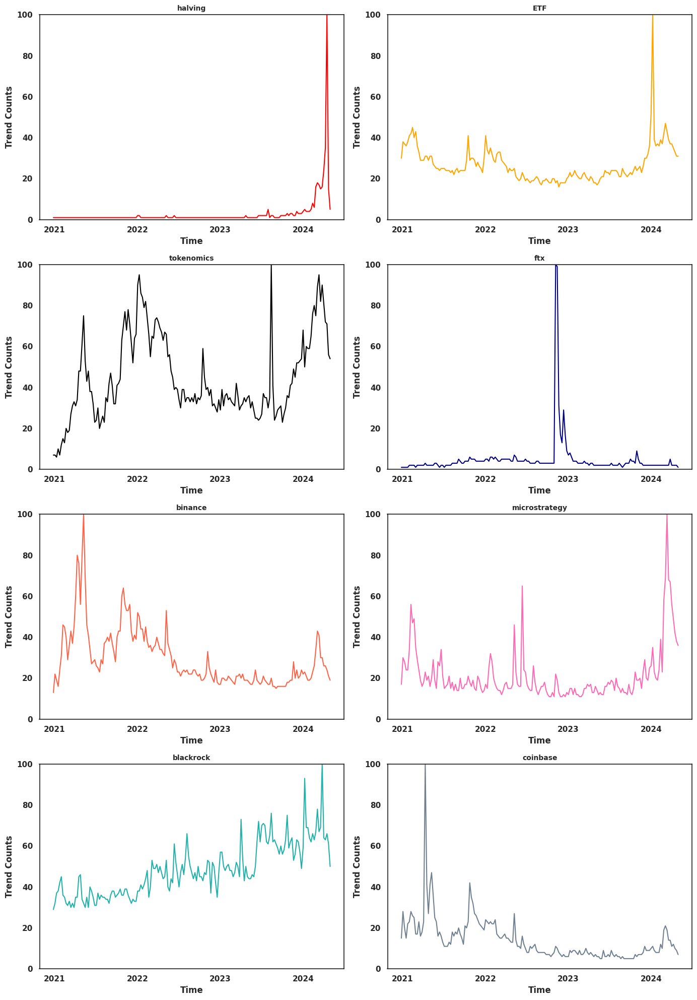

In [226]:
# Low high price difference over time 
pair_list = list(trends_raw_data_dict.keys())
fig, axes = plt.subplots(4, 2, figsize=(14, 20))  # Creating a 5x4 grid of subplots

for c, co, (i, ax) in zip(pair_list, color_list, enumerate(axes.flatten())):
    df = trends_raw_data_dict[c]
    df.columns = ['count','Year','Month','Day']
    df['Date'] = pd.to_datetime(df[['Year', 'Month', 'Day']])
    # ax.plot(df['Open'], color=co)
    # ax.plot(df['Low'],  color='r')
    ax.plot(df['Date'],df['count'], color=co)
    ax.set_title(f'{c}', fontsize=10, fontweight='bold')
    ax.set_ylabel(r'Trend Counts')
    ax.set_xlabel(r'Time')
    ax.set_ylim([0,100])
    # Set the x-axis to show only the year
    ax.xaxis.set_major_locator(mdates.YearLocator())  # Only show one tick per year
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Show the year only

    # Save each subplot individually if needed
    # You might want to remove this if you're saving the whole figure later
    # plt.savefig(f'../Results/Activities_by_channel_{i}.png', dpi=300, bbox_inches='tight', transparent=False, facecolor='white')

# Adjust layout to prevent overlap
plt.tight_layout()

# Save the entire figure
plt.savefig('../results/google_trend_EVENT_latest.png', dpi=300, bbox_inches='tight', transparent=False, facecolor='white')
# plt.show()

In [175]:
# Trends_extra data
## Load list of trends dataset
# load data 
datadir = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/dataset'
f = 'trends_5y'
file_format = '*.csv'
trends_items = DC.load_data_folder(f,datadir, file_format)
# For aligned Data Trends
# Carefully Load Clean Data
trends_raw_data_dict = {}
datadir = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/dataset/trends_5y'
for f in trends_items:
    df = pd.read_csv(f'{datadir}/{f}',skiprows = 2,index_col=0,parse_dates=True)
    new_entry = {f[:-4] : df}
    trends_raw_data_dict.update(new_entry)

# Create a Big Dictionary of price data categorized by_year 
clean_trend_df_dict = {}
trend_by_year_dict = {}
trend_summary_dict = {}

pair_list = list(trends_raw_data_dict.keys())
for c in pair_list:
    df = trends_raw_data_dict[c]
    clean_df = convert_index2time(df)
    df_by_year =  {round: group for round, group in clean_df.groupby('Year')}
    year_df = DC.check_dict_contents(df_by_year)
    clean_trend_df_dict.update({c:clean_df})
    trend_by_year_dict.update({c:df_by_year})
    trend_summary_dict.update({c:year_df})
    
    
## Save all the processed dict into result directory
filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/clean_trend_extra_df_dict.pkl'
filedict = clean_trend_df_dict
DC.save_dict(filepath,filedict)

filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/trend_extra_by_year_dict.pkl'
filedict = trend_by_year_dict
DC.save_dict(filepath,filedict)

filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/trend_extra_summary_dict.pkl'
filedict = trend_summary_dict
DC.save_dict(filepath,filedict)

The data dict contain 6 entries
   item  count
0  2019     38
1  2020     52
2  2021     52
3  2022     52
4  2023     53
The data dict contain 6 entries
   item  count
0  2019     38
1  2020     52
2  2021     52
3  2022     52
4  2023     53
The data dict contain 6 entries
   item  count
0  2019     38
1  2020     52
2  2021     52
3  2022     52
4  2023     53
The data dict contain 6 entries
   item  count
0  2019     38
1  2020     52
2  2021     52
3  2022     52
4  2023     53
The data dict contain 6 entries
   item  count
0  2019     38
1  2020     52
2  2021     52
3  2022     52
4  2023     53
The data dict contain 6 entries
   item  count
0  2019     38
1  2020     52
2  2021     52
3  2022     52
4  2023     53
The data dict contain 6 entries
   item  count
0  2019     38
1  2020     52
2  2021     52
3  2022     52
4  2023     53
The data dict contain 6 entries
   item  count
0  2019     38
1  2020     52
2  2021     52
3  2022     52
4  2023     53
The data dict contain 6 

In [172]:
trends_raw_data_dict.keys()

dict_keys(['cardano-map5y', 'bnb-map5y', 'filecoin-map5y', 'ethereum-map5y', 'chainlink-map5y', 'singularitynet-map5y', 'pancakeswap-map5y', 'polkadot-map5y', 'XRP-map5y', 'uniswap-map5y', 'kucoin-map5y', 'oceanprotocol-map5y', 'dogecoin-map5y', 'solana-map5y', 'litecoin-map5y', 'monero-map5y', 'fetch.ai-map5y', 'bitcoin-map5y', 'oasisnetwork-map5y', 'tezos-map5y'])

In [173]:
trends_raw_data_dict['cardano-map5y']

,cardano: (4/14/19 - 4/14/24)
Country,
Netherlands,100
Gibraltar,NaN
Andorra,NaN
Liechtenstein,NaN
Italy,61
...,...
Anguilla,NaN
Greenland,NaN
Montserrat,NaN


In [ ]:
# Create a Google Trends Interest count along with the time trend () 

In [176]:
# Trends_extra data
## Load list of trends dataset
# load data 
datadir = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/dataset'
f = 'trends_latest'
file_format = '*.csv'
trends_items = DC.load_data_folder(f,datadir, file_format)
# For aligned Data Trends
# Carefully Load Clean Data
trends_raw_data_dict = {}
datadir = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/dataset/trends_latest'
for f in trends_items:
    df = pd.read_csv(f'{datadir}/{f}',skiprows = 2,index_col=0,parse_dates=True)
    new_entry = {f[:-4] : df}
    trends_raw_data_dict.update(new_entry)

# Create a Big Dictionary of price data categorized by_year 
clean_trend_df_dict = {}
trend_by_year_dict = {}
trend_summary_dict = {}

pair_list = list(trends_raw_data_dict.keys())
for c in pair_list:
    df = trends_raw_data_dict[c]
    clean_df = convert_index2time(df)
    df_by_year =  {round: group for round, group in clean_df.groupby('Year')}
    year_df = DC.check_dict_contents(df_by_year)
    clean_trend_df_dict.update({c:clean_df})
    trend_by_year_dict.update({c:df_by_year})
    trend_summary_dict.update({c:year_df})
    
    
## Save all the processed dict into result directory
filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/clean_trend_latest_df_dict.pkl'
filedict = clean_trend_df_dict
DC.save_dict(filepath,filedict)

filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/trend_latest_by_year_dict.pkl'
filedict = trend_by_year_dict
DC.save_dict(filepath,filedict)

filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/trend_latest_summary_dict.pkl'
filedict = trend_summary_dict
DC.save_dict(filepath,filedict)

The data dict contain 5 entries
   item  count
0  2020      1
1  2021     52
2  2022     52
3  2023     53
4  2024     14
The data dict contain 5 entries
   item  count
0  2020      1
1  2021     52
2  2022     52
3  2023     53
4  2024     14
The data dict contain 5 entries
   item  count
0  2020      1
1  2021     52
2  2022     52
3  2023     53
4  2024     14
The data dict contain 5 entries
   item  count
0  2020      1
1  2021     52
2  2022     52
3  2023     53
4  2024     14
The data dict contain 5 entries
   item  count
0  2020      1
1  2021     52
2  2022     52
3  2023     53
4  2024     14
The data dict contain 5 entries
   item  count
0  2020      1
1  2021     52
2  2022     52
3  2023     53
4  2024     14
The data dict contain 5 entries
   item  count
0  2020      1
1  2021     52
2  2022     52
3  2023     53
4  2024     14
The data dict contain 5 entries
   item  count
0  2020      1
1  2021     52
2  2022     52
3  2023     53
4  2024     14
The data dict contain 5 

In [178]:
trends_raw_data_dict[c]

,solana: (Worldwide),Year,Month,Day
0,7,2020,12,27
1,9,2021,1,3
2,7,2021,1,10
3,7,2021,1,17
4,7,2021,1,24
...,...,...,...,...
167,90,2024,3,10
168,100,2024,3,17
169,72,2024,3,24
170,70,2024,3,31


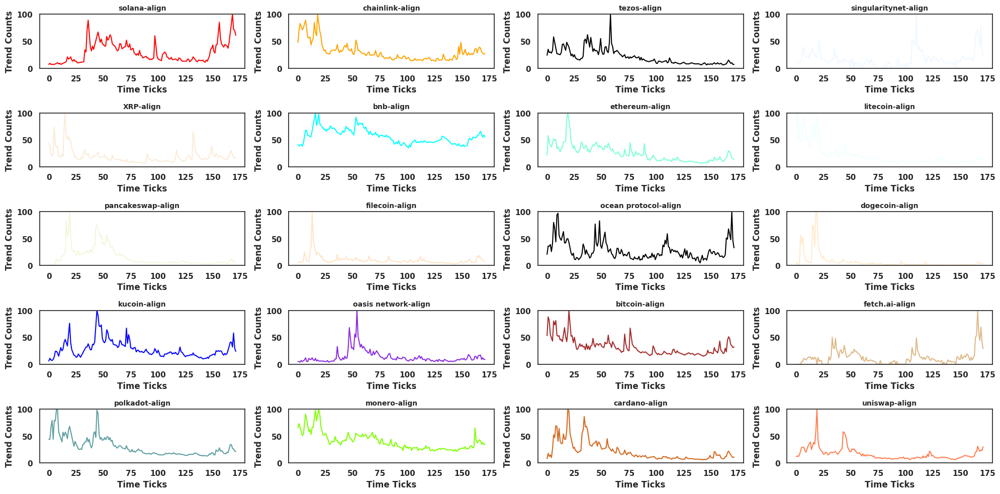

In [180]:
# Low high price difference over time 
pair_list = list(trends_raw_data_dict.keys())
fig, axes = plt.subplots(5, 4, figsize=(20, 10))  # Creating a 5x4 grid of subplots

for c, co, (i, ax) in zip(pair_list, color_list, enumerate(axes.flatten())):
    df = trends_raw_data_dict[c]
    df.columns = ['count','Year','Month','Day']
    # ax.plot(df['Open'], color=co)
    # ax.plot(df['Low'],  color='r')
    ax.plot(df['count'], color=co)
    ax.set_title(f'{c}', fontsize=10, fontweight='bold')
    ax.set_ylabel(r'Trend Counts')
    ax.set_xlabel(r'Time Ticks')
    ax.set_ylim([0,100])

    # Save each subplot individually if needed
    # You might want to remove this if you're saving the whole figure later
    # plt.savefig(f'../Results/Activities_by_channel_{i}.png', dpi=300, bbox_inches='tight', transparent=False, facecolor='white')

# Adjust layout to prevent overlap
plt.tight_layout()

# Save the entire figure
plt.savefig('../results/google_trend_overview_latest.png', dpi=300, bbox_inches='tight', transparent=False, facecolor='white')
# plt.show()

In [ ]:
# Pick the dates on which interest trend are reported, and pick the price specifically for that day. 

In [199]:
trends_raw_data_dict[c]

,count,Year,Month,Day
0,12,2020,12,27
1,13,2021,1,3
2,12,2021,1,10
3,15,2021,1,17
4,24,2021,1,24
...,...,...,...,...
167,25,2024,3,10
168,22,2024,3,17
169,24,2024,3,24
170,23,2024,3,31


In [ ]:
# start 2020-12-27 to 2024-4-7 : 172 Weeks in total 
# Get an average of 172 weeks of data from the D

In [201]:
clean_df_dict['UNI-USD']

,Open,High,Low,Close,Adj Close,Volume,Year,Month,Day
0,3.488153,8.438537,3.261757,6.897257,6.897257,6061110198,2020,9,18
1,6.945577,7.443275,5.321795,5.724464,5.724464,2447471305,2020,9,19
2,5.720515,6.050326,4.720210,5.244195,5.244195,1554143599,2020,9,20
3,5.244195,5.622155,4.160743,4.266079,4.266079,1329464490,2020,9,21
4,4.275014,4.554092,3.755040,3.905138,3.905138,816282684,2020,9,22
...,...,...,...,...,...,...,...,...,...
1295,10.977168,11.050229,10.467931,10.929664,10.929664,135577608,2024,4,5
1296,10.929664,11.338499,10.909713,11.249993,11.249993,91207093,2024,4,6
1297,11.249993,11.452709,11.215923,11.395591,11.395591,155943977,2024,4,7
1298,11.395591,11.783922,11.290581,11.629570,11.629570,140358732,2024,4,8


In [213]:
df = clean_df_dict['UNI-USD']
target='Close'
start_date,end_date = ['2021-01-03','2024-04-07']
close_ave = calculate_weekly_average(df, start_date, end_date, target)

In [224]:
start_date,end_date = ['2021-01-03','2024-04-07']
df = clean_df_dict['UNI-USD']
ave_df = calculate_weekly_average(df, start_date, end_date)
    

In [225]:
ave_df

,Start_Date,End_Date,High_Ave,Low_Ave,Open_Ave,Close_Ave,Volume_Ave
0,2021-01-03,2021-01-10,6.372037,5.480462,5.854881,5.992507,2.629978e+09
1,2021-01-10,2021-01-17,7.211885,6.043044,6.505507,6.803150,2.727092e+09
2,2021-01-17,2021-01-24,9.677295,8.116360,8.689784,9.146516,3.249733e+09
3,2021-01-24,2021-01-31,15.731044,13.121113,13.839967,14.889649,3.687380e+09
4,2021-01-31,2021-02-07,20.879580,18.364799,19.631884,19.531191,1.538199e+09
...,...,...,...,...,...,...,...
165,2024-03-03,2024-03-10,14.669123,13.093402,13.741148,13.935429,4.915882e+08
166,2024-03-10,2024-03-17,14.079917,12.925466,13.771369,13.560659,2.809291e+08
167,2024-03-17,2024-03-24,12.217132,11.239496,11.804481,11.816679,1.976231e+08
168,2024-03-24,2024-03-31,12.835306,12.225237,12.386989,12.552928,1.588927e+08


In [215]:
trends_raw_data_dict[c][1:-1]

,count,Year,Month,Day
1,13,2021,1,3
2,12,2021,1,10
3,15,2021,1,17
4,24,2021,1,24
5,29,2021,1,31
...,...,...,...,...
166,31,2024,3,3
167,25,2024,3,10
168,22,2024,3,17
169,24,2024,3,24


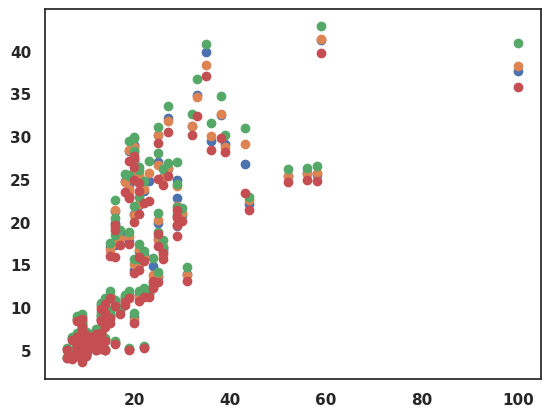

In [228]:
plt.scatter(trends_raw_data_dict[c][1:-1]['count'],ave_df['Close_Ave'],label='Close')
plt.scatter(trends_raw_data_dict[c][1:-1]['count'],ave_df['Open_Ave'],label='Open')
plt.scatter(trends_raw_data_dict[c][1:-1]['count'],ave_df['High_Ave'],label='High')
plt.scatter(trends_raw_data_dict[c][1:-1]['count'],ave_df['Low_Ave'],label='Low')

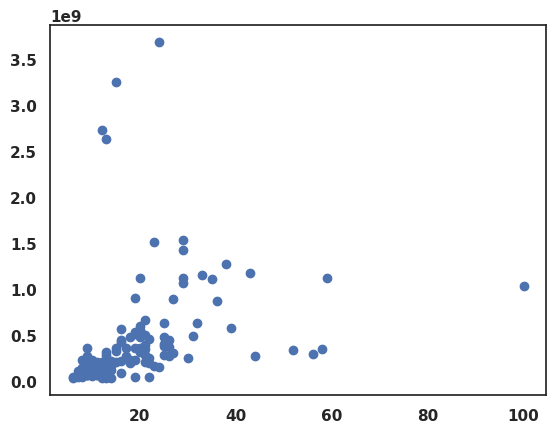

In [227]:
plt.scatter(trends_raw_data_dict[c][1:-1]['count'],ave_df['Volume_Ave'],label='Volume')

In [244]:
trend_df = trends_raw_data_dict[c][1:-1].reset_index()
combined_df = pd.concat([ave_df,pd.DataFrame(trend_df['count'])],axis=1)

In [245]:
combined_df

,Start_Date,End_Date,High_Ave,Low_Ave,Open_Ave,Close_Ave,Volume_Ave,count
0,2021-01-03,2021-01-10,6.372037,5.480462,5.854881,5.992507,2.629978e+09,13
1,2021-01-10,2021-01-17,7.211885,6.043044,6.505507,6.803150,2.727092e+09,12
2,2021-01-17,2021-01-24,9.677295,8.116360,8.689784,9.146516,3.249733e+09,15
3,2021-01-24,2021-01-31,15.731044,13.121113,13.839967,14.889649,3.687380e+09,24
4,2021-01-31,2021-02-07,20.879580,18.364799,19.631884,19.531191,1.538199e+09,29
...,...,...,...,...,...,...,...,...
165,2024-03-03,2024-03-10,14.669123,13.093402,13.741148,13.935429,4.915882e+08,31
166,2024-03-10,2024-03-17,14.079917,12.925466,13.771369,13.560659,2.809291e+08,25
167,2024-03-17,2024-03-24,12.217132,11.239496,11.804481,11.816679,1.976231e+08,22
168,2024-03-24,2024-03-31,12.835306,12.225237,12.386989,12.552928,1.588927e+08,24


In [249]:
combined_df.keys()

Index(['Start_Date', 'End_Date', 'High_Ave', 'Low_Ave', 'Open_Ave',
       'Close_Ave', 'Volume_Ave', 'count'],
      dtype='object')

In [251]:
corr_df = combined_df[['High_Ave', 'Low_Ave', 'Open_Ave',
       'Close_Ave', 'Volume_Ave', 'count']]
corr_df.head()

,High_Ave,Low_Ave,Open_Ave,Close_Ave,Volume_Ave,count
0,6.372037,5.480462,5.854881,5.992507,2.629978e+09,13
1,7.211885,6.043044,6.505507,6.803150,2.727092e+09,12
2,9.677295,8.116360,8.689784,9.146516,3.249733e+09,15
3,15.731044,13.121113,13.839967,14.889649,3.687380e+09,24
4,20.879580,18.364799,19.631884,19.531191,1.538199e+09,29


In [252]:
pair_list = list(clean_df_dict.keys())
combined_df_dict = {}
corr_df_dict ={}
start_date,end_date = ['2021-01-03','2024-04-07']
for c in pair_list:
    df = clean_df_dict[c]
    ave_df = calculate_weekly_average(df, start_date, end_date)
    trend_id = pair2trend_map[c]
    trend_df = trends_raw_data_dict[trend_id][1:-1].reset_index()
    combined_df = pd.concat([ave_df,pd.DataFrame(trend_df['count'])],axis=1)
    combined_df_dict.update({trend_id[:-6]:combined_df})
    corr_df = combined_df[['High_Ave', 'Low_Ave', 'Open_Ave',
       'Close_Ave', 'Volume_Ave', 'count']]
    corr_df_dict.update({trend_id[:-6]:corr_df})
    
## Save all the processed dict into result directory
filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/combined_df_dict.pkl'
filedict =  combined_df_dict
DC.save_dict(filepath,filedict)

## Save all the processed dict into result directory
filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/corr_df_dict.pkl'
filedict = corr_df_dict
DC.save_dict(filepath,filedict)

The dict data has been saved to /home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/combined_df_dict.pkl.
The dict data has been saved to /home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/corr_df_dict.pkl.


In [249]:
combined_df_dict['solana']

,Start_Date,End_Date,High_Ave,Low_Ave,Open_Ave,Close_Ave,Volume_Ave,count
0,2021-01-03,2021-01-10,2.915760,2.238761,2.441477,2.647176,9.210054e+07,9
1,2021-01-10,2021-01-17,3.670969,3.110520,3.382925,3.436863,6.689779e+07,7
2,2021-01-17,2021-01-24,3.812946,3.282194,3.530544,3.556798,5.188801e+07,7
3,2021-01-24,2021-01-31,4.106004,3.668613,3.814036,3.902187,5.425503e+07,7
4,2021-01-31,2021-02-07,5.988976,5.169214,5.416370,5.722287,8.435480e+07,7
...,...,...,...,...,...,...,...,...
165,2024-03-03,2024-03-10,143.008043,130.223979,135.455268,137.304314,5.046509e+09,68
166,2024-03-10,2024-03-17,173.552933,156.577736,161.781809,168.971218,8.285751e+09,90
167,2024-03-17,2024-03-24,193.400049,173.799986,183.507874,183.717798,7.185498e+09,100
168,2024-03-24,2024-03-31,194.557543,183.749403,187.355181,191.103447,3.171976e+09,72


In [248]:
a = pair2trend_map['SOL-USD']
trend_id[:-6]

'solana'

In [230]:
clean_df_dict.keys()

dict_keys(['DOT-USD', 'XMR-USD', 'XRP-USD', 'ETH-USD', 'OCEAN-USD', 'ROSE-USD', 'KCS-USD', 'DOGE-USD', 'BTC-USD', 'FET-USD', 'AGIX-USD', 'LTC-USD', 'UNI-USD', 'FIL-USD', 'CAKE-USD', 'BNB-USD', 'XTZ-USD', 'LINK-USD', 'ADA-USD', 'SOL-USD'])

In [229]:
trends_raw_data_dict.keys()

dict_keys(['solana-align', 'chainlink-align', 'tezos-align', 'singularitynet-align', 'XRP-align', 'bnb-align', 'ethereum-align', 'litecoin-align', 'pancakeswap-align', 'filecoin-align', 'ocean protocol-align', 'dogecoin-align', 'kucoin-align', 'oasis network-align', 'bitcoin-align', 'fetch.ai-align', 'polkadot-align', 'monero-align', 'cardano-align', 'uniswap-align'])

In [231]:
pair2trend_map = {
    'SOL-USD':'solana-align',
    'LINK-USD':'chainlink-align',
    'XTZ-USD':'tezos-align', 
    'AGIX-USD':'singularitynet-align', 
    'XRP-USD':'XRP-align',
    'BNB-USD':'bnb-align', 
    'ETH-USD':'ethereum-align',
    'LTC-USD':'litecoin-align', 
    'CAKE-USD':'pancakeswap-align',
    'FIL-USD':'filecoin-align', 
    'OCEAN-USD':'ocean protocol-align',
    'DOGE-USD':'dogecoin-align', 
    'KCS-USD':'kucoin-align',
    'ROSE-USD':'oasis network-align', 
    'BTC-USD':'bitcoin-align',
    'FET-USD':'fetch.ai-align', 
    'DOT-USD':'polkadot-align',
    'XMR-USD':'monero-align', 
    'ADA-USD':'cardano-align',
    'UNI-USD':'uniswap-align'
}

In [223]:
def calculate_weekly_average(df, start_date, end_date):
    # Combine the 'Year', 'Month', and 'Day' columns to create a datetime column
    df['Date'] = pd.to_datetime(df[['Year', 'Month', 'Day']])
    
    # Set the 'Date' column as the index
    df.set_index('Date', inplace=True)
    
    # Slice the DataFrame to include rows within the start and end dates
    start_date = pd.to_datetime(start_date)
    end_date = pd.to_datetime(end_date)
    mask = (df.index >= start_date) & (df.index <= end_date)
    sliced_df = df.loc[mask]
    
    # Find the number of 7-day periods in the DataFrame
    num_periods = len(sliced_df) // 7
    open_averages = []
    close_averages = []
    high_averages = []
    low_averages = []
    volume_averages = []
    
    start_list = []
    end_list = []
    for i in range(num_periods):
        # Define the start and end of the 7-day period
        period_start = sliced_df.index[i * 7]
        period_end = sliced_df.index[i * 7 + 7]
        
        # Calculate the mean for the period
        # 'Open','High','Low','Close','Volume'
        Open_mean =sliced_df['Open'][period_start:period_end].mean()
        High_mean =sliced_df['High'][period_start:period_end].mean()
        Low_mean =sliced_df['Low'][period_start:period_end].mean()
        Close_mean =sliced_df['Close'][period_start:period_end].mean()
        Volume_mean =sliced_df['Volume'][period_start:period_end].mean()
        
        start_list.append(period_start)
        end_list.append(period_end)
        open_averages.append(Open_mean)
        close_averages.append(Close_mean)
        high_averages.append(High_mean)
        low_averages.append(Low_mean)
        volume_averages.append(Volume_mean)
    
    average_df = pd.DataFrame({'Start_Date':start_list,
                              'End_Date':end_list,
                              'High_Ave': high_averages,
                              'Low_Ave': low_averages,
                              'Open_Ave': open_averages,
                              'Close_Ave': close_averages,
                              'Volume_Ave': volume_averages,})
    return average_df

In [202]:
def slice_and_average(df, start_date, end_date,target):
    # Filter the DataFrame to include only the desired date range
    df = df[(df.index >= pd.to_datetime(start_date)) & (df.index <= pd.to_datetime(end_date))]
    
    # Find the number of 7-day periods in the DataFrame
    num_periods = len(df) // 7
    
    # Calculate the mean for each 7-day period
    # We'll store the results in a new DataFrame
    averages = pd.DataFrame({
        'Start Date': [],
        'End Date': [],
        '7-day Average': []
    })
    
    for i in range(num_periods):
        # Define the start and end of the 7-day period
        period_start = df.index[i * 7]
        period_end = df.index[i * 7 + 6]
        
        # Calculate the mean for the period
        period_mean = df[target][period_start:period_end].mean()
        
        # Append the results to the averages DataFrame
        averages = averages.append({
            'Start Date': period_start,
            'End Date': period_end,
            '7-day Average': period_mean
        }, ignore_index=True)
        
    return averages

In [ ]:
# Plot the autocorrelation and other lag data 
# https://github.com/ubco-mds-2021-labs/capstone-project-googletrends_capstone/blob/main/src/notebooks/EcommerceFinal.ipynb

In [ ]:
c

## Correlation between Trends

In [254]:
namelist = list(combined_df_dict.keys())
new_row = {}
for c in namelist :
    new_row.update({c:list(combined_df_dict[c]['count'])})
my_trend_df_full = pd.DataFrame(new_row)

In [255]:
my_trend_df_full

,polkadot,monero,XRP,ethereum,ocean protocol,oasis network,kucoin,dogecoin,bitcoin,fetch.ai,singularitynet,litecoin,uniswap,filecoin,pancakeswap,bnb,tezos,chainlink,cardano,solana
0,44,73,38,58,36,5,11,6,88,0,10,100,13,6,1,39,35,71,18,9
1,67,65,24,46,36,4,8,3,81,0,12,70,12,7,1,41,29,83,12,7
2,79,57,20,40,39,7,7,2,55,0,10,52,15,7,1,42,30,77,15,7
3,44,51,26,37,26,5,9,57,48,0,12,46,24,6,1,38,28,71,10,7
4,79,53,74,46,41,6,14,41,43,5,17,53,29,9,2,44,33,75,26,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165,34,43,26,30,68,17,41,7,51,100,72,17,31,19,10,63,15,39,22,68
166,34,41,30,28,56,17,41,5,48,57,51,18,25,13,12,66,11,37,18,90
167,27,35,21,22,48,9,32,3,37,44,38,12,22,12,8,59,9,30,14,100
168,26,38,19,17,100,12,58,5,34,69,77,15,24,12,9,55,10,28,12,72


In [256]:
my_trend_df_full.to_csv('../results/my_trend_df_full.csv')

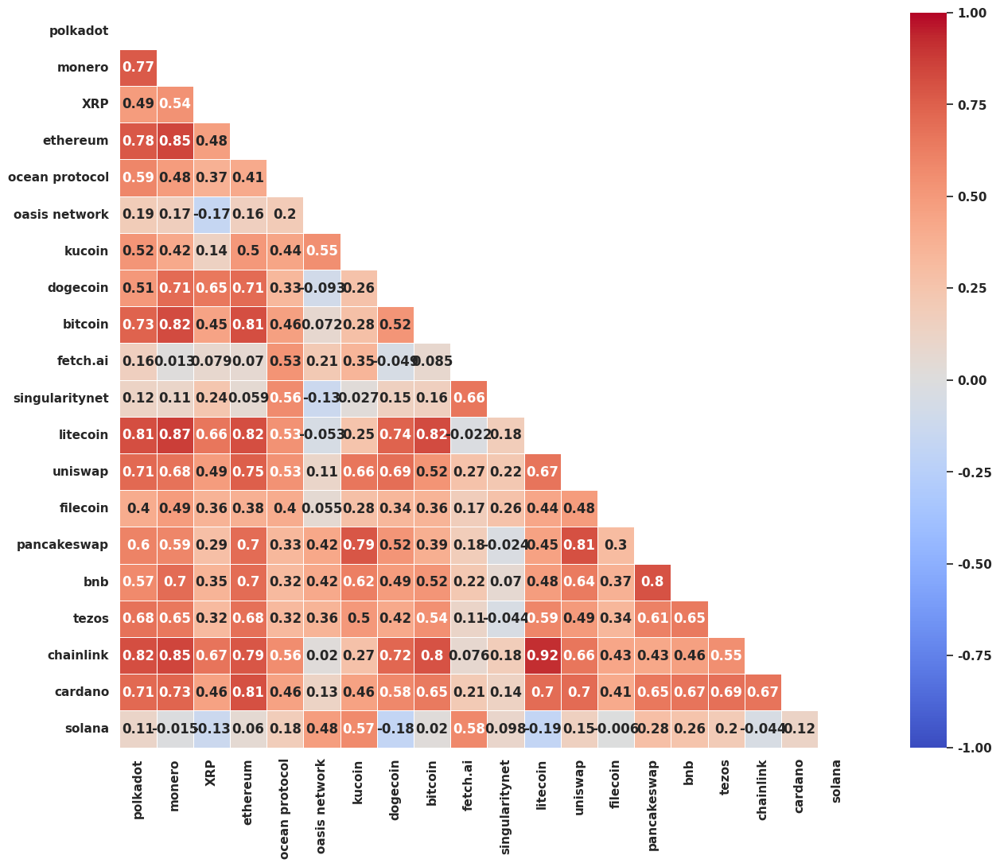

In [261]:
# Calculate Pearson Correlation 
data = my_trend_df_full
data_corr = DC.calc_pearson_coefficient(data)

# Plot Grid here 
matrix_data = data_corr
label_list = data.columns
vmin, vmax = [-1,1]
fig,ax = DC.plot_pearson_heatmap(matrix_data,label_list, vmin, vmax, cmap ='coolwarm',triangle='lower',width=18,height=12)

# Bold the labels
ax.set_xticklabels(ax.get_xticklabels(), fontweight='bold')
ax.set_yticklabels(ax.get_yticklabels(), fontweight='bold')
    
fig.savefig('../results/my_trend_df_full_heatmap.png',dpi=300,
            bbox_inches='tight',transparent=False,facecolor='white')

## 4.3 Correlations of Token Price and Google Trends 

In [ ]:
# Load combined_df dict

## Save all the processed dict into result directory
filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/combined_df_dict.pkl'
filedict =  combined_df_dict
DC.save_dict(filepath,filedict)

## Save all the processed dict into result directory
filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/corr_df_dict.pkl'
filedict = corr_df_dict
DC.save_dict(filepath,filedict)

In [2]:
filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/combined_df_dict.pkl'
combined_df_dict = DC.load_dict(filepath)

filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/corr_df_dict.pkl'
corr_df_dict = DC.load_dict(filepath)

In [ ]:
# Create a weekly average data set based on the week in google trends.

In [5]:
corr_df_dict.keys()

dict_keys(['polkadot', 'monero', 'XRP', 'ethereum', 'ocean protocol', 'oasis network', 'kucoin', 'dogecoin', 'bitcoin', 'fetch.ai', 'singularitynet', 'litecoin', 'uniswap', 'filecoin', 'pancakeswap', 'bnb', 'tezos', 'chainlink', 'cardano', 'solana'])

In [ ]:
# See how the overall correlation will be different if we assess the data on monthly basis only 
#

In [27]:
combined_df_dict[c] # 2 weeks average and  4 weeks average

,Start_Date,End_Date,High_Ave,Low_Ave,Open_Ave,Close_Ave,Volume_Ave,count
0,2021-01-03,2021-01-10,2.915760,2.238761,2.441477,2.647176,9.210054e+07,9
1,2021-01-10,2021-01-17,3.670969,3.110520,3.382925,3.436863,6.689779e+07,7
2,2021-01-17,2021-01-24,3.812946,3.282194,3.530544,3.556798,5.188801e+07,7
3,2021-01-24,2021-01-31,4.106004,3.668613,3.814036,3.902187,5.425503e+07,7
4,2021-01-31,2021-02-07,5.988976,5.169214,5.416370,5.722287,8.435480e+07,7
...,...,...,...,...,...,...,...,...
165,2024-03-03,2024-03-10,143.008043,130.223979,135.455268,137.304314,5.046509e+09,68
166,2024-03-10,2024-03-17,173.552933,156.577736,161.781809,168.971218,8.285751e+09,90
167,2024-03-17,2024-03-24,193.400049,173.799986,183.507874,183.717798,7.185498e+09,100
168,2024-03-24,2024-03-31,194.557543,183.749403,187.355181,191.103447,3.171976e+09,72


In [28]:
df = combined_df_dict[c].drop(['Start_Date','End_Date'],axis=1)

In [29]:
df

,High_Ave,Low_Ave,Open_Ave,Close_Ave,Volume_Ave,count
0,2.915760,2.238761,2.441477,2.647176,9.210054e+07,9
1,3.670969,3.110520,3.382925,3.436863,6.689779e+07,7
2,3.812946,3.282194,3.530544,3.556798,5.188801e+07,7
3,4.106004,3.668613,3.814036,3.902187,5.425503e+07,7
4,5.988976,5.169214,5.416370,5.722287,8.435480e+07,7
...,...,...,...,...,...,...
165,143.008043,130.223979,135.455268,137.304314,5.046509e+09,68
166,173.552933,156.577736,161.781809,168.971218,8.285751e+09,90
167,193.400049,173.799986,183.507874,183.717798,7.185498e+09,100
168,194.557543,183.749403,187.355181,191.103447,3.171976e+09,72


In [52]:
def create_lag_df(df,n):
    dict_length = len(df)
    # Creating a dictionary to store the different rolling averages dataframes
    averages_dict = {}
    new_rows=[]
    for i in range(0, dict_length-(n-1), n):
        new_rows.append(df[i:i+n].mean())
    new_df = pd.DataFrame(new_rows)
    return new_df


In [39]:
df = combined_df_dict[c].drop(['Start_Date','End_Date'],axis=1)

In [53]:
rolling_windows = [2, 4, 8]
averaged_dict = {}
for n in rolling_windows:
    new_dict= {}
    for c in namelist:
        df = combined_df_dict[c].drop(['Start_Date','End_Date'],axis=1)
        new_df = create_lag_df(df,n)
        new_dict.update({c:new_df})
    averaged_dict.update({n:new_dict})

In [55]:
filepath = '/home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/time_lag_averaged_dict.pkl'
filedict = averaged_dict
DC.save_dict(filepath,filedict)

The dict data has been saved to /home/Lakehouse/Competition/4_GoogleCryptoTrend_28Apr/results/time_lag_averaged_dict.pkl.


In [47]:
list(df[0:2].mean())

[3.2933644375, 2.6746403125000002, 2.912201, 3.04201925, 79499160.9375, 8.0]

In [32]:
averages_dict.keys()

dict_keys([2, 4, 8])

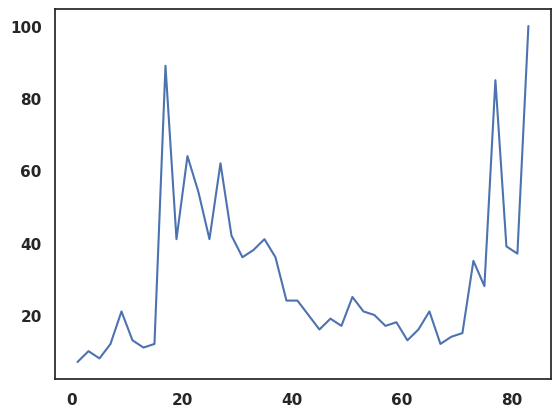

In [35]:
plt.plot(averages_dict[2]['count'])

In [263]:
color_list

['red',
 'orange',
 'black',
 'aliceblue',
 'antiquewhite',
 'aqua',
 'aquamarine',
 'azure',
 'beige',
 'bisque',
 'black',
 'blanchedalmond',
 'blue',
 'blueviolet',
 'brown',
 'burlywood',
 'cadetblue',
 'chartreuse',
 'chocolate',
 'coral',
 'cornflowerblue',
 'cornsilk',
 'crimson']

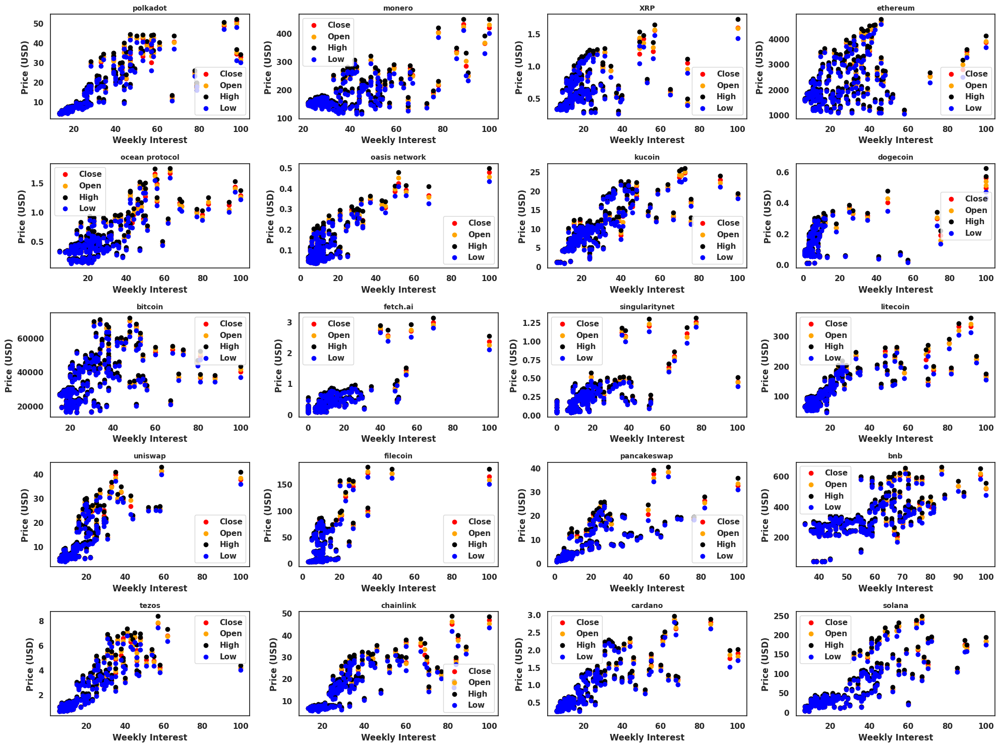

In [264]:
# Low high price difference over time 
pair_list = list(combined_df_dict.keys())
fig, axes = plt.subplots(5, 4, figsize=(20, 15))  # Creating a 5x4 grid of subplots


# Iterate over each subplot

for c,  (i, ax) in zip(pair_list, enumerate(axes.flatten())):
    # Scatter plots for each average; modify color indices if needed
    df = combined_df_dict[c]
    ax.scatter(df['count'], df['Close_Ave'], label='Close', c=color_list[0])
    ax.scatter(df['count'], df['Open_Ave'], label='Open', c=color_list[1])
    ax.scatter(df['count'], df['High_Ave'], label='High', c=color_list[2])
    ax.scatter(df['count'], df['Low_Ave'], label='Low', c='blue')

    # Setting titles, labels etc
    ax.set_title(f'{c}', fontsize=10, fontweight='bold')  # Customize title as needed
    ax.set_xlabel('Weekly Interest')
    ax.set_ylabel('Price (USD)')

    # Adding a legend to each subplot
    ax.legend()

# Adjust layout to prevent overlap
plt.tight_layout()

# Save the entire figure
plt.savefig('../results/price_google_trend_overview.png', dpi=300, bbox_inches='tight', transparent=False, facecolor='white')
# plt.show()

In [ ]:
## also if we use the high (Hype) [using High values instead of ] Result won't be much difference, because the difference are small. 

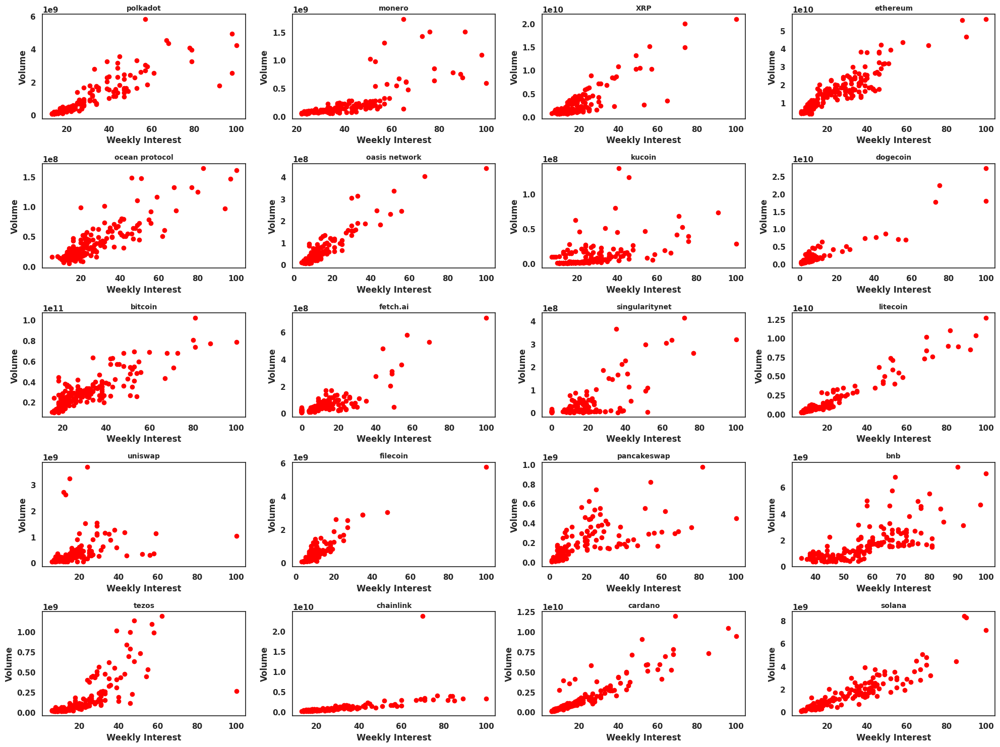

In [266]:
# Low high price difference over time 
pair_list = list(combined_df_dict.keys())
fig, axes = plt.subplots(5, 4, figsize=(20, 15))  # Creating a 5x4 grid of subplots


# Iterate over each subplot

for c,  (i, ax) in zip(pair_list, enumerate(axes.flatten())):
    # Scatter plots for each average; modify color indices if needed
    df = combined_df_dict[c]
    ax.scatter(df['count'], df['Volume_Ave'], c=color_list[0])

    # Setting titles, labels etc
    ax.set_title(f'{c}', fontsize=10, fontweight='bold')  # Customize title as needed
    ax.set_xlabel('Weekly Interest')
    ax.set_ylabel('Volume')

    # # Adding a legend to each subplot
    # ax.legend()

# Adjust layout to prevent overlap
plt.tight_layout()

# Save the entire figure
plt.savefig('../results/volume_google_trend_overview.png', dpi=300, bbox_inches='tight', transparent=False, facecolor='white')
# plt.show()

In [6]:
# load data , plot corr matrix
# corr_df_dict['polkadot']

In [8]:
data.head()

,High_Ave,Low_Ave,Open_Ave,Close_Ave,Volume_Ave,count
0,10.202270,9.048635,9.659605,9.666894,2.292962e+09,44
1,13.261568,10.539502,11.554766,12.464932,4.532866e+09,67
2,18.171025,15.913830,17.223948,17.202344,3.937106e+09,79
3,17.784224,16.128053,17.113528,16.785937,2.858895e+09,44
4,19.653184,17.681257,18.495350,18.910994,3.252540e+09,79


In [25]:
len(data)

170

In [9]:
data.keys()

Index(['High_Ave', 'Low_Ave', 'Open_Ave', 'Close_Ave', 'Volume_Ave', 'count'], dtype='object')

In [12]:
data[['Close_Ave', 'Volume_Ave', 'count']]

,Close_Ave,Volume_Ave,count
0,9.666894,2.292962e+09,44
1,12.464932,4.532866e+09,67
2,17.202344,3.937106e+09,79
3,16.785937,2.858895e+09,44
4,18.910994,3.252540e+09,79
...,...,...,...
165,10.180222,7.104704e+08,34
166,10.694577,6.479103e+08,34
167,9.340347,3.860030e+08,27
168,9.553833,2.574025e+08,26


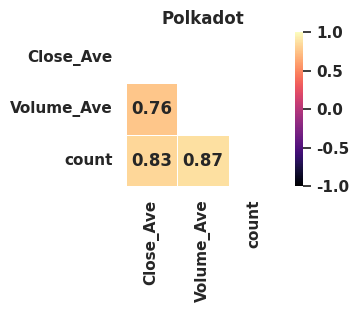

In [58]:
# Calculate Pearson Correlation 
#for c in namelist:
c= 'polkadot'
data = corr_df_dict[c][['Close_Ave', 'Volume_Ave', 'count']]
data_corr = DC.calc_pearson_coefficient(data)

# Plot Grid here 
matrix_data = data_corr
label_list = data.columns
vmin, vmax = [-1,1]
fig,ax = DC.plot_pearson_heatmap(matrix_data,label_list, vmin, vmax, cmap ='magma',triangle='lower',width=4,height=2)


# Bold the labels
ax.set_xticklabels(ax.get_xticklabels(), fontweight='bold')
ax.set_yticklabels(ax.get_yticklabels(), fontweight='bold')

# Add title to the heatmap
ax.set_title(f'{c.capitalize()}', fontsize=12, fontweight='bold')

fig.savefig(f'../results/heatmap_weekly_{c}.png',dpi=300,
            bbox_inches='tight',transparent=False,facecolor='white')

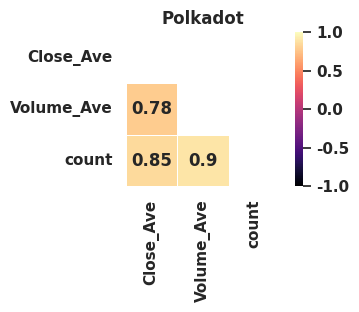

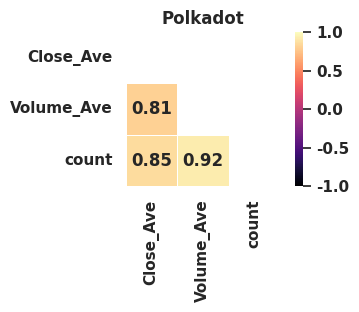

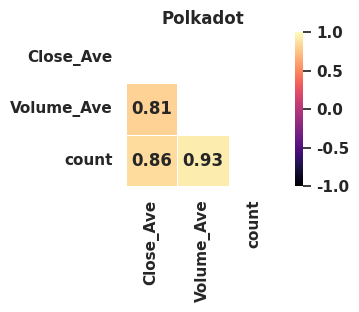

In [57]:
# Check result for Polkadot under different time lag

# Calculate Pearson Correlation 
for n in [2,4,8]:
    #for c in namelist:
    c= 'polkadot'
    data = averaged_dict[n][c][['Close_Ave', 'Volume_Ave', 'count']]
    data_corr = DC.calc_pearson_coefficient(data)

    # Plot Grid here 
    matrix_data = data_corr
    label_list = data.columns
    vmin, vmax = [-1,1]
    fig,ax = DC.plot_pearson_heatmap(matrix_data,label_list, vmin, vmax, cmap ='magma',triangle='lower',width=4,height=2)


    # Bold the labels
    ax.set_xticklabels(ax.get_xticklabels(), fontweight='bold')
    ax.set_yticklabels(ax.get_yticklabels(), fontweight='bold')

    # Add title to the heatmap
    ax.set_title(f'{c.capitalize()}', fontsize=12, fontweight='bold')

    fig.savefig(f'../results/heatmap_weekly_{n}_{c}.png',dpi=300,
                bbox_inches='tight',transparent=False,facecolor='white')


/home/Lakehouse/DreamBrookPy/src/DreamBrookPy/DataChef.py:515: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(width, height))


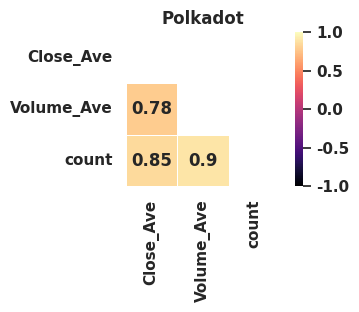

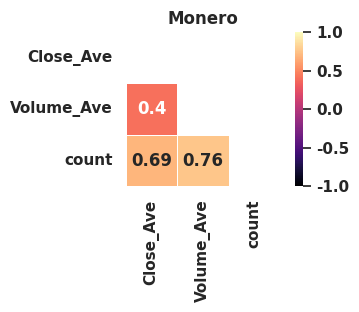

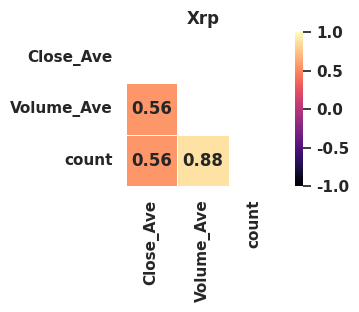

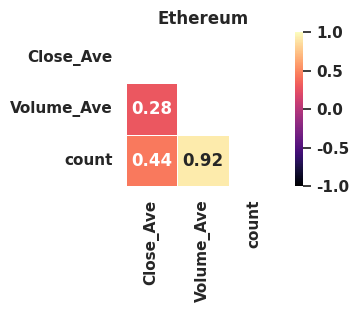

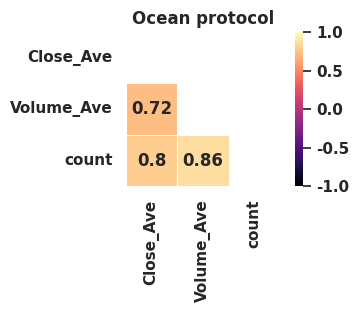

...

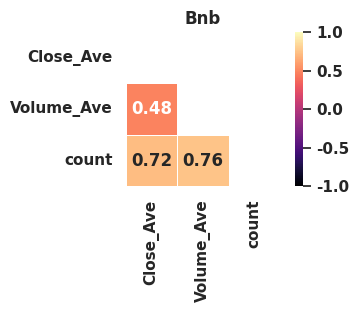

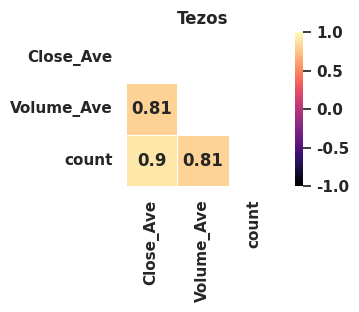

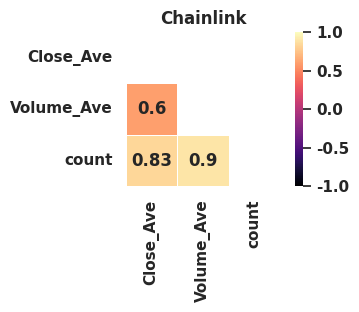

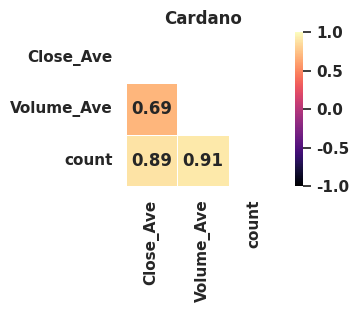

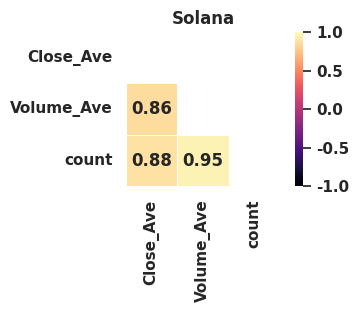

In [59]:
# Calculate Pearson Correlation 
namelist = list(combined_df_dict.keys())
# Calculate Pearson Correlation 
for n in [2,4,8]:
    for c in namelist:
        data = averaged_dict[n][c][['Close_Ave', 'Volume_Ave', 'count']]
        data_corr = DC.calc_pearson_coefficient(data)

        # Plot Grid here 
        matrix_data = data_corr
        label_list = data.columns
        vmin, vmax = [-1,1]
        fig,ax = DC.plot_pearson_heatmap(matrix_data,label_list, vmin, vmax, cmap ='magma',triangle='lower',width=4,height=2)

        # Bold the labels
        ax.set_xticklabels(ax.get_xticklabels(), fontweight='bold')
        ax.set_yticklabels(ax.get_yticklabels(), fontweight='bold')

        # Add title to the heatmap
        ax.set_title(f'{c.capitalize()}', fontsize=12, fontweight='bold')

        fig.savefig(f'../results/lag/heatmap_weekly_{n}_{c}.png',dpi=300,
                    bbox_inches='tight',transparent=False,facecolor='white')

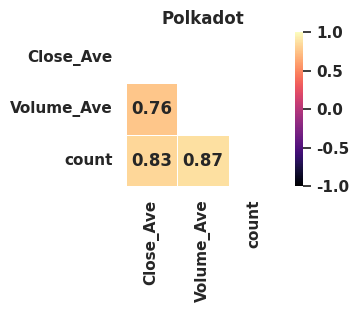

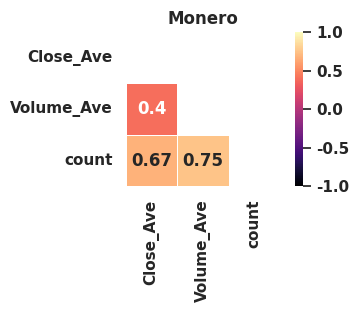

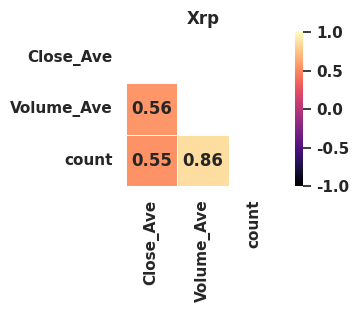

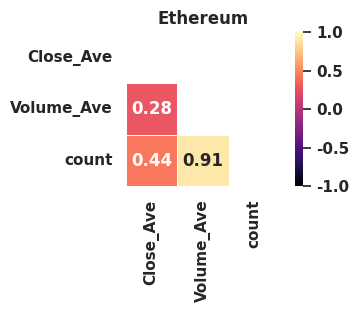

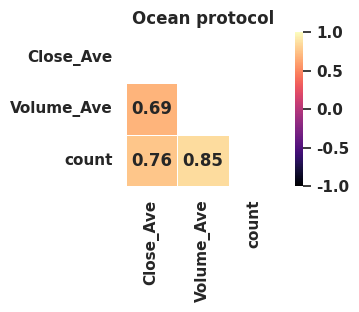

...

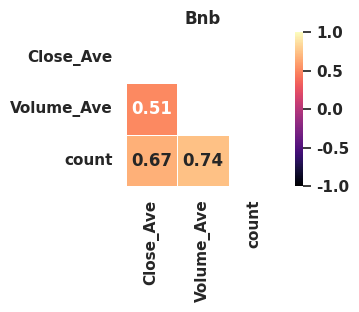

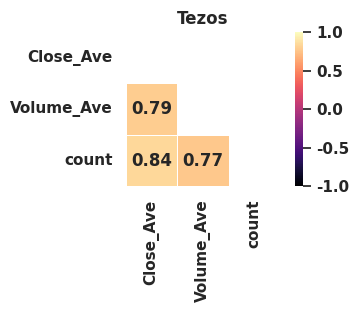

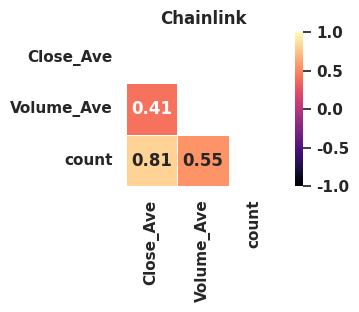

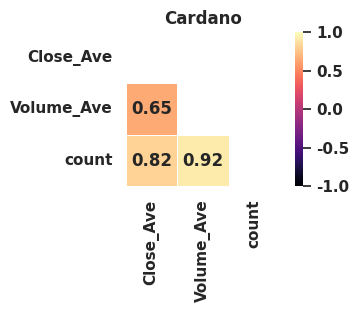

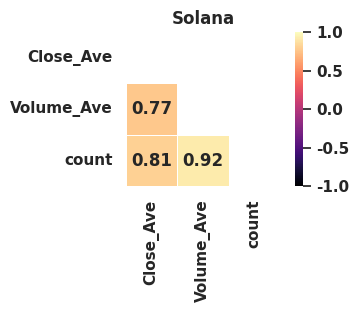

In [24]:
# Calculate Pearson Correlation 
namelist = list(combined_df_dict.keys())
for c in namelist:
    data = corr_df_dict[c][['Close_Ave', 'Volume_Ave', 'count']]
    data_corr = DC.calc_pearson_coefficient(data)

    # Plot Grid here 
    matrix_data = data_corr
    label_list = data.columns
    vmin, vmax = [-1,1]
    fig,ax = DC.plot_pearson_heatmap(matrix_data,label_list, vmin, vmax, cmap ='magma',triangle='lower',width=4,height=2)

    # Bold the labels
    ax.set_xticklabels(ax.get_xticklabels(), fontweight='bold')
    ax.set_yticklabels(ax.get_yticklabels(), fontweight='bold')

    # Add title to the heatmap
    ax.set_title(f'{c.capitalize()}', fontsize=12, fontweight='bold')

    fig.savefig(f'../results/heatmap_weekly_{c}.png',dpi=300,
                bbox_inches='tight',transparent=False,facecolor='white')

##  4.4 Correlation between Tokens 

Analyze their dependence on BTC, ETH, SOL and L1 network layers

In [ ]:
# This is doable. 
# Check how the correlation differ for open close low high and volume
# Create 5 Dataset with each containing 20 data. 



In [113]:
Aligned_price_data_dict['ETH-USD'].head()

,Open,High,Low,Close,Adj Close,Volume,Year,Month,Day
Date,,,,,,,,,
2021-01-01,737.708374,749.201843,719.792236,730.367554,730.367554,13652004358,2021,1,1
2021-01-02,730.402649,786.798462,718.109497,774.534973,774.534973,19740771179,2021,1,2
2021-01-03,774.511841,1006.565002,771.561646,975.507690,975.507690,45200463368,2021,1,3
2021-01-04,977.058838,1153.189209,912.305359,1040.233032,1040.233032,56945985763,2021,1,4
2021-01-05,1041.498779,1129.371460,986.811279,1100.006104,1100.006104,41535932781,2021,1,5


In [114]:
pair_list = list(Aligned_price_data_dict.keys())
# Set up a 5x4 grid of subplots with shared x-axes (if desired)
# Loop over each pair and its corresponding DataFrame
open_list = []
close_list = []
high_list = []
low_list = []
volume_list = []

for i, c in enumerate(pair_list):
    open_list.append(Aligned_price_data_dict[c]['Open'])
    close_list.append(Aligned_price_data_dict[c]['Close'])
    high_list.append(Aligned_price_data_dict[c]['High'])
    low_list.append(Aligned_price_data_dict[c]['Low'])
    volume_list.append(Aligned_price_data_dict[c]['Volume'])
    
    

In [121]:
col_list = []
for c in pair_list:
    col_list.append(c[:-4])

In [122]:
col_list

['DOT',
 'XMR',
 'XRP',
 'ETH',
 'OCEAN',
 'ROSE',
 'KCS',
 'DOGE',
 'BTC',
 'FET',
 'AGIX',
 'LTC',
 'UNI',
 'FIL',
 'CAKE',
 'BNB',
 'XTZ',
 'LINK',
 'ADA',
 'SOL']

In [126]:
df_open = pd.DataFrame(open_list).T
df_open.columns =col_list

df_close= pd.DataFrame(close_list).T
df_close.columns =col_list

df_high = pd.DataFrame(high_list).T
df_high.columns =col_list

df_low = pd.DataFrame(low_list).T
df_low.columns =col_list

df_volume = pd.DataFrame(volume_list).T
df_volume.columns =col_list

In [130]:
len(df_volume)

1195

In [131]:
df_open.to_csv('../results/df_aligned_open.csv')
df_close.to_csv('../results/df_aligned_close.csv')
df_low.to_csv('../results/df_aligned_low.csv')
df_high.to_csv('../results/df_aligned_high.csv')
df_volume.to_csv('../results/df_aligned_volume.csv')

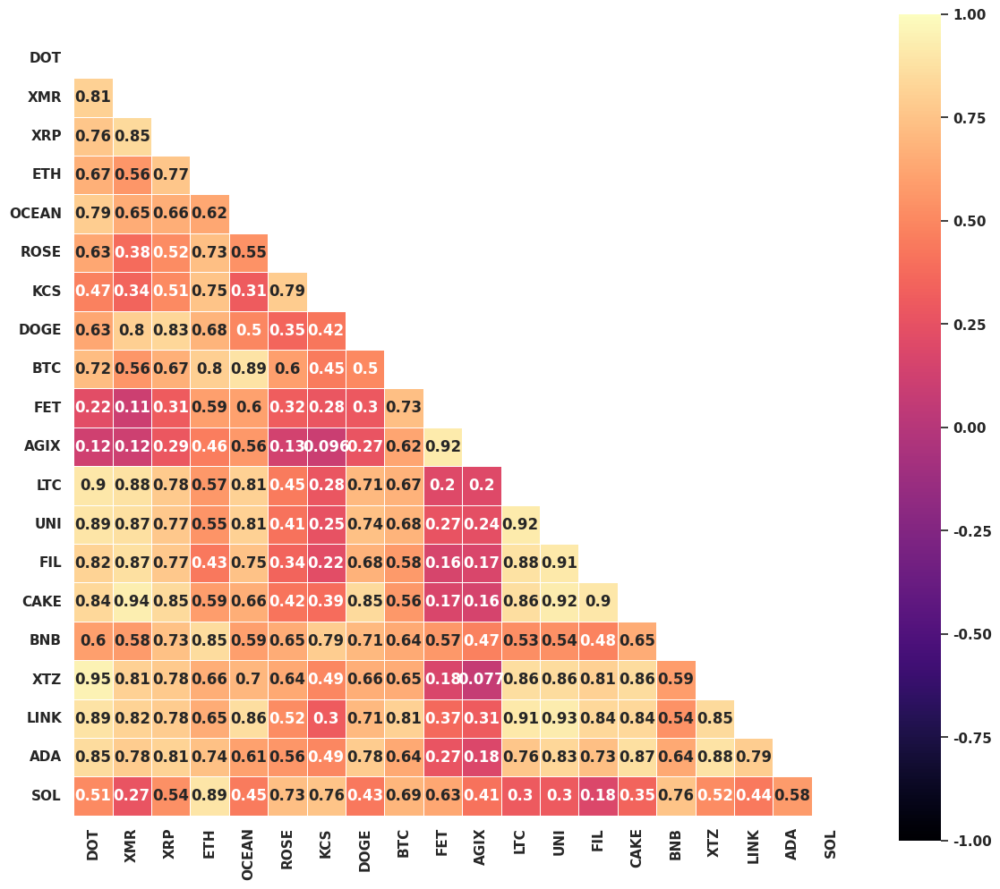

In [141]:
# Calculate Pearson Correlation 
data = df_open
data_corr = DC.calc_pearson_coefficient(data)

# Plot Grid here 
matrix_data = data_corr
label_list = data.columns
vmin, vmax = [-1,1]
fig,ax = DC.plot_pearson_heatmap(matrix_data,label_list, vmin, vmax, cmap ='magma',triangle='lower',width=14,height=12)

# Bold the labels
ax.set_xticklabels(ax.get_xticklabels(), fontweight='bold')
ax.set_yticklabels(ax.get_yticklabels(), fontweight='bold')
    
fig.savefig('../results/open_heatmap.png',dpi=300,
            bbox_inches='tight',transparent=False,facecolor='white')

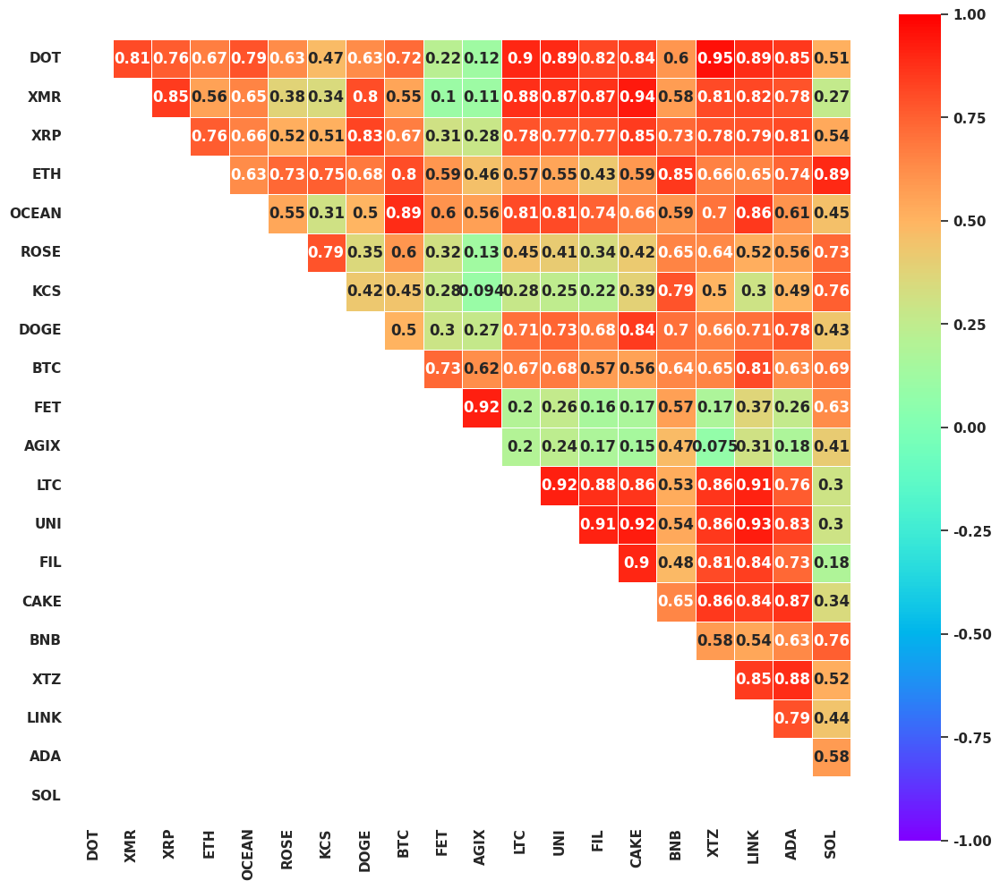

In [142]:
# Calculate Pearson Correlation 
data = df_close
data_corr = DC.calc_pearson_coefficient(data)

# Plot Grid here 
matrix_data = data_corr
label_list = data.columns
vmin, vmax = [-1,1]
fig,ax = DC.plot_pearson_heatmap(matrix_data,label_list, vmin, vmax, cmap ='rainbow',triangle='upper',width=14,height=12)

# Bold the labels
ax.set_xticklabels(ax.get_xticklabels(), fontweight='bold')
ax.set_yticklabels(ax.get_yticklabels(), fontweight='bold')
    
fig.savefig('../results/close_heatmap.png',dpi=300,
            bbox_inches='tight',transparent=False,facecolor='white')

In [144]:
for a in data_corr:
    

array([1.   , 0.807, 0.762, 0.67 , 0.789, 0.63 , 0.471, 0.629, 0.721,
       0.22 , 0.121, 0.901, 0.894, 0.818, 0.841, 0.597, 0.954, 0.889,
       0.852, 0.512])

In [145]:
max(data_corr[0])

1.0

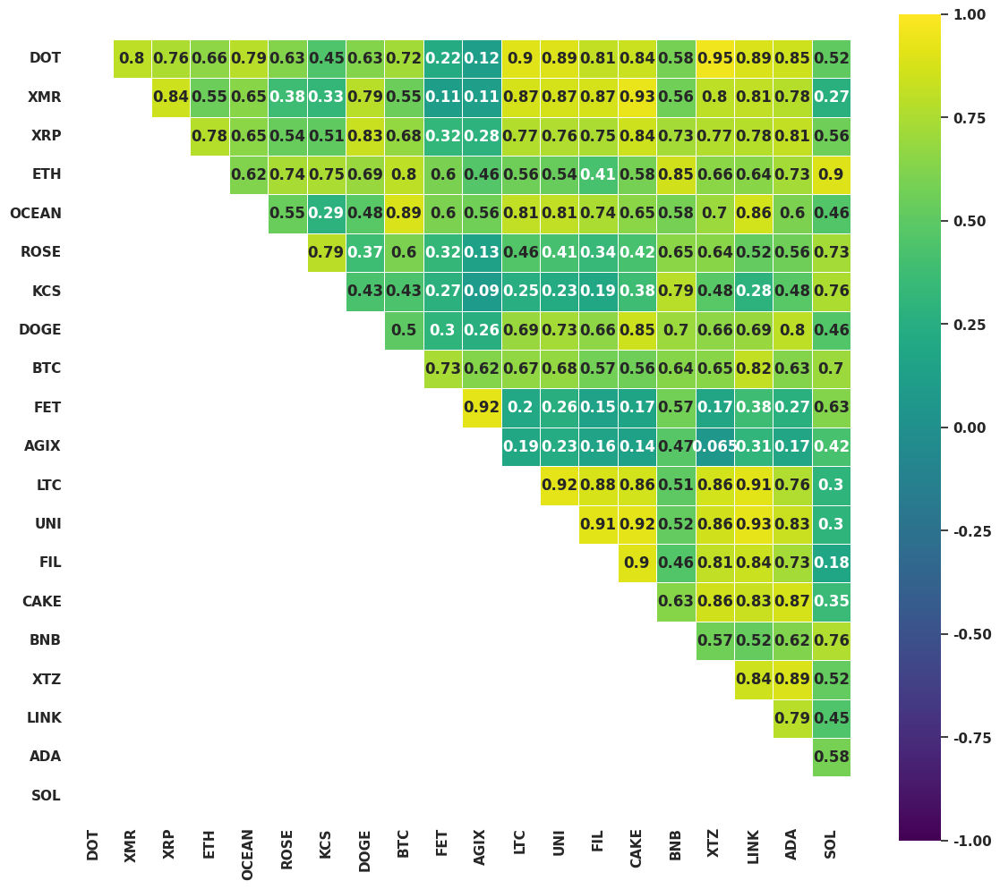

In [146]:
# Calculate Pearson Correlation 
data = df_low
data_corr = DC.calc_pearson_coefficient(data)

# Plot Grid here 
matrix_data = data_corr
label_list = data.columns
vmin, vmax = [-1,1]
fig,ax = DC.plot_pearson_heatmap(matrix_data,label_list, vmin, vmax, cmap ='viridis',triangle='upper',width=14,height=12)

# Bold the labels
ax.set_xticklabels(ax.get_xticklabels(), fontweight='bold')
ax.set_yticklabels(ax.get_yticklabels(), fontweight='bold')
    
fig.savefig('../results/low_heatmap.png',dpi=300,
            bbox_inches='tight',transparent=False,facecolor='white')

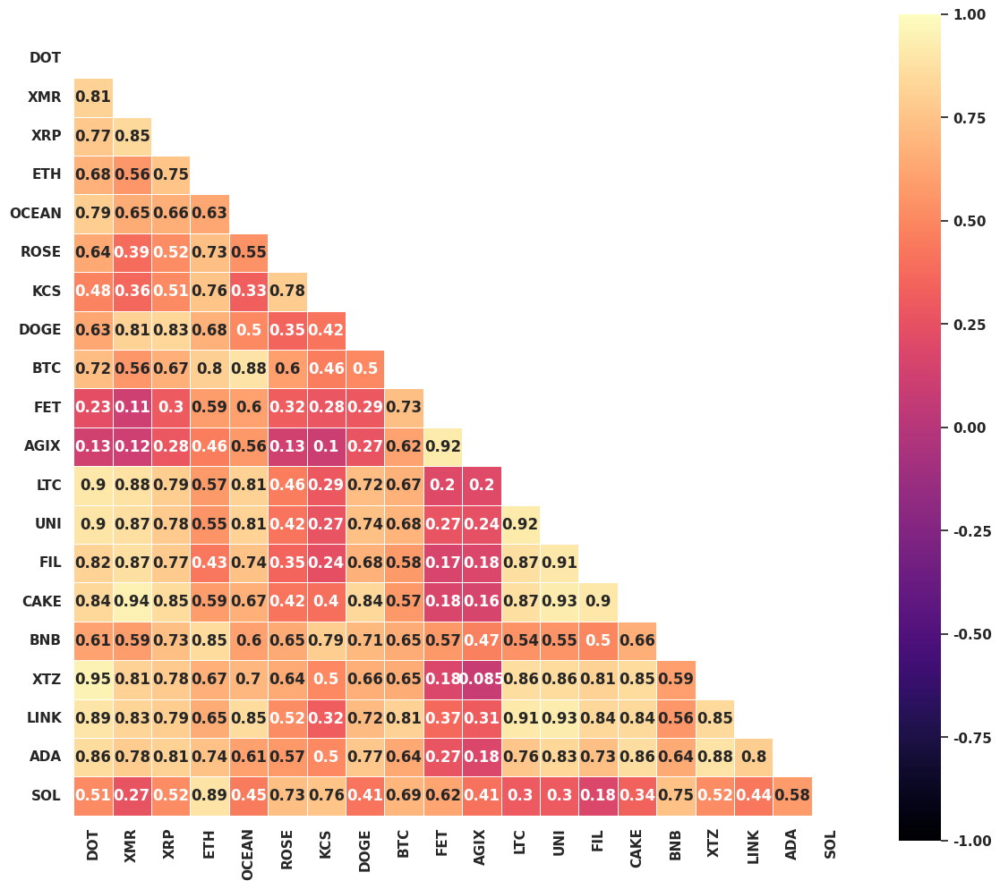

In [149]:
# Calculate Pearson Correlation 
data = df_high
data_corr = DC.calc_pearson_coefficient(data)

# Plot Grid here 
matrix_data = data_corr
label_list = data.columns
vmin, vmax = [-1,1]
fig,ax = DC.plot_pearson_heatmap(matrix_data,label_list, vmin, vmax, cmap ='magma',triangle='lower',width=14,height=12)

# Bold the labels
ax.set_xticklabels(ax.get_xticklabels(), fontweight='bold')
ax.set_yticklabels(ax.get_yticklabels(), fontweight='bold')
    
fig.savefig('../results/high_heatmap.png',dpi=300,
            bbox_inches='tight',transparent=False,facecolor='white')

In [158]:
#AVErage between High and Low
# Calculate Pearson Correlation 
data = df_high
data_corr1 = DC.calc_pearson_coefficient(data)

data = df_low
data_corr2 = DC.calc_pearson_coefficient(data)

In [153]:
data_corr1

array([[1.   , 0.811, 0.767, 0.676, 0.791, 0.637, 0.484, 0.632, 0.725,
        0.227, 0.128, 0.901, 0.896, 0.818, 0.843, 0.61 , 0.951, 0.892,
        0.856, 0.512],
       [0.811, 1.   , 0.851, 0.559, 0.654, 0.386, 0.361, 0.809, 0.557,
        0.11 , 0.117, 0.879, 0.872, 0.871, 0.938, 0.591, 0.81 , 0.826,
        0.784, 0.265],
       [0.767, 0.851, 1.   , 0.753, 0.661, 0.516, 0.513, 0.829, 0.666,
        0.303, 0.284, 0.792, 0.777, 0.774, 0.855, 0.734, 0.78 , 0.794,
        0.809, 0.521],
       [0.676, 0.559, 0.753, 1.   , 0.626, 0.733, 0.755, 0.675, 0.802,
        0.592, 0.457, 0.573, 0.554, 0.434, 0.589, 0.853, 0.667, 0.653,
        0.744, 0.89 ],
       [0.791, 0.654, 0.661, 0.626, 1.   , 0.546, 0.327, 0.504, 0.884,
        0.605, 0.563, 0.806, 0.813, 0.744, 0.668, 0.605, 0.702, 0.855,
        0.609, 0.45 ],
       [0.637, 0.386, 0.516, 0.733, 0.546, 1.   , 0.784, 0.347, 0.6  ,
        0.316, 0.131, 0.457, 0.417, 0.353, 0.419, 0.648, 0.642, 0.519,
        0.566, 0.733],
       [0.

In [154]:
data_corr_ave = (np.add(data_corr1, data_corr2))/2

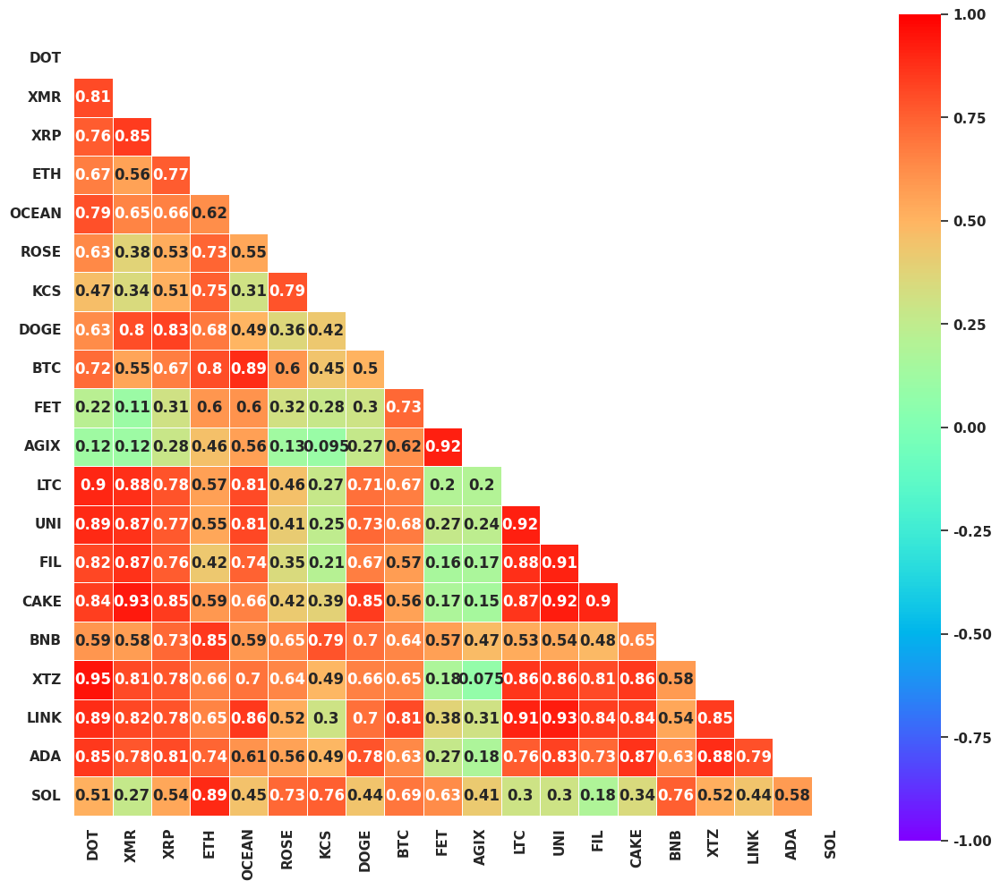

In [160]:
# Plot Grid here 
matrix_data = data_corr_ave
label_list = data.columns
vmin, vmax = [-1,1]
fig,ax = DC.plot_pearson_heatmap(matrix_data,label_list, vmin, vmax, cmap ='rainbow',triangle='lower',width=14,height=12)

# Bold the labels
ax.set_xticklabels(ax.get_xticklabels(), fontweight='bold')
ax.set_yticklabels(ax.get_yticklabels(), fontweight='bold')
    
fig.savefig('../results/average_price_heatmap.png',dpi=300,
            bbox_inches='tight',transparent=False,facecolor='white')

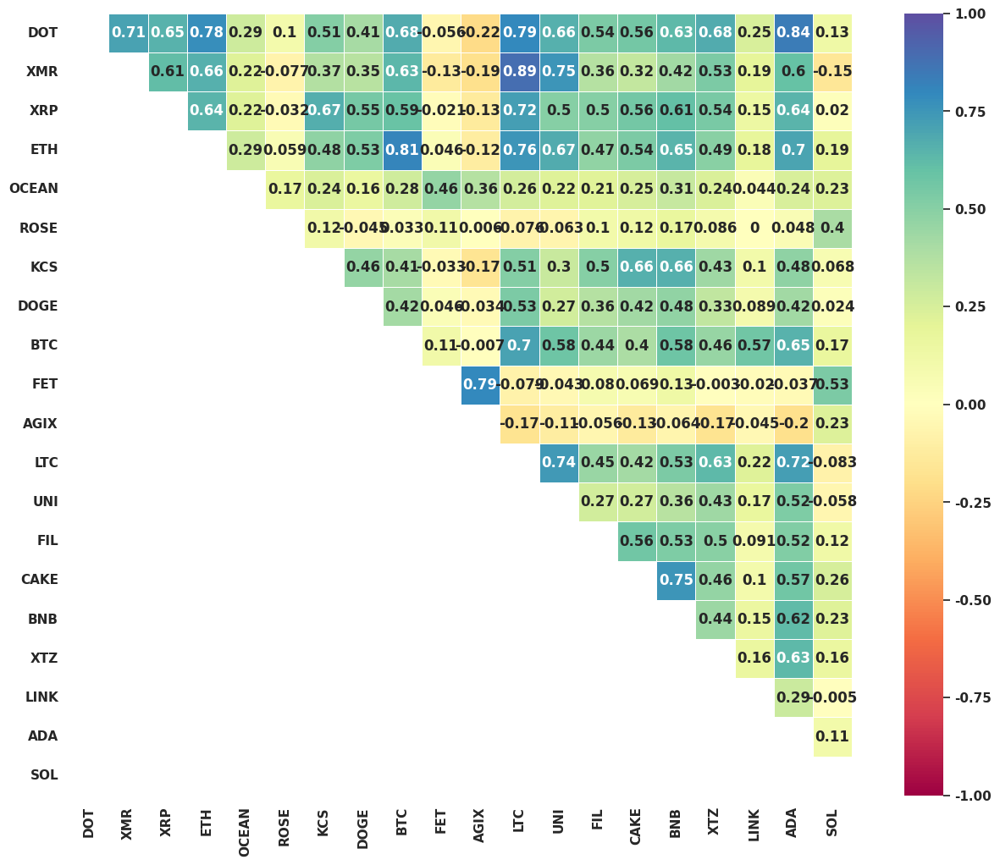

In [163]:
# Calculate Pearson Correlation 
data = df_volume
data_corr = DC.calc_pearson_coefficient(data)

# Plot Grid here 
matrix_data = data_corr
label_list = data.columns
vmin, vmax = [-1,1]
fig,ax = DC.plot_pearson_heatmap(matrix_data,label_list, vmin, vmax, cmap ='Spectral',triangle='upper',width=16,height=12)

# Bold the labels
ax.set_xticklabels(ax.get_xticklabels(), fontweight='bold')
ax.set_yticklabels(ax.get_yticklabels(), fontweight='bold')
    
fig.savefig('../results/volume_heatmap.png',dpi=300,
            bbox_inches='tight',transparent=False,facecolor='white')

### 4.4.1 Check Autocorrelation of Google Trend for each coin

In [62]:
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf

In [74]:
combined_df_dict.keys()

dict_keys(['polkadot', 'monero', 'XRP', 'ethereum', 'ocean protocol', 'oasis network', 'kucoin', 'dogecoin', 'bitcoin', 'fetch.ai', 'singularitynet', 'litecoin', 'uniswap', 'filecoin', 'pancakeswap', 'bnb', 'tezos', 'chainlink', 'cardano', 'solana'])

In [75]:
combined_df_dict['ocean protocol'].head()

,Start_Date,End_Date,High_Ave,Low_Ave,Open_Ave,Close_Ave,Volume_Ave,count
0,2021-01-03,2021-01-10,0.467592,0.388671,0.416714,0.429913,4.910255e+07,36
1,2021-01-10,2021-01-17,0.488975,0.410063,0.445054,0.459292,4.873943e+07,36
2,2021-01-17,2021-01-24,0.601469,0.511049,0.549111,0.553436,6.745434e+07,39
3,2021-01-24,2021-01-31,0.603084,0.531145,0.566497,0.565462,6.253006e+07,26
4,2021-01-31,2021-02-07,0.667789,0.587566,0.622631,0.639432,5.238624e+07,41


In [76]:
c = 'ocean protocol'
df = combined_df_dict[c][['Start_Date','Close_Ave','Volume_Ave','count']]
df.column = ['Date','Close_Price','Trade_Volume', 'Google Interest Trend']
time_series = df['Google Interest Trend']
time_series.index = df['Date']

,Start_Date,Close_Ave,Volume_Ave,count
0,2021-01-03,0.429913,4.910255e+07,36
1,2021-01-10,0.459292,4.873943e+07,36
2,2021-01-17,0.553436,6.745434e+07,39
3,2021-01-24,0.565462,6.253006e+07,26
4,2021-01-31,0.639432,5.238624e+07,41
...,...,...,...,...
165,2024-03-03,1.153256,1.324236e+08,68
166,2024-03-10,1.179113,9.125247e+07,56
167,2024-03-17,1.096002,6.376890e+07,48
168,2024-03-24,1.285364,1.608548e+08,100


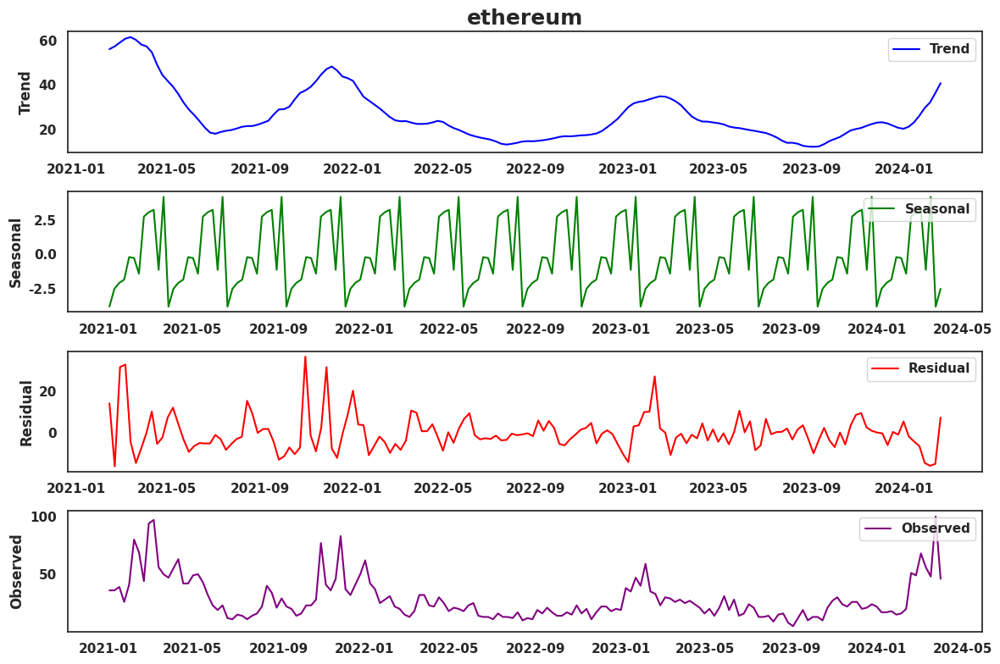

In [86]:
myc= 'blue'
# Decompose the time series data
result = seasonal_decompose(time_series, model='additive', period=12)  # adjust the period based on your data's seasonality

# Create a figure to host the plots
fig, axs = plt.subplots(4, 1, figsize=(12, 8))  # Change figure size as needed

# Plot each component with a different color
axs[0].set_title(f'{c}', fontsize=18, fontweight='bold')
axs[0].plot(result.trend, color='blue', label='Trend')
axs[0].legend(loc='upper right')
axs[0].set_ylabel('Trend')

axs[1].plot(result.seasonal, color='green', label='Seasonal')
axs[1].legend(loc='upper right')
axs[1].set_ylabel('Seasonal')

axs[2].plot(result.resid, color='red', label='Residual')
axs[2].legend(loc='upper right')
axs[2].set_ylabel('Residual')

axs[3].plot(result.observed, color='purple', label='Observed')
axs[3].legend(loc='upper right')
axs[3].set_ylabel('Observed')

# Adjust layout
plt.tight_layout()

# Show the decomposition plots
plt.show()

fig.savefig(f'../results/trend_pattern/{c}_pattern.png',dpi=300,
            bbox_inches='tight',transparent=False,facecolor='white')



In [109]:
myc='royalblue'
# Plot the Autocorrelation Function (ACF)
plt.figure(figsize=(8, 3))  # Longer horizontally
plot_acf(time_series, lags=24, alpha=None, ax=ax,color = myc)

# Find the collection of vlines (which is a LineCollection object) and change their color
vline_collection = ax.collections[0]  # The vlines are typically the first collection
vline_collection.set_color(myc)
ax.set_xlabel('Time Lag (Weeks)')
ax.set_ylabel('Autocorrelation')
ax.set_title(c,fontsize=18, fontweight='bold')
ax.set_ylim([-1,1.05])
fig.savefig(f'../results/trend_pattern/{c}_ACF.png',dpi=300,
            bbox_inches='tight',transparent=False,facecolor='white')

<Figure size 800x300 with 0 Axes>

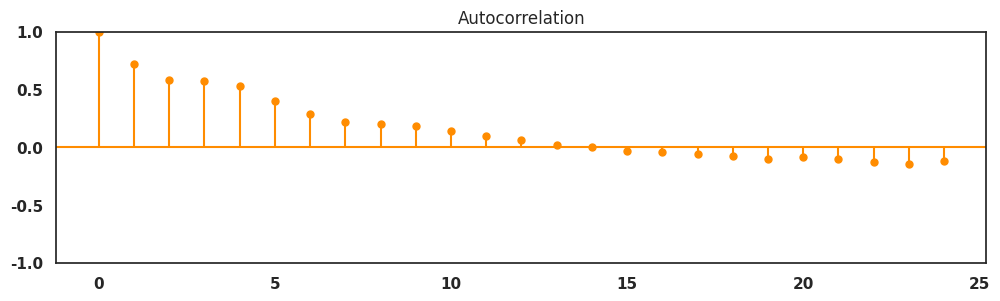

In [104]:
# Call plot_acf and store the figure object
fig, ax = plt.subplots(figsize=(12, 3))
plot_acf(time_series, lags=24, alpha=None, ax=ax,color = 'darkorange')

# Find the collection of vlines (which is a LineCollection object) and change their color
vline_collection = ax.collections[0]  # The vlines are typically the first collection
vline_collection.set_color('darkorange')

# Show the plot
plt.show()

In [117]:
df = combined_df_dict[c][['Start_Date','Close_Ave','Volume_Ave','count']]
df.columns = ['Date','Close_Price','Trade_Volume', 'Google Interest Trend']
time_series = df['Google Interest Trend']
time_series.index = df['Date']

In [118]:
df

,Date,Close_Price,Trade_Volume,Google Interest Trend
0,2021-01-03,9.666894,2.292962e+09,44
1,2021-01-10,12.464932,4.532866e+09,67
2,2021-01-17,17.202344,3.937106e+09,79
3,2021-01-24,16.785937,2.858895e+09,44
4,2021-01-31,18.910994,3.252540e+09,79
...,...,...,...,...
165,2024-03-03,10.180222,7.104704e+08,34
166,2024-03-10,10.694577,6.479103e+08,34
167,2024-03-17,9.340347,3.860030e+08,27
168,2024-03-24,9.553833,2.574025e+08,26


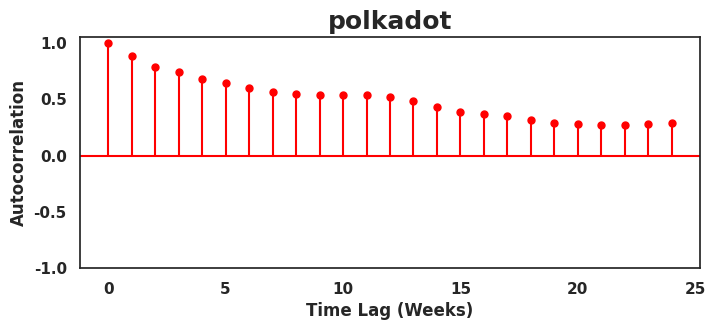

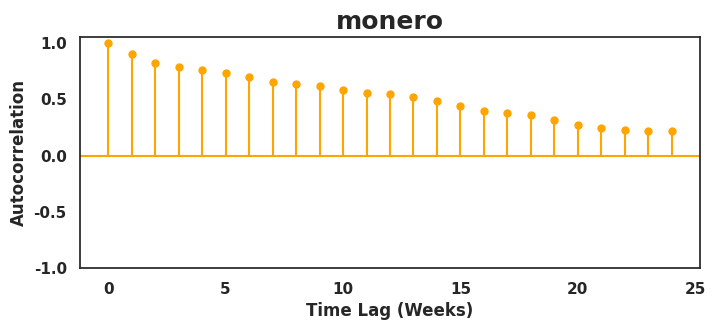

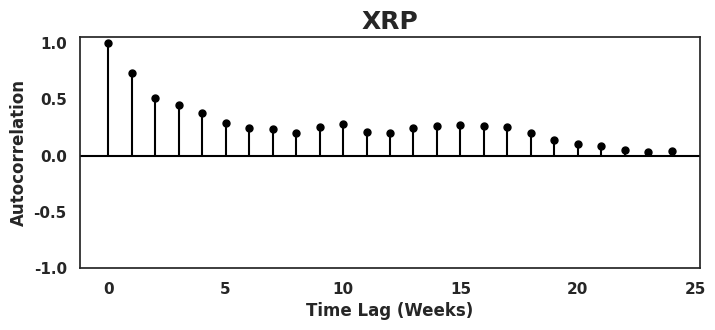

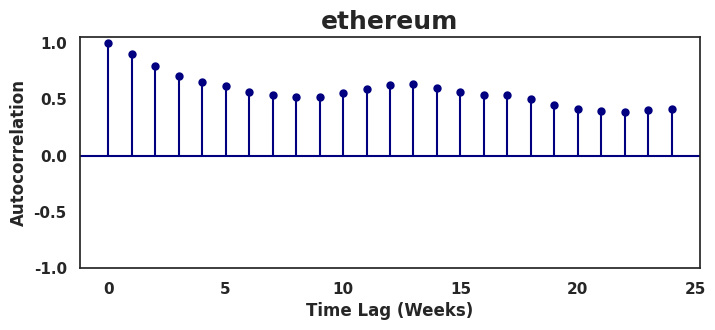

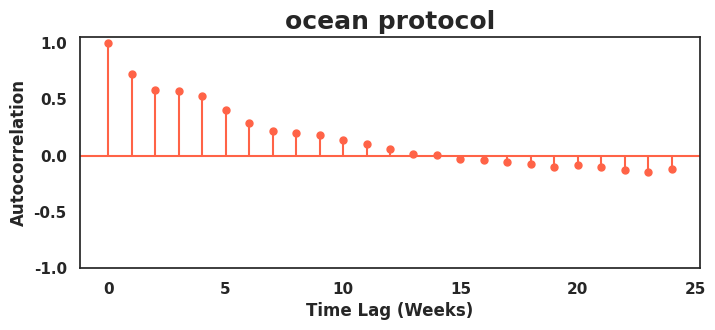

...

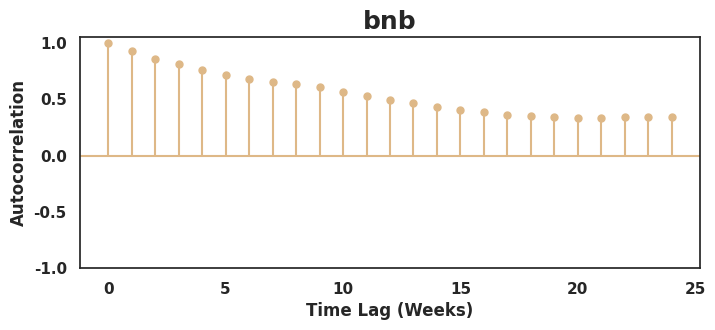

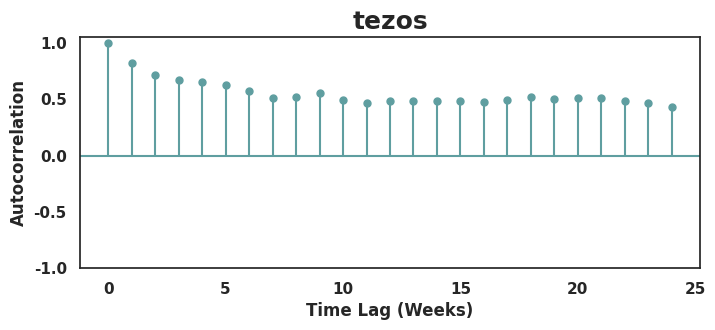

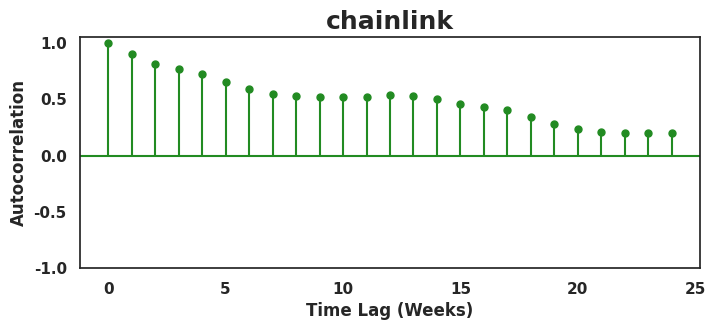

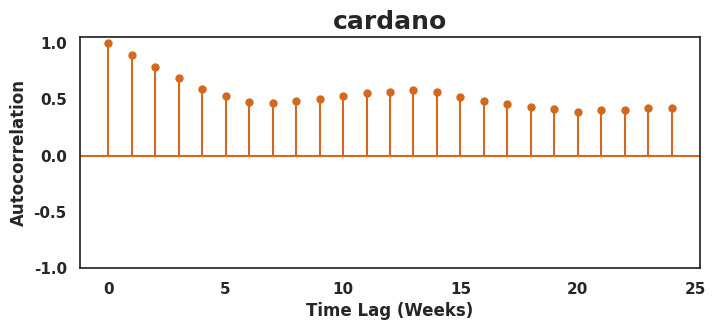

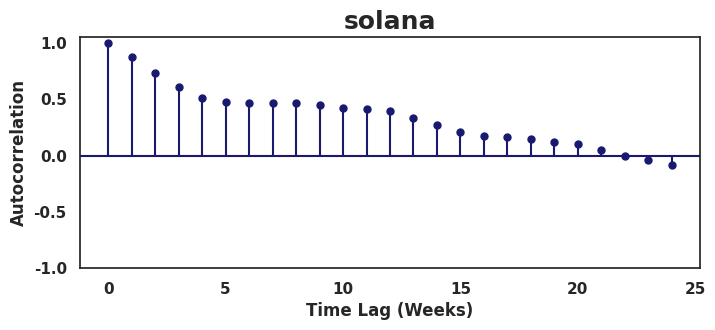

In [126]:
namelist = combined_df_dict.keys()
for c, myc in zip(namelist, color_list):
    ## PREPARE TIME SERIES DATA
    df = combined_df_dict[c][['Start_Date','Close_Ave','Volume_Ave','count']]
    df.columns = ['Date','Close_Price','Trade_Volume', 'Google Interest Trend']
    time_series = df['Google Interest Trend']
    time_series.index = df['Date']
        
   # Create a new figure and axis for each plot
    fig, ax = plt.subplots(figsize=(8, 3))  # Longer horizontally

    plot_acf(time_series, lags=24, alpha=None, ax=ax,color = myc)

    # Find the collection of vlines (which is a LineCollection object) and change their color
    vline_collection = ax.collections[0]  # The vlines are typically the first collection
    vline_collection.set_color(myc)
    ax.set_xlabel('Time Lag (Weeks)')
    ax.set_ylabel('Autocorrelation')
    ax.set_title(c,fontsize=18, fontweight='bold')
    ax.set_ylim([-1,1.05])
    # Save the plot
    fig.savefig(f'../results/trend_pattern/{c}_ACF.png', dpi=300,
                bbox_inches='tight', transparent=False, facecolor='white')

In [121]:
plt.show()

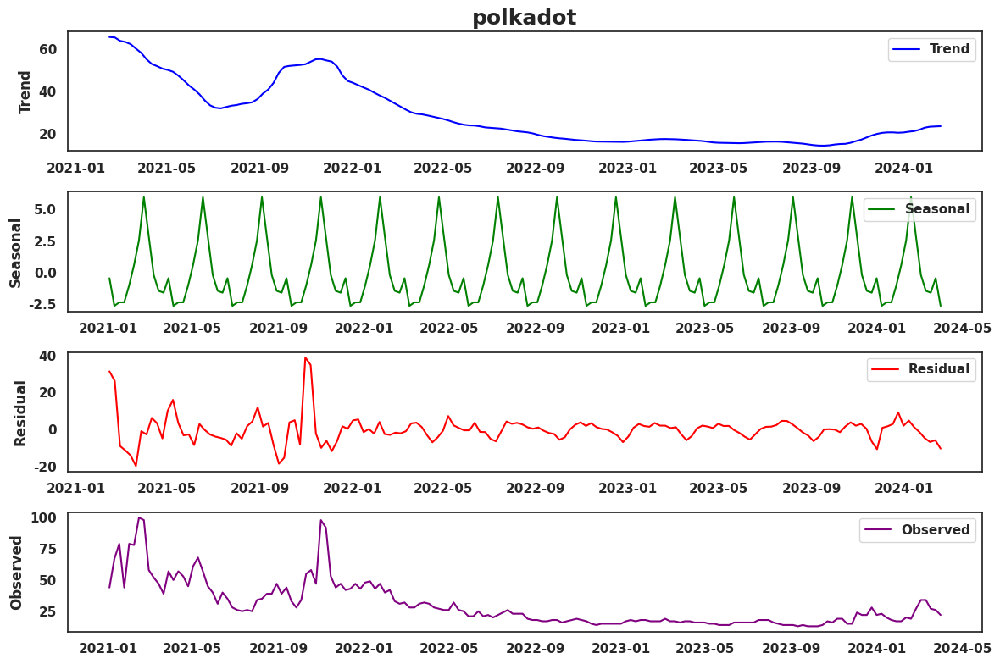

<Figure size 800x300 with 0 Axes>

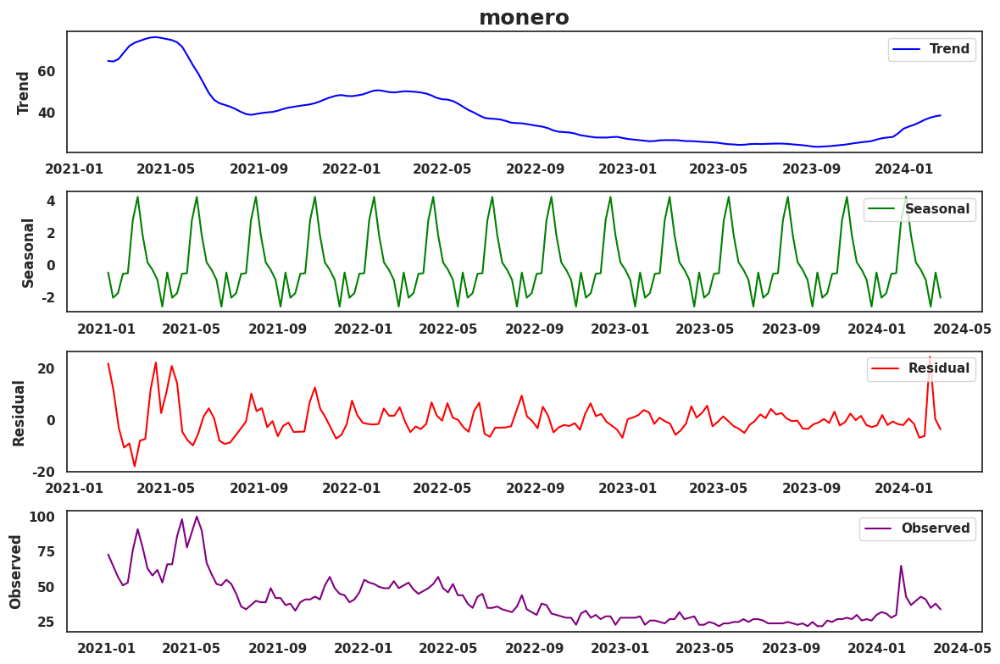

<Figure size 800x300 with 0 Axes>

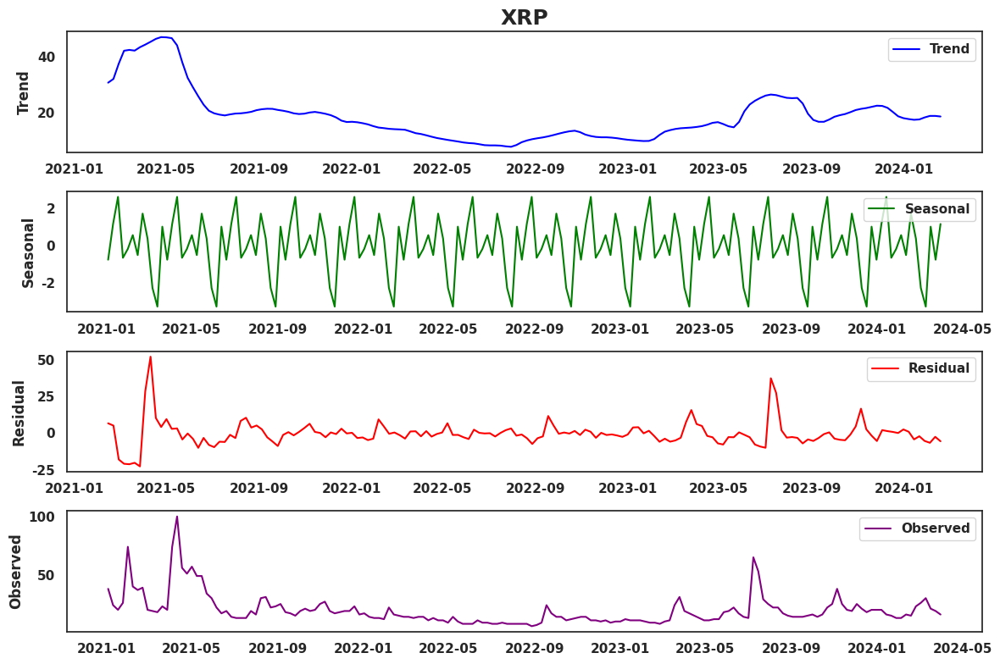

<Figure size 800x300 with 0 Axes>

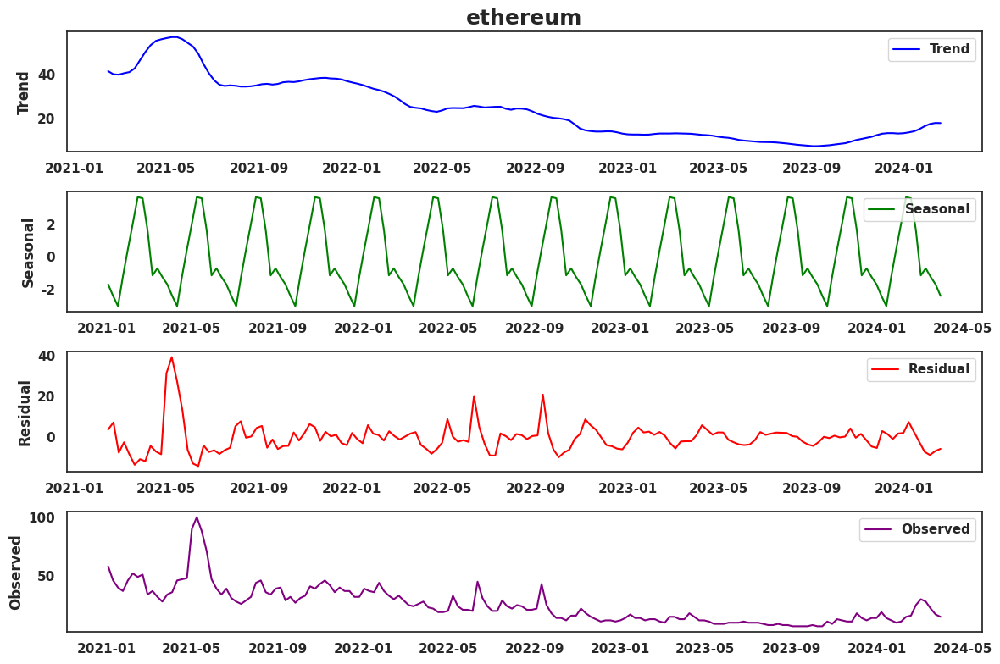

<Figure size 800x300 with 0 Axes>

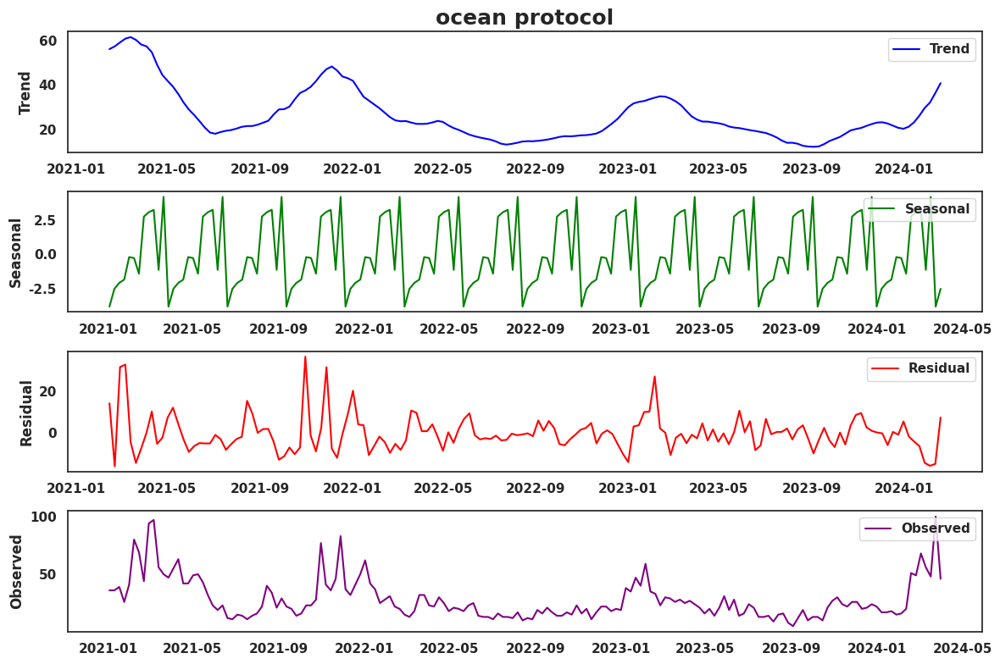

<Figure size 800x300 with 0 Axes>

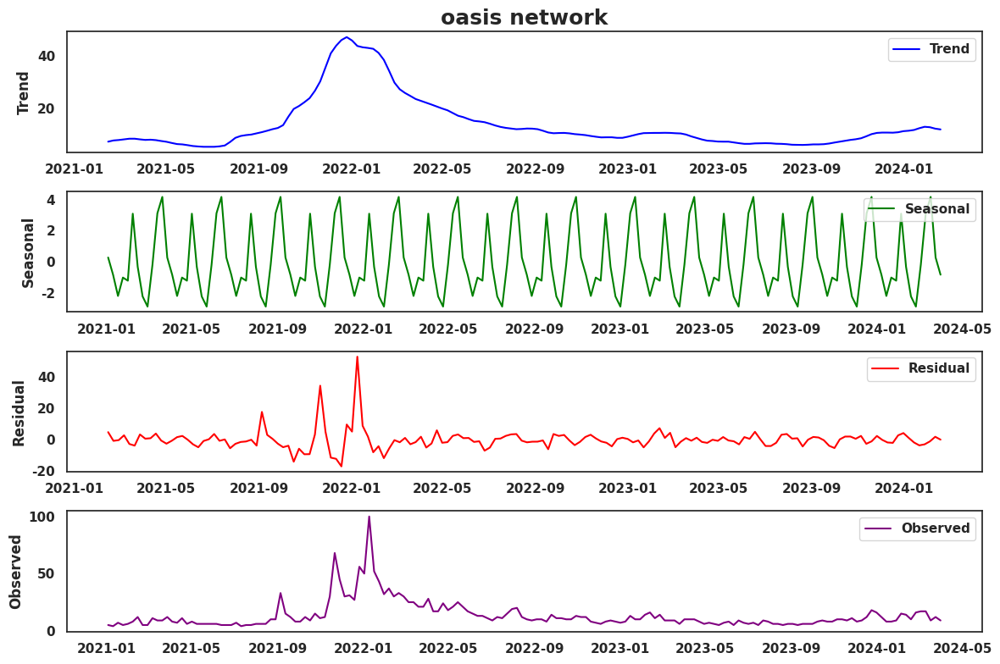

<Figure size 800x300 with 0 Axes>

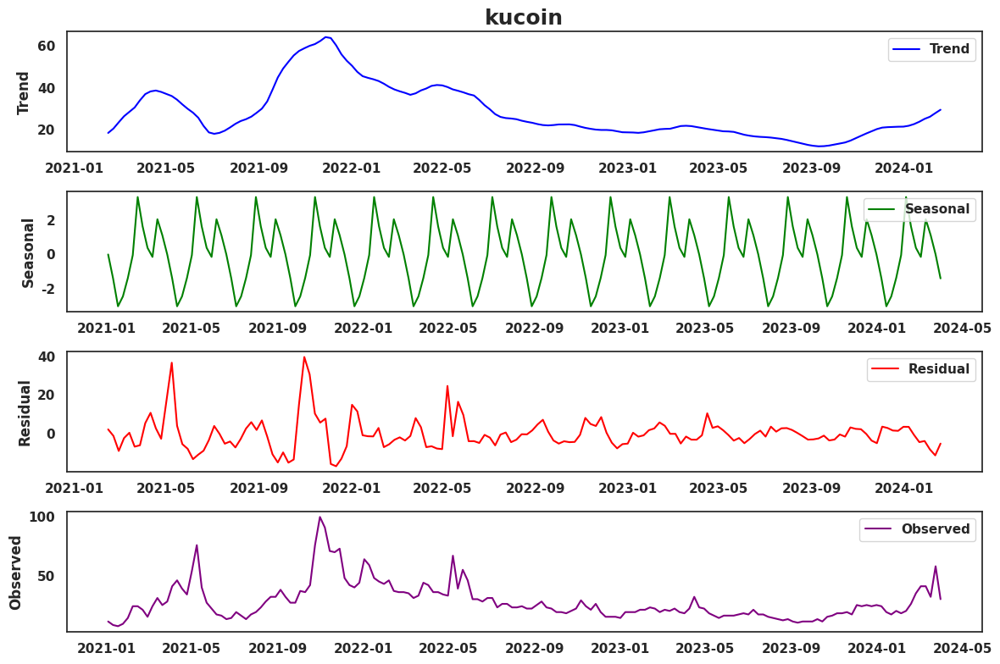

<Figure size 800x300 with 0 Axes>

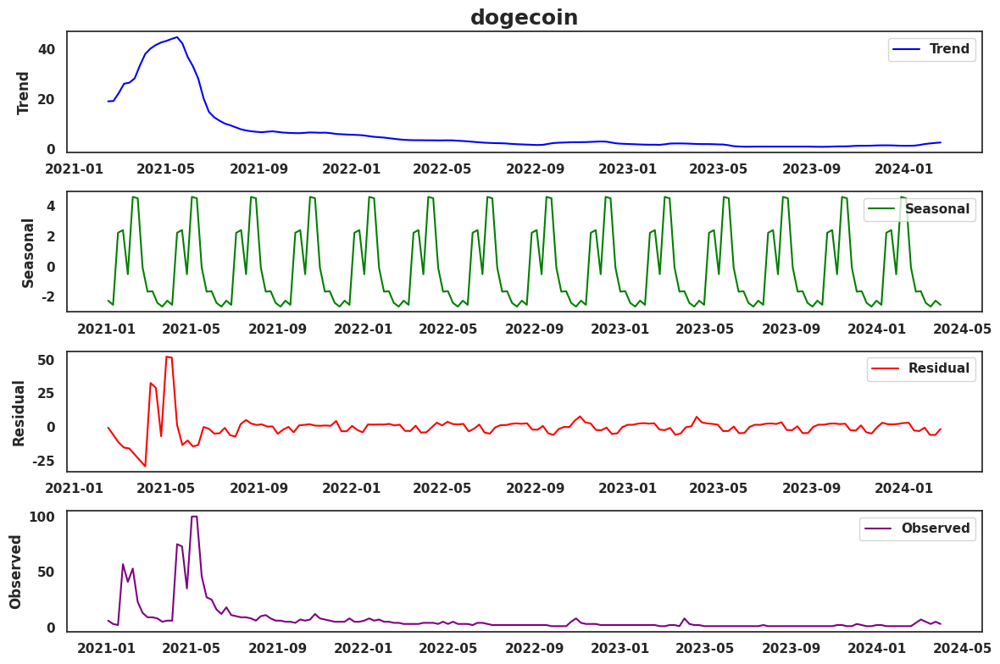

<Figure size 800x300 with 0 Axes>

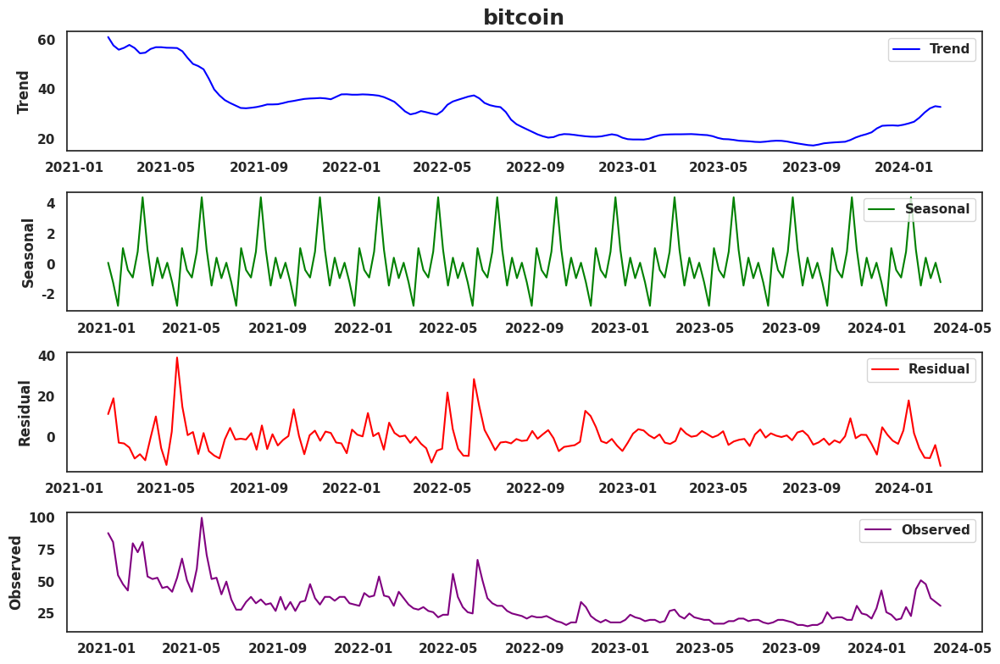

<Figure size 800x300 with 0 Axes>

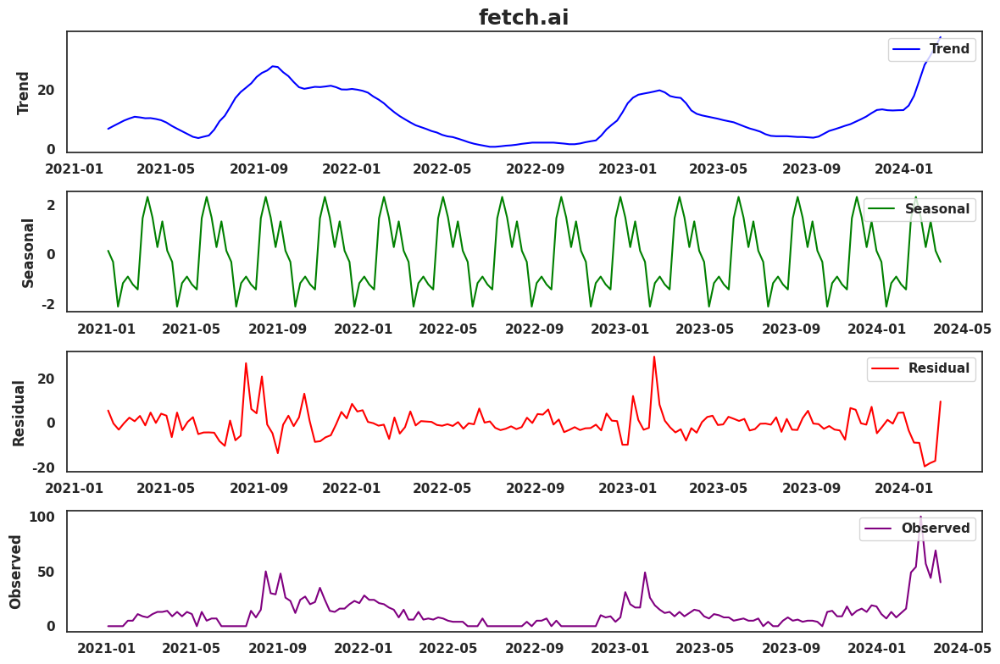

<Figure size 800x300 with 0 Axes>

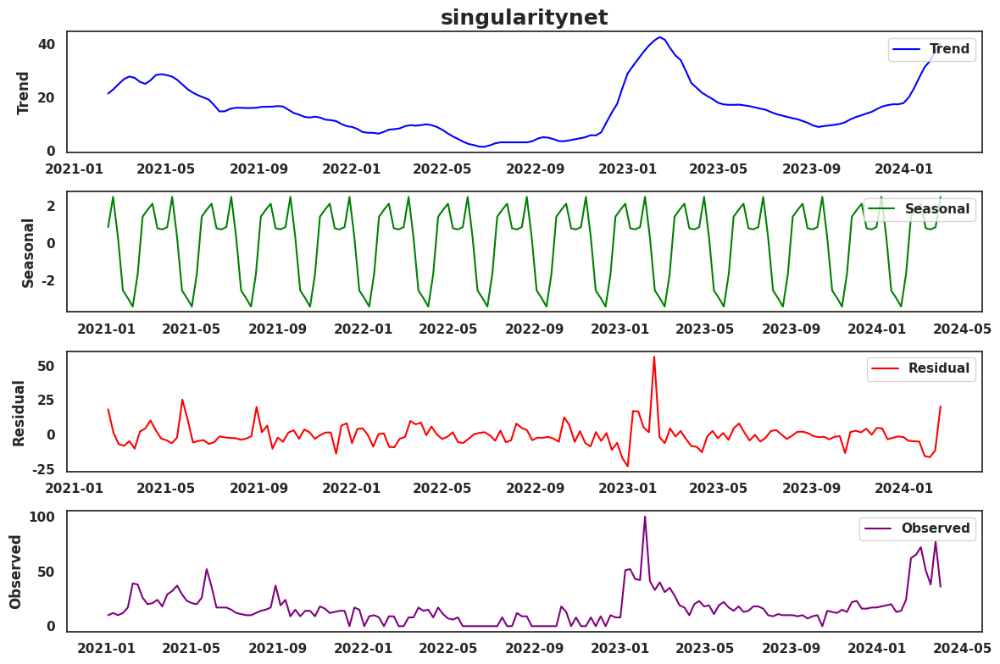

<Figure size 800x300 with 0 Axes>

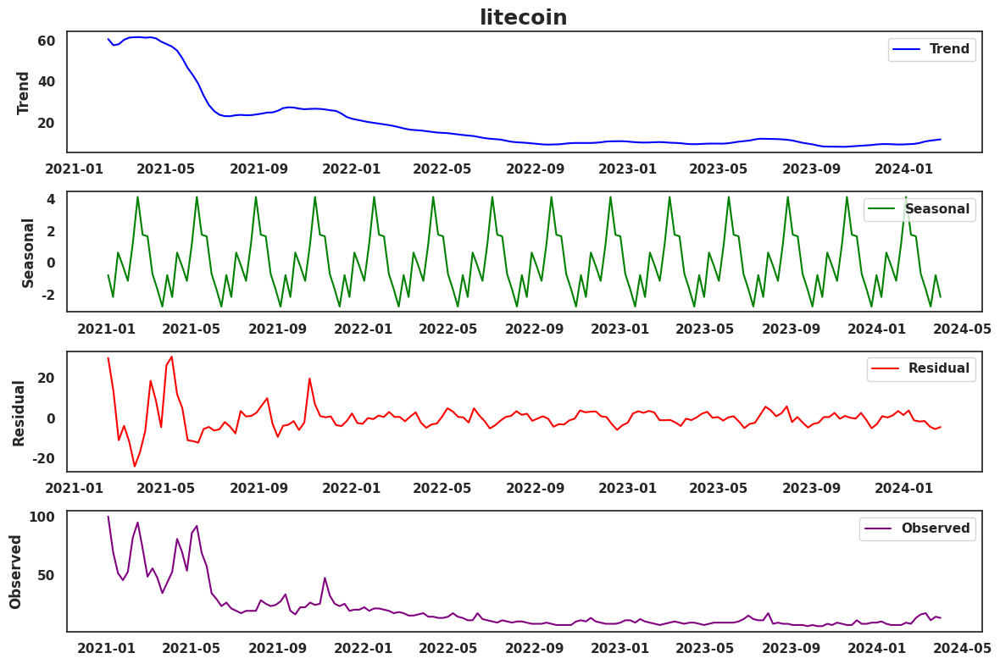

<Figure size 800x300 with 0 Axes>

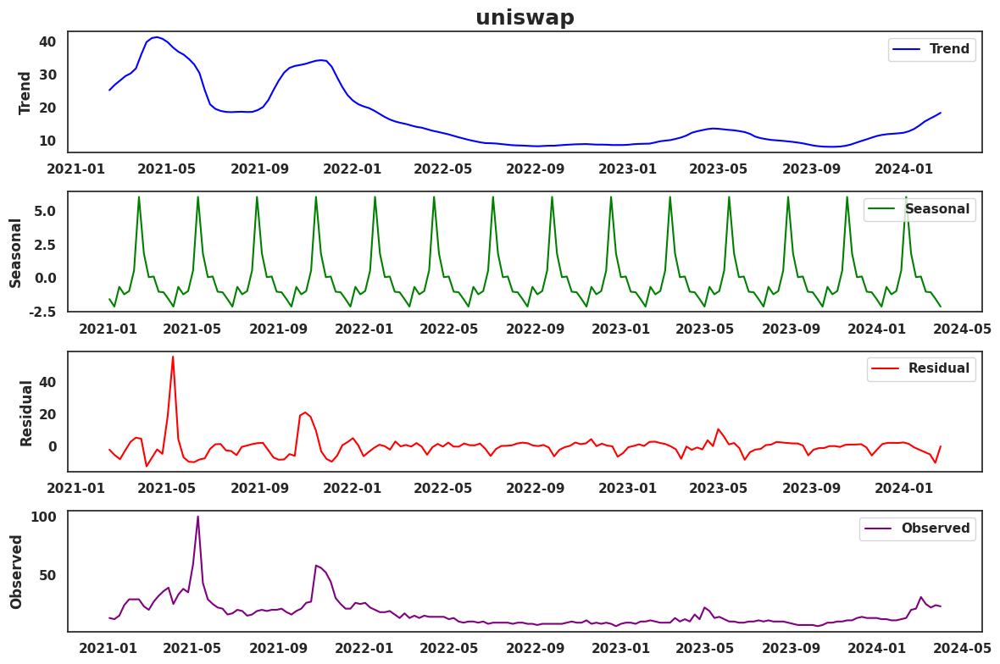

<Figure size 800x300 with 0 Axes>

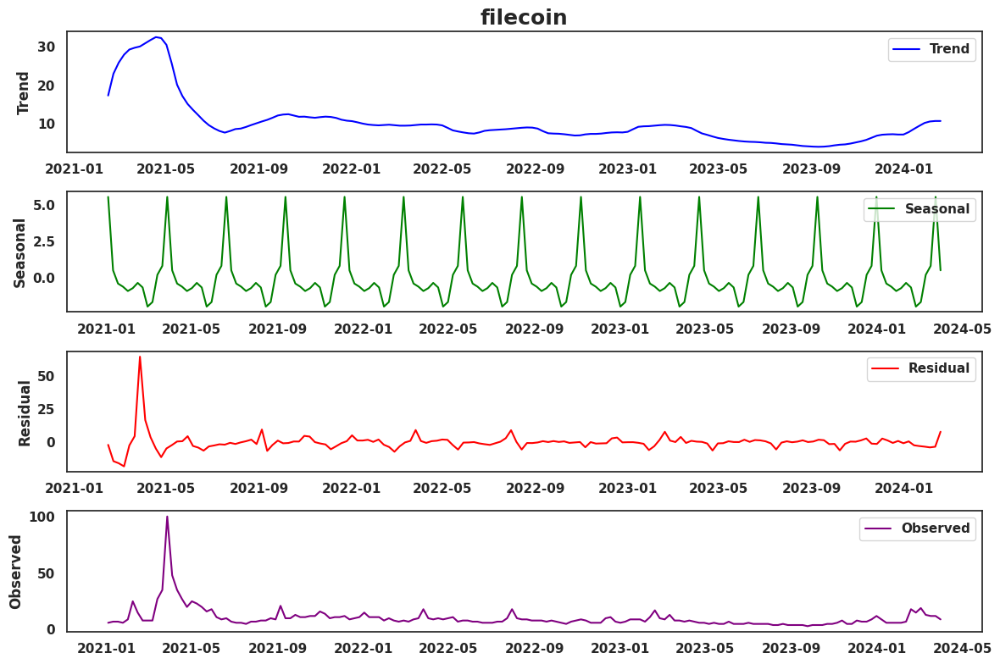

<Figure size 800x300 with 0 Axes>

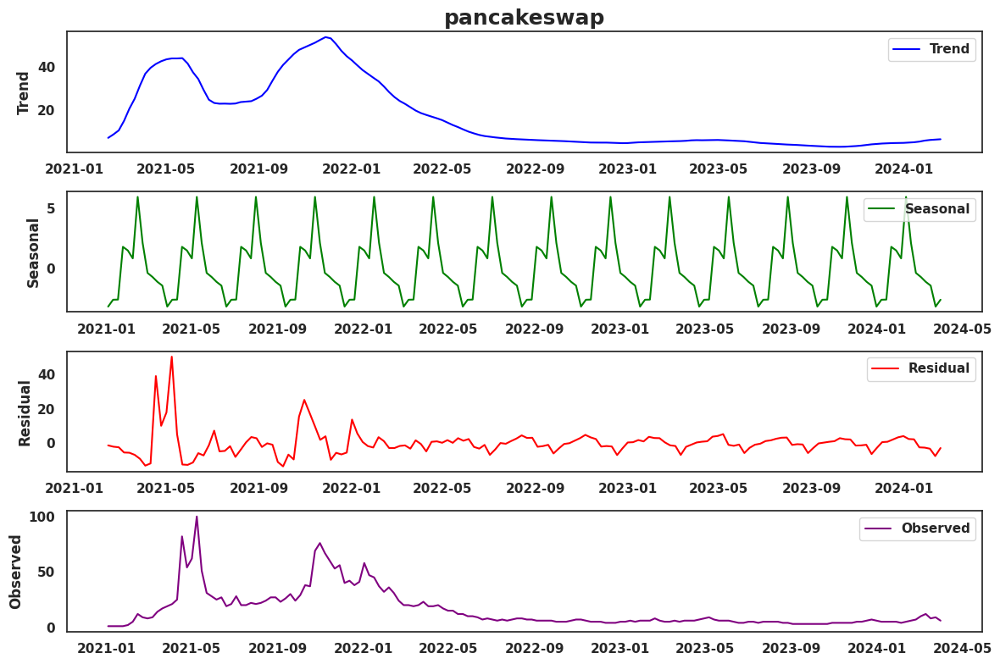

<Figure size 800x300 with 0 Axes>

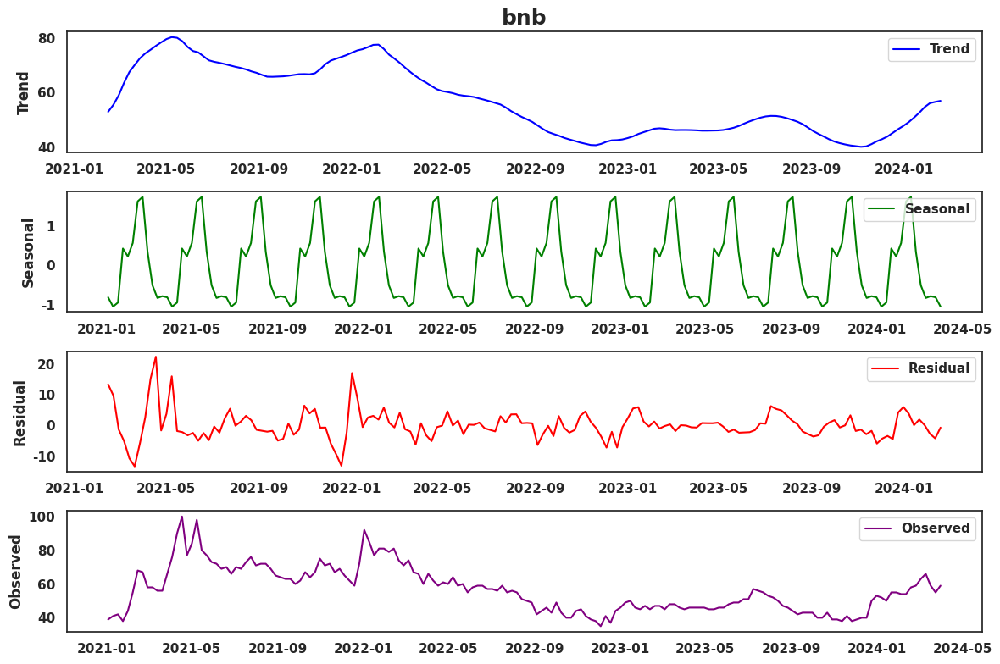

<Figure size 800x300 with 0 Axes>

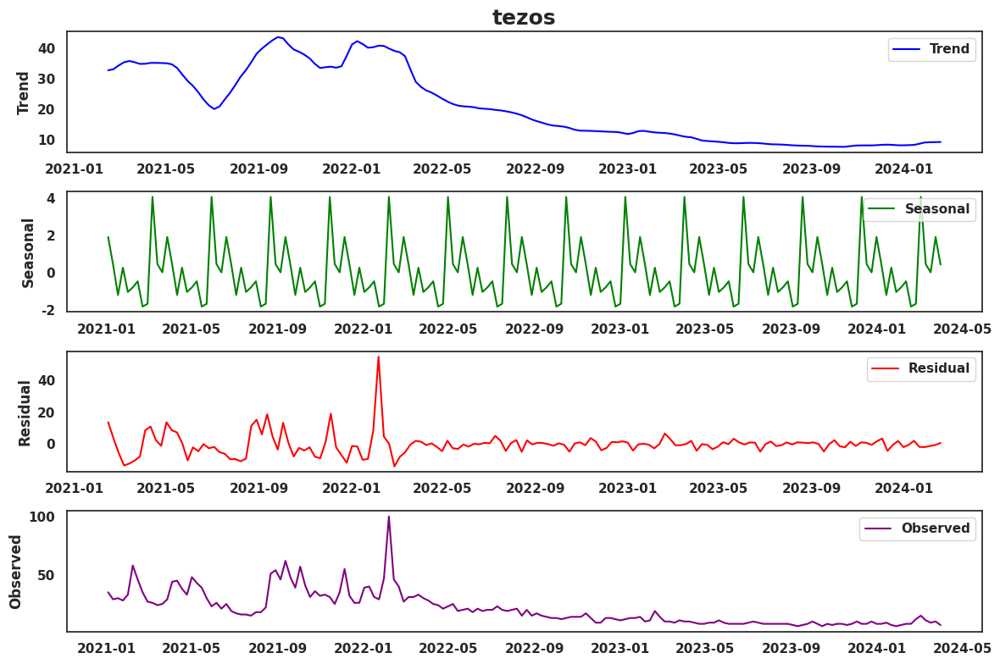

<Figure size 800x300 with 0 Axes>

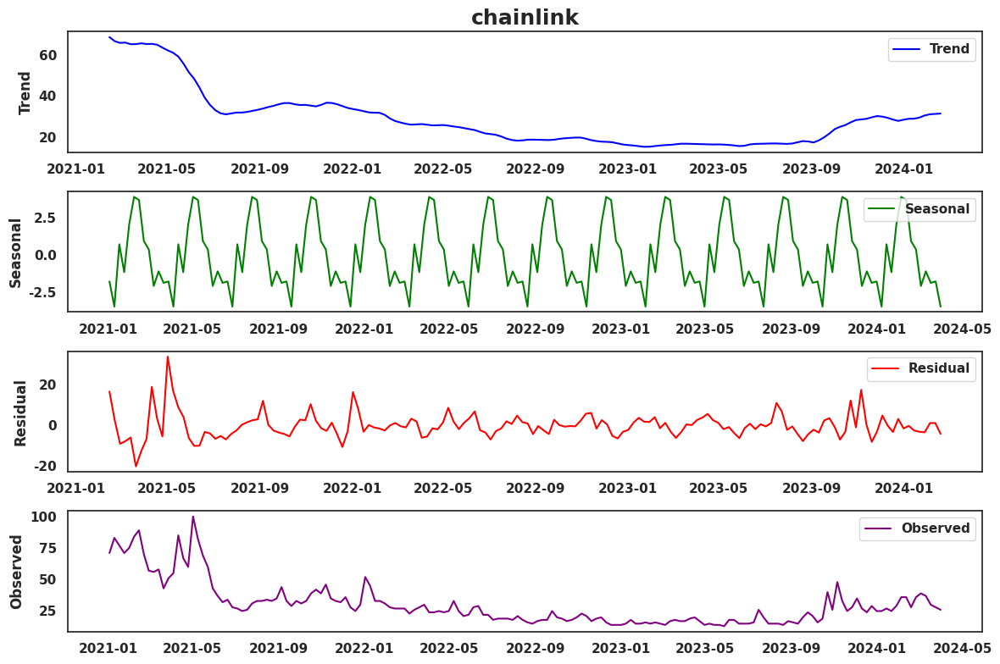

<Figure size 800x300 with 0 Axes>

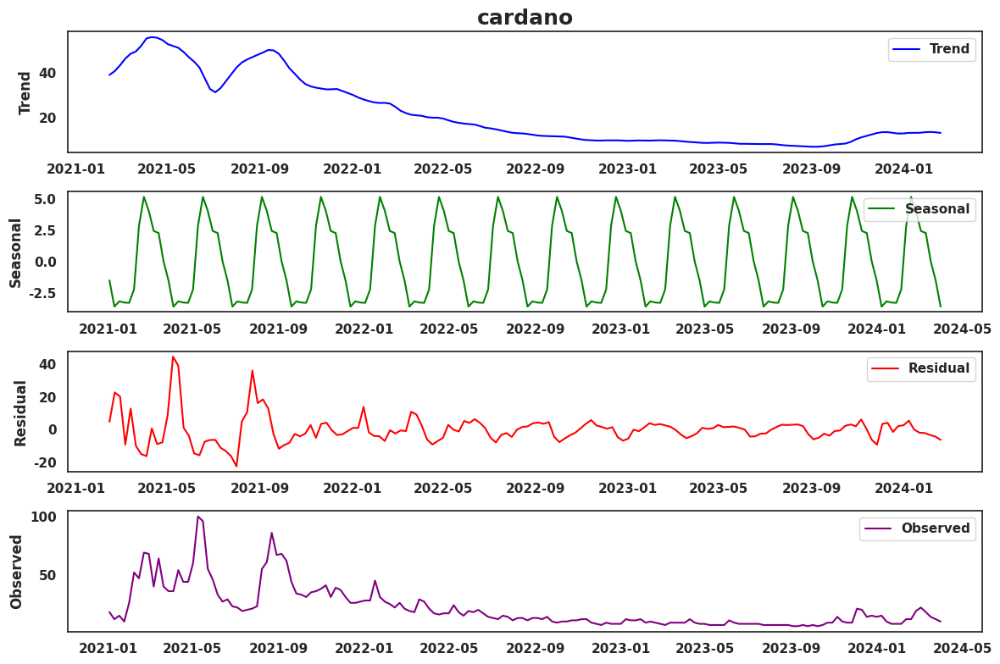

<Figure size 800x300 with 0 Axes>

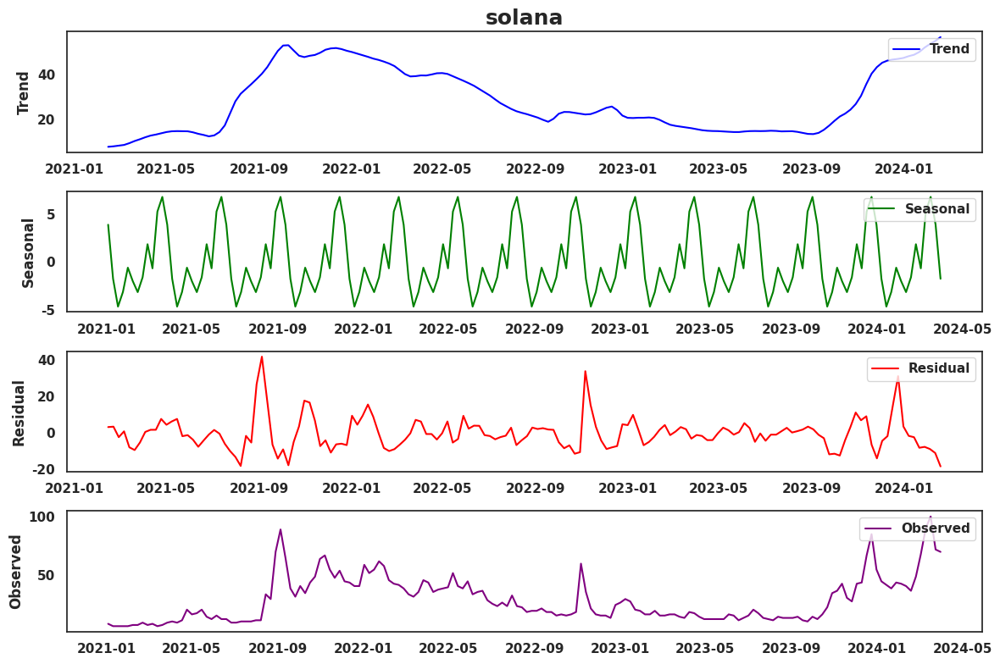

<Figure size 800x300 with 0 Axes>

In [119]:
namelist = combined_df_dict.keys()
for c, myc in zip(namelist, color_list):
    ## PREPARE TIME SERIES DATA
    df = combined_df_dict[c][['Start_Date','Close_Ave','Volume_Ave','count']]
    df.columns = ['Date','Close_Price','Trade_Volume', 'Google Interest Trend']
    time_series = df['Google Interest Trend']
    time_series.index = df['Date']
        
    
    # Decompose the time series data
    result = seasonal_decompose(time_series, model='additive', period=12)  # adjust the period based on your data's seasonality

    # Create a figure to host the plots
    fig, axs = plt.subplots(4, 1, figsize=(12, 8))  # Change figure size as needed

    # Plot each component with a different color
    axs[0].set_title(f'{c}', fontsize=18, fontweight='bold')
    axs[0].plot(result.trend, color='blue', label='Trend')
    axs[0].legend(loc='upper right')
    axs[0].set_ylabel('Trend')

    axs[1].plot(result.seasonal, color='green', label='Seasonal')
    axs[1].legend(loc='upper right')
    axs[1].set_ylabel('Seasonal')

    axs[2].plot(result.resid, color='red', label='Residual')
    axs[2].legend(loc='upper right')
    axs[2].set_ylabel('Residual')

    axs[3].plot(result.observed, color='purple', label='Observed')
    axs[3].legend(loc='upper right')
    axs[3].set_ylabel('Observed')

    # Adjust layout
    plt.tight_layout()

    # Show the decomposition plots
    plt.show()

    fig.savefig(f'../results/trend_pattern/{c}_pattern.png',dpi=300,
                bbox_inches='tight',transparent=False,facecolor='white')



    # Plot the Autocorrelation Function (ACF)
    plt.figure(figsize=(8, 3))  # Longer horizontally
    plot_acf(time_series, lags=24, alpha=None, ax=ax,color = myc)

    # Find the collection of vlines (which is a LineCollection object) and change their color
    vline_collection = ax.collections[0]  # The vlines are typically the first collection
    vline_collection.set_color(myc)
    ax.set_xlabel('Time Lag (Weeks)')
    ax.set_ylabel('Autocorrelation')
    ax.set_title(c,fontsize=18, fontweight='bold')
    ax.set_ylim([-1,1.05])
    fig.savefig(f'../results/trend_pattern/{c}_ACF.png',dpi=300,
                bbox_inches='tight',transparent=False,facecolor='white')

## 4.5 Bring in additional data source 


Before/After halving (from Binance) this section will be a great addition of insights
Analyze how trends during the Before/After Halving is different from the previous pattern found for the long term
and during the previous before/after halving

In [ ]:
# Bring in trend Data for 2024 

In [ ]:
# Also data on Hourly basis and 5 minutes basis for several interesting pairs 

In [ ]:
# Add some insights into the actual big player behind Huge single entity transactions across the years. 
# Look into Arkham for insights. 

In [ ]:
#The Halving will happen on 20th April 
#So we bring data from 5 days before and after the Halving, we look into the hourly basis data. 




In [ ]:
# Specialized Highlight section addressing the data of 5 days before and after Halving

# Here Halving Cutoff placed on 20th 00.00 UTC. 

## 4.6 Machine Learning Model 

Let's Build a trend model for several tokens here
BTC ETH is a must
do also for ocean 
polkadot
filecoin 
fetch
singularity

6 Tokens in total 



In [ ]:
#Quick Model Build

BTC
ETH
BNB
SOL



FET
OCEAN
AGIX
LINK

We build 10 Models 
The performance analysis for each models

In [ ]:
# Create best Average Daily Price ? or others 
# See whic

In [ ]:
Do One test with ETH
Do another with OCEAN

In [ ]:
# Start with the modelling approach